### Migration between counties

We pursue to relate fluctuations in the population data with transition rates among counties. This with hopes of finding distinctions between enviromental (vexation) and overpopulation (frustration) effects.

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas as pd
import seaborn as sns
import csv
import math
import vincent
import json
from scipy import stats
vincent.core.initialize_notebook()


## Testing pandas by plotting iris dataset

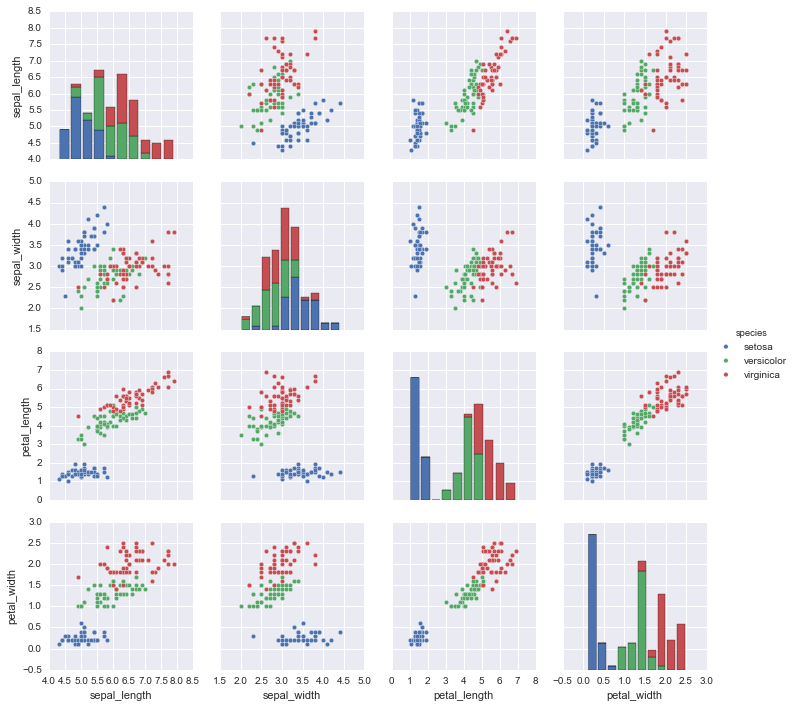

In [3]:

sns.set()

df1 = sns.load_dataset("iris")
sns.pairplot(df1, hue="species")



## Loading the population per county dataset

In [4]:
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))

In [5]:
pd.DataFrame(a[1:][:],columns=a[0][:])

,geofips,geoname,region,table,linecode,industryclassification,description,Y1969,Y1970,Y1971,...,Y2007,Y2008,Y2009,Y2010,Y2011,Y2012,Y2013,Y2014,Y2015,county
0,01001,"Autauga, AL",5,CA1,2,...,Population (persons) 1/,25166,24606,25508,...,52405,53277,54135,54660,55253,55175,55038,55290,55347,001
1,01003,"Baldwin, AL",5,CA1,2,...,Population (persons) 1/,56951,59474,60142,...,172404,175827,179406,183193,186659,190396,195126,199713,203709,003
2,01005,"Barbour, AL",5,CA1,2,...,Population (persons) 1/,23818,22655,23092,...,27757,27808,27657,27341,27226,27159,26973,26815,26489,005
3,01007,"Bibb, AL",5,CA1,2,...,Population (persons) 1/,14994,13798,13919,...,22438,22705,22941,22861,22733,22642,22512,22549,22583,007
4,01009,"Blount, AL",5,CA1,2,...,Population (persons) 1/,26411,26999,27817,...,56240,57055,57341,57373,57711,57776,57734,57658,57673,009
5,01011,"Bullock, AL",5,CA1,2,...,Population (persons) 1/,12554,11749,11418,...,11011,10953,10987,10887,10629,10606,10628,10829,10696,011
6,01013,"Butler, AL",5,CA1,2,...,Population (persons) 1/,22726,21987,21846,...,20894,20949,20867,20944,20673,20408,20261,20276,20154,013
7,01015,"Calhoun, AL",5,CA1,2,...,Population (persons) 1/,102946,103125,103622,...,116211,117274,118363,118437,117768,117286,116575,115993,115620,015
8,01017,"Chambers, AL",5,CA1,2,...,Population (persons) 1/,37814,36274,36280,...,34847,34563,34384,34098,33993,34075,34153,34052,34123,017
9,01019,"Cherokee, AL",5,CA1,2,...,Population (persons) 1/,15904,15771,16522,...,25553,25636,25854,25976,26080,26023,26084,25995,25859,019


## Proof of concept by looking at the distributions for three cities

We look for interesting bahavior by ploting cummulative distributions (looking for possible power law behavior) and correlation functions (looking for periodic behavior)

________BROOKLYN_________

2603330 9542.5 395.227272727 Kings, NY


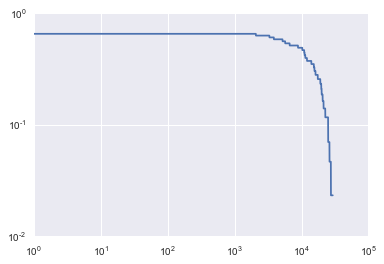

In [6]:
a[1875]
c=(a[1875][8:-2])
nearest=diff((np.array(c, dtype=np.int)))
print c[0], np.median(nearest), np.mean(nearest),a[1875][1]
bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
loglog((bins[:-1]),(1-np.cumsum(values)))
show()

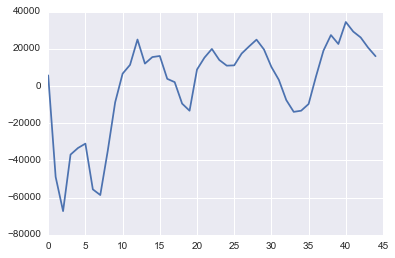

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  """


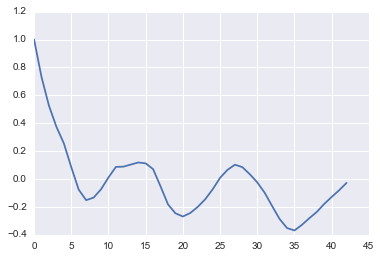

In [7]:
c=(a[1875][8:-1])
plot(diff((np.array(c, dtype=np.int))))
show()
corr=correlate(diff((np.array(c, dtype=np.int))),diff((np.array(c, dtype=np.int))),'full');
corr=(corr[(floor(size(corr)+1)/2.0):-1])

plot(corr/float(corr[0]))
show()

__SALT LAKE___

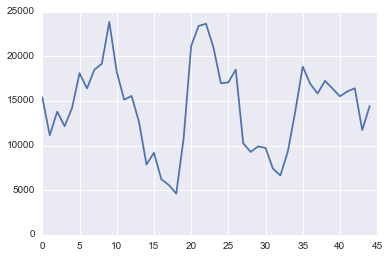

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  """


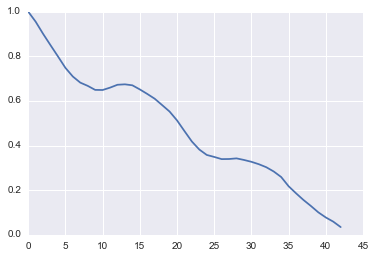

In [8]:
c=(a[2818][8:-1])
plot(diff((np.array(c, dtype=np.int))))
show()
corr=correlate(diff((np.array(c, dtype=np.int))),diff((np.array(c, dtype=np.int))),'full');
corr=(corr[(floor(size(corr)+1)/2.0):-1])

plot(corr/float(corr[0]))
show()

___Blount, AL__

['01007', 'Bibb, AL', '5', 'CA1', '2', '...', 'Population (persons) 1/', '14994', '13798', '13919', '14097', '14654', '14391', '14778', '14763', '15257', '15355', '15550', '15751', '15836', '16020', '15999', '16089', '16157', '15918', '16165', '16136', '16360', '16697', '17071', '17403', '17757', '18053', '18507', '18885', '19388', '19851', '20560', '19913', '21028', '21199', '21399', '21721', '22042', '22099', '22438', '22705', '22941', '22861', '22733', '22642', '22512', '22549', '22583', '007']


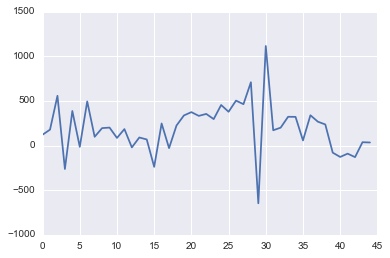

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  


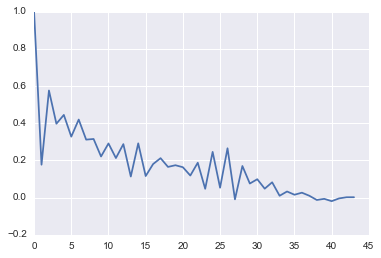

In [9]:
c=(a[4][8:-1])
print a[4]
plot(diff((np.array(c, dtype=np.int))))
show()
corr=correlate(diff((np.array(c, dtype=np.int))),diff((np.array(c, dtype=np.int))),'full');
corr=(corr[(floor(size(corr)-1)/2.0):-1])

plot(corr/float(corr[0]))
show()

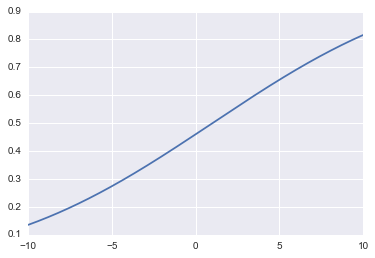

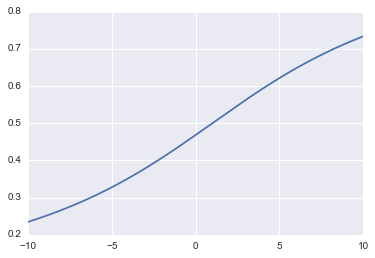

In [10]:
from scipy.special import erf
from scipy.optimize import curve_fit

def erfunc(x, mu, sig):
    return 0.5*(1+erf((x-mu)/(sig*np.sqrt(2))))
xlin=np.linspace(-10,10,1000)
mu,sig=1,10
plot(xlin,erfunc(xlin, mu, sig))
show()
def cauch(x, mu, sig):
    return np.arctan((x-mu)/sig)/np.pi + 0.5
xlin=np.linspace(-10,10,1000)
mu,sig=1,10
plot(xlin,cauch(xlin, mu, sig))
show()

Los Angeles, CA
NormaltestResult(statistic=0.75357207371521417, pvalue=0.686062850356425)
initial pop, median, mean,std 946000 69542.0 69867.1555556 25103.6989394 Maricopa, AZ


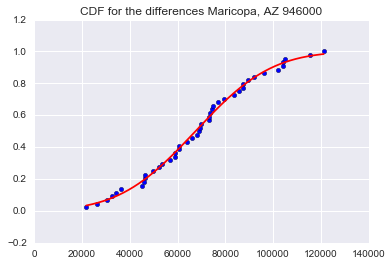

mu and sigma for the gaussian cdf [ 67478.27760746  25016.77606537] 
 

NormaltestResult(statistic=1.9522268911624319, pvalue=0.37677260413125457)
initial pop, median, mean,std 1060099 13813.0 12283.3555556 10805.0754394 Alameda, CA


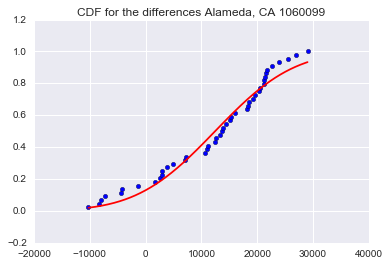

mu and sigma for the gaussian cdf [ 12444.05862236  11038.14692252] 
 

NormaltestResult(statistic=0.21919374524608107, pvalue=0.8961953433632196)
initial pop, median, mean,std 6989910 70593.0 69322.8 55932.9838927 Los Angeles, CA


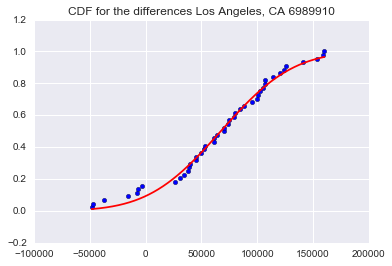

mu and sigma for the gaussian cdf [ 67279.60571693  50923.03257367] 
 

NormaltestResult(statistic=6.4158915556132809, pvalue=0.040439599929998196)
initial pop, median, mean,std 1376796 39462.0 39292.5555556 16928.6305262 Orange, CA


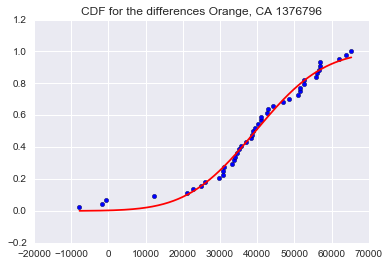

mu and sigma for the gaussian cdf [ 39502.9026374   14430.58735503] 
 

NormaltestResult(statistic=6.8330512570502293, pvalue=0.032826287758811828)
initial pop, median, mean,std 450477 34529.0 41730.0444444 23263.9539985 Riverside, CA


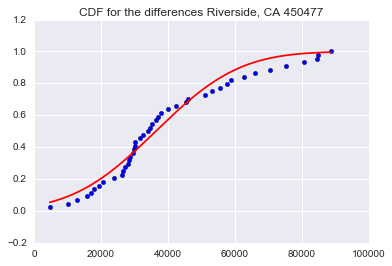

mu and sigma for the gaussian cdf [ 36358.98540473  19698.80045359] 
 

NormaltestResult(statistic=5.9632992953326784, pvalue=0.050709112659278389)
initial pop, median, mean,std 671688 29978.0 31971.0666667 20432.1916325 San Bernardino, CA


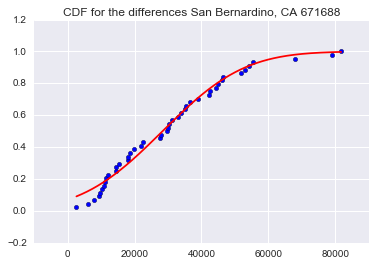

mu and sigma for the gaussian cdf [ 28353.90355379  19264.3815755 ] 
 

NormaltestResult(statistic=0.4171677407966326, pvalue=0.81173295148153302)
initial pop, median, mean,std 1340989 42055.0 42771.3555556 20221.3446351 San Diego, CA


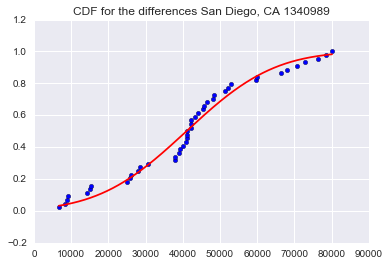

mu and sigma for the gaussian cdf [ 40963.16579379  18566.16046227] 
 

NormaltestResult(statistic=12.769330051847682, pvalue=0.0016872335804663369)
initial pop, median, mean,std 1033442 21707.0 19168.8444444 11318.1129581 Santa Clara, CA


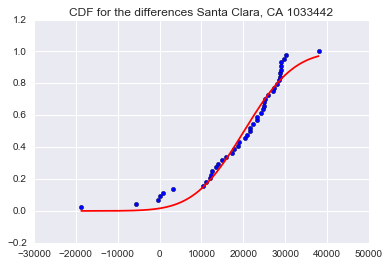

mu and sigma for the gaussian cdf [ 20156.37464139   9397.82672066] 
 

NormaltestResult(statistic=7.4642049884408532, pvalue=0.023942444030834165)
initial pop, median, mean,std 595651 29114.0 28311.7333333 14977.761845 Broward, FL


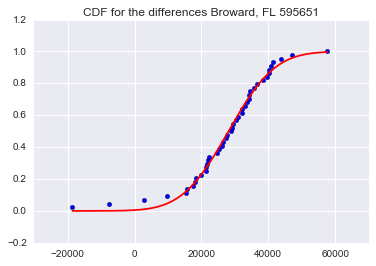

mu and sigma for the gaussian cdf [ 28076.82937187  10905.26035204] 
 

NormaltestResult(statistic=4.4154685618428999, pvalue=0.10994948115376206)
initial pop, median, mean,std 1249884 29556.0 31533.7555556 14481.7130573 Miami-Dade, FL


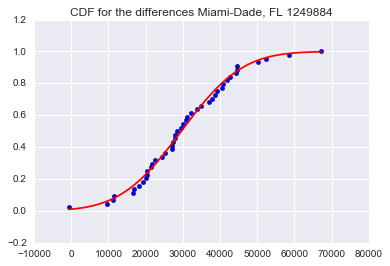

mu and sigma for the gaussian cdf [ 29569.2857914   12886.07265836] 
 

NormaltestResult(statistic=4.3120587119080023, pvalue=0.11578394635645535)
initial pop, median, mean,std 5473709 -11260.0 -5000.11111111 26433.0157536 Cook, IL


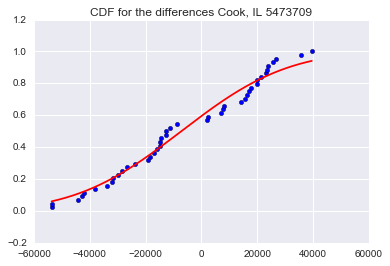

mu and sigma for the gaussian cdf [ -7220.98602574  29904.70391553] 
 

NormaltestResult(statistic=0.46252005719011624, pvalue=0.79353309790901716)
initial pop, median, mean,std 1386993 4456.0 4122.88888889 7783.21556291 Middlesex, MA


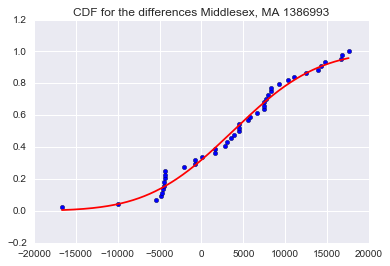

mu and sigma for the gaussian cdf [ 3734.61259413  7985.06964423] 
 

NormaltestResult(statistic=2.3037130557312251, pvalue=0.31604946973119136)
initial pop, median, mean,std 2685171 -16801.0 -20425.8444444 15337.7122689 Wayne, MI


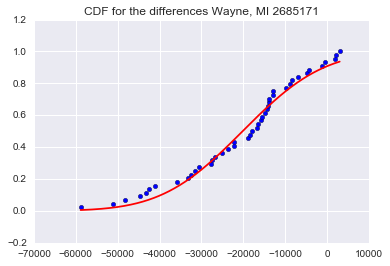

mu and sigma for the gaussian cdf [-20169.73850209  15199.45790101] 
 

NormaltestResult(statistic=32.369054666960963, pvalue=9.3572684017039833e-08)
initial pop, median, mean,std 267479 30988.0 40037.0444444 22803.4987656 Clark, NV


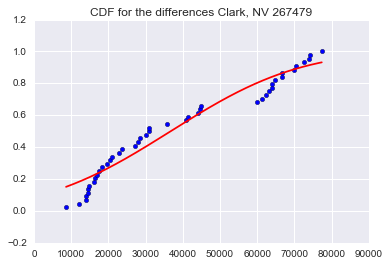

mu and sigma for the gaussian cdf [ 36723.6989794   27252.11073375] 
 

NormaltestResult(statistic=9.8061949833924764, pvalue=0.0074235530277938742)
initial pop, median, mean,std 2596639 8839.0 535.133333333 25079.5045119 Kings, NY


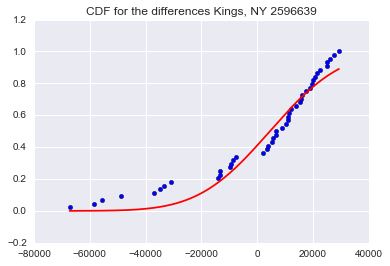

mu and sigma for the gaussian cdf [  4518.79695906  20134.38202635] 
 

NormaltestResult(statistic=8.4206862010601267, pvalue=0.014841275414982785)
initial pop, median, mean,std 1543762 3683.0 2071.2 9822.2568658 New York, NY


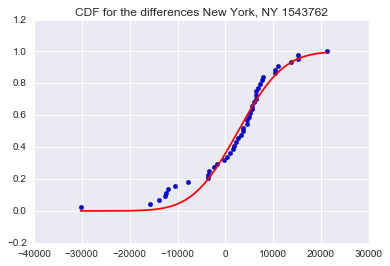

mu and sigma for the gaussian cdf [ 2658.61946321  7427.9836992 ] 
 

NormaltestResult(statistic=6.7654667508744586, pvalue=0.033954517332397717)
initial pop, median, mean,std 1966669 6856.0 7906.24444444 16030.6558127 Queens, NY


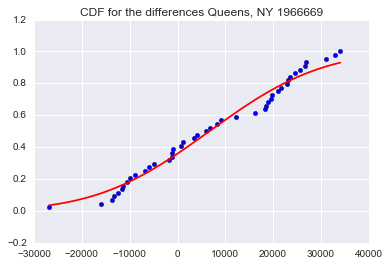

mu and sigma for the gaussian cdf [  6668.35397937  18522.80255847] 
 

NormaltestResult(statistic=18.738628483409322, pvalue=8.5301864828681029e-05)
initial pop, median, mean,std 1092090 7366.0 9116.71111111 8663.31238582 Suffolk, NY


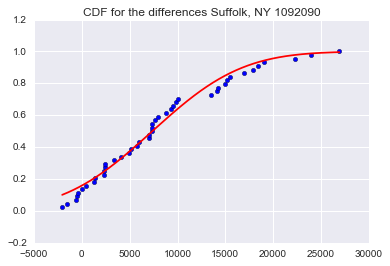

mu and sigma for the gaussian cdf [ 7362.92106348  7380.36679458] 
 

NormaltestResult(statistic=1.9181748128665528, pvalue=0.38324247104988024)
initial pop, median, mean,std 1953285 -6639.0 -8704.95555556 12785.8591958 Philadelphia, PA


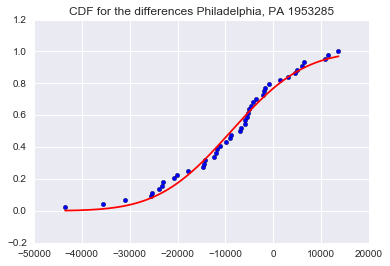

mu and sigma for the gaussian cdf [ -8797.15321034  11978.1482232 ] 
 

NormaltestResult(statistic=0.11122011745492805, pvalue=0.94590791252021922)
initial pop, median, mean,std 821568 22997.0 23082.3555556 9722.79766358 Bexar, TX


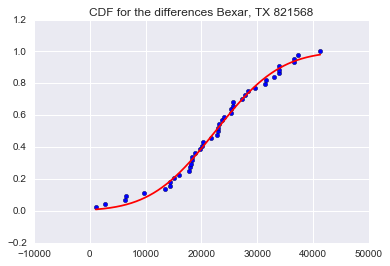

mu and sigma for the gaussian cdf [ 22496.12572328   9125.94096143] 
 

NormaltestResult(statistic=3.6848725395370092, pvalue=0.15843097495376091)
initial pop, median, mean,std 1282675 29359.0 27487.7777778 14014.1819389 Dallas, TX


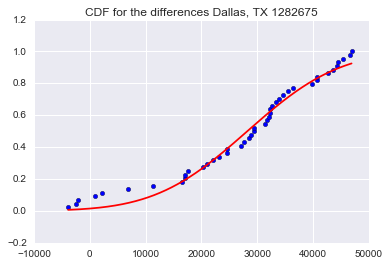

mu and sigma for the gaussian cdf [ 28215.5934983   12979.52598492] 
 

NormaltestResult(statistic=5.7913972117297536, pvalue=0.05526040636264528)
initial pop, median, mean,std 1709436 64621.0 60847.5777778 33486.5993645 Harris, TX


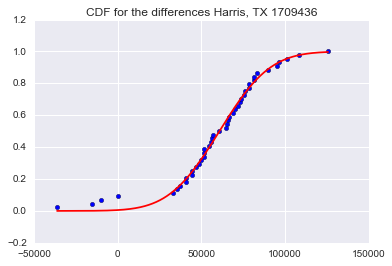

mu and sigma for the gaussian cdf [ 60726.52106825  23768.24166197] 
 

NormaltestResult(statistic=7.3199457986475318, pvalue=0.025733210104305692)
initial pop, median, mean,std 684887 31453.0 28032.4222222 10484.4028357 Tarrant, TX


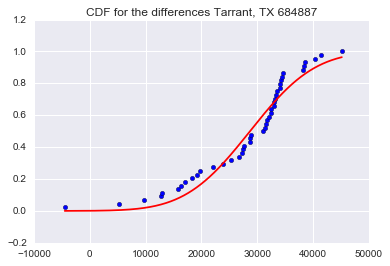

mu and sigma for the gaussian cdf [ 28697.03235209   9128.66974959] 
 

NormaltestResult(statistic=2.0189493390974871, pvalue=0.36441036515835473)
initial pop, median, mean,std 1142545 23865.0 20883.1777778 12382.958884 King, WA


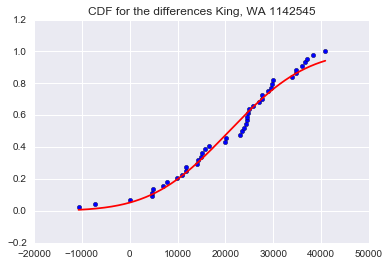

mu and sigma for the gaussian cdf [ 20786.34144338  12794.16384398] 
 



In [11]:
##GAUSSIAN
county=178
central=[]
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
print a[229][1]
for i in range(1,np.size(np.array(a).T[1,:]) ):
    
    #print i
    c= np.array([x for x in a[i][7:-2] if x!='(NA)' ] , dtype=np.int) #####key formatting thingy
    if (c[-2]>1500000):
        nearest=diff((np.array(c, dtype=np.int)))
        n = stats.normaltest(nearest)
        print n
        central.append([np.median(nearest), np.mean(nearest)])
        print 'initial pop, median, mean,std',c[0], np.median(nearest), np.mean(nearest),np.std(nearest),a[i][1]
        bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
        values, base = np.histogram(nearest, bins=bins, density=1)
        u, indices = np.unique(np.cumsum(values), return_index=True)
        init=bins[:-1]
        x=[init[j] for j in indices]
        scatter(x, u)
        
        xlin=np.linspace(min(x),max(x),1000)
        superior_params, extras = curve_fit(erfunc, x, u,p0=[np.mean(nearest),np.std(nearest)])
        plot(xlin, erfunc(xlin, *superior_params),'r')
        title('CDF for the differences '+a[i][1]+' '+str(c[0]))
        show()
        print 'mu and sigma for the gaussian cdf', superior_params, '\n \n'

Los Angeles, CA
initial pop, median, mean,std 946000 69542.0 69867.1555556 25103.6989394 Maricopa, AZ


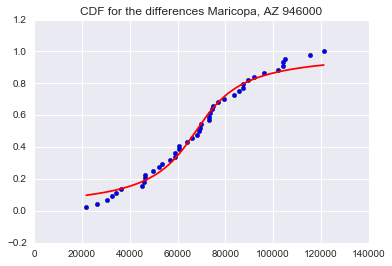

mu and sigma for the gaussian cdf [ 67640.28585522  14609.74837861] 
 

initial pop, median, mean,std 1060099 13813.0 12283.3555556 10805.0754394 Alameda, CA


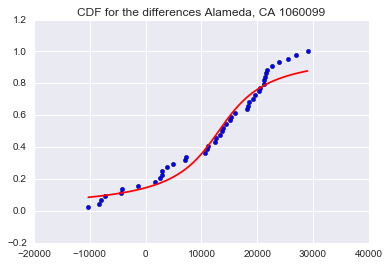

mu and sigma for the gaussian cdf [ 13081.24288611   6420.45894899] 
 

initial pop, median, mean,std 6989910 70593.0 69322.8 55932.9838927 Los Angeles, CA


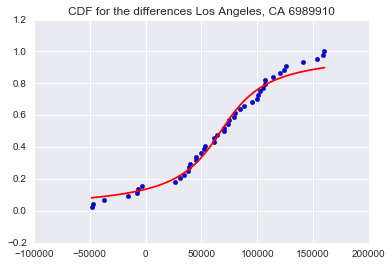

mu and sigma for the gaussian cdf [ 67304.51097949  30639.47187891] 
 

initial pop, median, mean,std 1376796 39462.0 39292.5555556 16928.6305262 Orange, CA


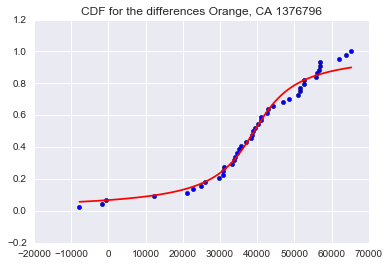

mu and sigma for the gaussian cdf [ 39155.72907878   8501.81429554] 
 

initial pop, median, mean,std 450477 34529.0 41730.0444444 23263.9539985 Riverside, CA


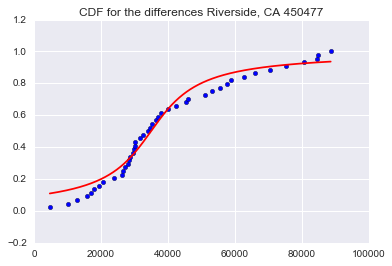

mu and sigma for the gaussian cdf [ 34931.48405282  10826.34907888] 
 

initial pop, median, mean,std 671688 29978.0 31971.0666667 20432.1916325 San Bernardino, CA


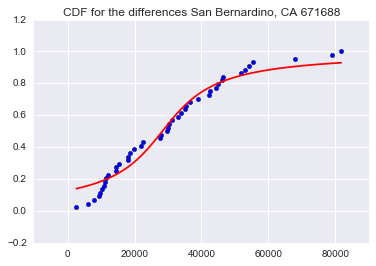

mu and sigma for the gaussian cdf [ 28307.09584185  12043.2303893 ] 
 

initial pop, median, mean,std 1340989 42055.0 42771.3555556 20221.3446351 San Diego, CA


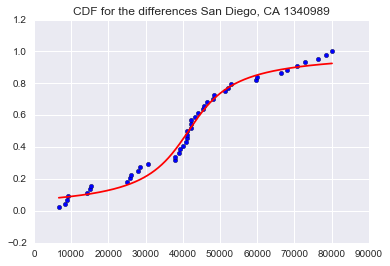

mu and sigma for the gaussian cdf [ 41472.58302532   9242.29037334] 
 

initial pop, median, mean,std 1033442 21707.0 19168.8444444 11318.1129581 Santa Clara, CA


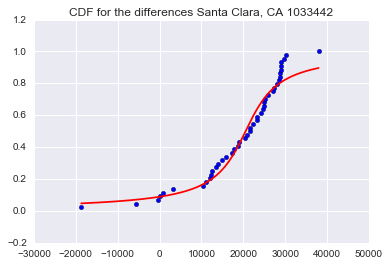

mu and sigma for the gaussian cdf [ 20533.23987908   5883.89607099] 
 

initial pop, median, mean,std 595651 29114.0 28311.7333333 14977.761845 Broward, FL


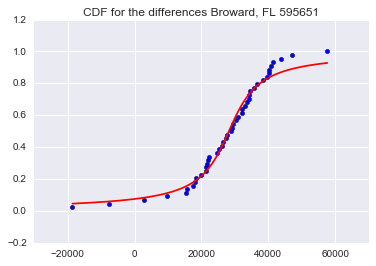

mu and sigma for the gaussian cdf [ 28181.113209     6745.19657075] 
 

initial pop, median, mean,std 1249884 29556.0 31533.7555556 14481.7130573 Miami-Dade, FL


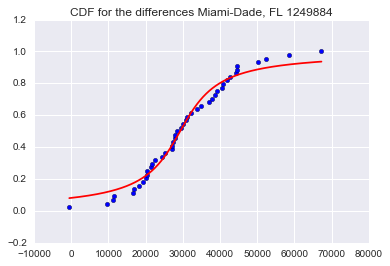

mu and sigma for the gaussian cdf [ 29266.94428138   7677.50600405] 
 

initial pop, median, mean,std 5473709 -11260.0 -5000.11111111 26433.0157536 Cook, IL


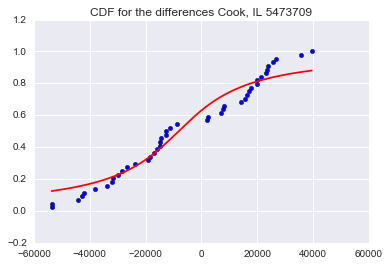

mu and sigma for the gaussian cdf [ -8190.49982754  18789.49854706] 
 

initial pop, median, mean,std 1386993 4456.0 4122.88888889 7783.21556291 Middlesex, MA


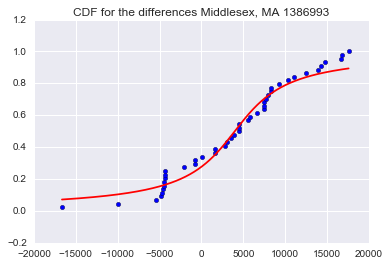

mu and sigma for the gaussian cdf [ 3979.20717528  4717.64669509] 
 

initial pop, median, mean,std 2685171 -16801.0 -20425.8444444 15337.7122689 Wayne, MI


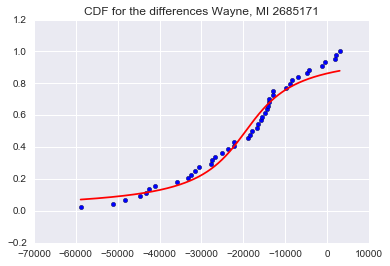

mu and sigma for the gaussian cdf [-19452.91521437   8983.15073281] 
 

initial pop, median, mean,std 267479 30988.0 40037.0444444 22803.4987656 Clark, NV


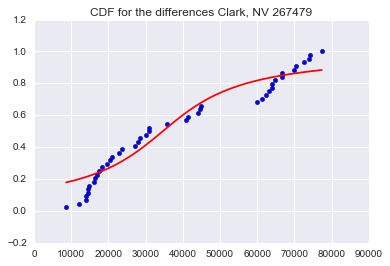

mu and sigma for the gaussian cdf [ 34605.91472207  16322.36288738] 
 

initial pop, median, mean,std 2596639 8839.0 535.133333333 25079.5045119 Kings, NY


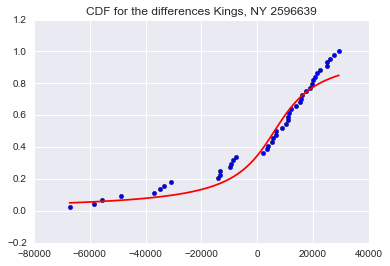

mu and sigma for the gaussian cdf [  6126.0392781   11729.40927856] 
 

initial pop, median, mean,std 1543762 3683.0 2071.2 9822.2568658 New York, NY


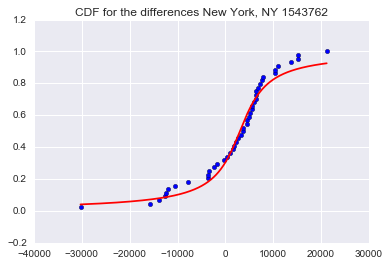

mu and sigma for the gaussian cdf [ 3029.78493033  4300.25647039] 
 

initial pop, median, mean,std 1966669 6856.0 7906.24444444 16030.6558127 Queens, NY


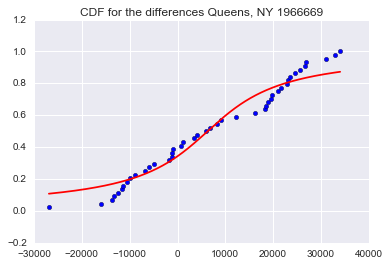

mu and sigma for the gaussian cdf [  6290.25585565  11714.06591301] 
 

initial pop, median, mean,std 1092090 7366.0 9116.71111111 8663.31238582 Suffolk, NY


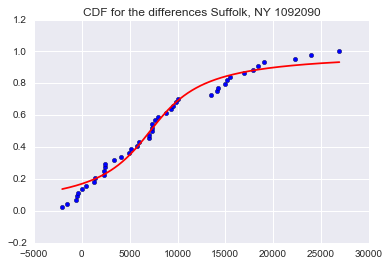

mu and sigma for the gaussian cdf [ 7121.71317961  4216.09632047] 
 

initial pop, median, mean,std 1953285 -6639.0 -8704.95555556 12785.8591958 Philadelphia, PA


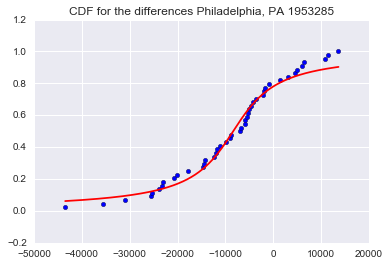

mu and sigma for the gaussian cdf [-8366.86882093  6904.11807518] 
 

initial pop, median, mean,std 821568 22997.0 23082.3555556 9722.79766358 Bexar, TX


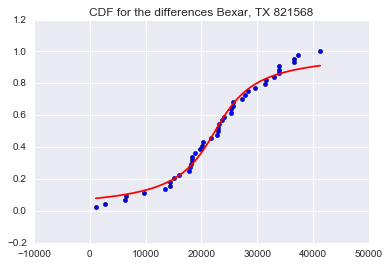

mu and sigma for the gaussian cdf [ 22424.4788708    5403.16075919] 
 

initial pop, median, mean,std 1282675 29359.0 27487.7777778 14014.1819389 Dallas, TX


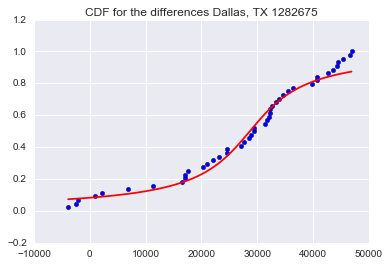

mu and sigma for the gaussian cdf [ 28663.27151962   7629.24234732] 
 

initial pop, median, mean,std 1709436 64621.0 60847.5777778 33486.5993645 Harris, TX


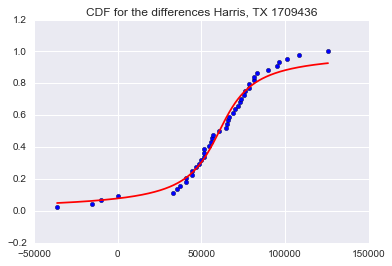

mu and sigma for the gaussian cdf [ 60626.24012636  15216.72809096] 
 

initial pop, median, mean,std 684887 31453.0 28032.4222222 10484.4028357 Tarrant, TX


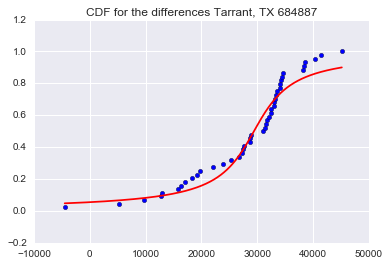

mu and sigma for the gaussian cdf [ 29407.11957376   5112.20801575] 
 

initial pop, median, mean,std 1142545 23865.0 20883.1777778 12382.958884 King, WA


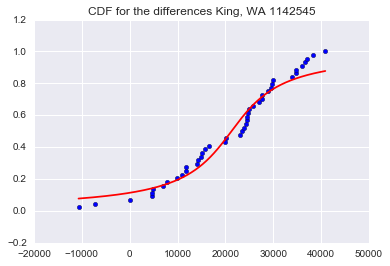

mu and sigma for the gaussian cdf [ 21269.98341008   7936.77304878] 
 



In [12]:
##CAUCHY
county=178
central=[]
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
print a[229][1]
for i in range(1,np.size(np.array(a).T[1,:]) ):
    
    #print i
    c= np.array([x for x in a[i][7:-2] if x!='(NA)' ] , dtype=np.int) #####key formatting thingy
    if (c[-2]>1500000):
        nearest=diff((np.array(c, dtype=np.int)))
        central.append([np.median(nearest), np.mean(nearest)])
        print 'initial pop, median, mean,std',c[0], np.median(nearest), np.mean(nearest),np.std(nearest),a[i][1]
        bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
        values, base = np.histogram(nearest, bins=bins, density=1)
        u, indices = np.unique(np.cumsum(values), return_index=True)
        init=bins[:-1]
        x=[init[j] for j in indices]
        scatter(x, u)
        
        xlin=np.linspace(min(x),max(x),1000)
        superior_params, extras = curve_fit(cauch, x, u,p0=[np.mean(nearest),np.std(nearest)])
        plot(xlin, cauch(xlin, *superior_params),'r')
        title('CDF for the differences '+a[i][1]+' '+str(c[0]))
        show()
        print 'mu and sigma for the gaussian cdf', superior_params, '\n \n'

# Los Angeles Is the biggest county in the time series and doesnt have the smooth behavior in the correlation function

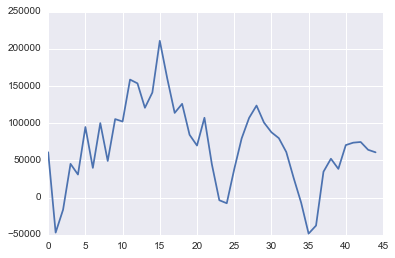

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  """


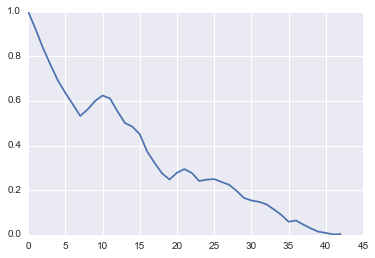

In [13]:
c=(a[229][8:-1])
plot(diff((np.array(c, dtype=np.int))))
show()
corr=correlate(diff((np.array(c, dtype=np.int))),diff((np.array(c, dtype=np.int))),'full');
corr=(corr[(floor(size(corr)+1)/2.0):-1])

plot(corr/float(corr[0]))
show()

# Two things for the total population

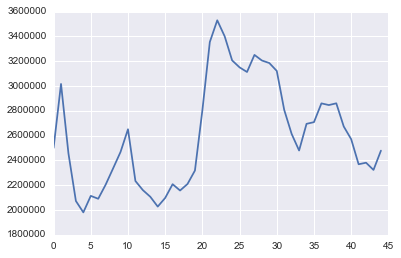

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


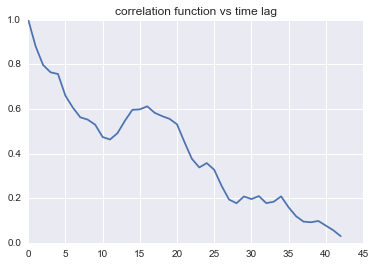

In [14]:


county=178
central=[]
Cumdis=[]
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
Total=np.zeros(46)
for county in range(1,3136):
    
    c= [x for x in a[county][7:-2] if x!='(NA)' ]  #####key formatting thingy

    if(len(c)>45):
        
        nearest=((np.array(c)).astype(int))
        Total+=nearest

diffs=np.diff(Total)   
#plot(Total)
plot(diffs)
show()
corr=correlate(diff((np.array(c, dtype=np.int))),diff((np.array(c, dtype=np.int))),'full');
corr=(corr[(floor(size(corr)+1)/2.0):-1])

title('correlation function vs time lag')
plot(corr/float(corr[0]))
show()

45 45
-1.27640097439 3.42210718226 0.637987590457


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  # This is added back by InteractiveShellApp.init_path()
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if sys.path[0] == '':


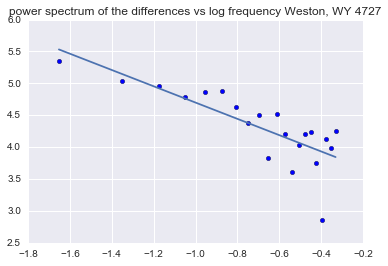

In [15]:
from scipy.fftpack import fft, fftfreq

n=len(diffs)
dt=1
fft_x = fft(diffs) / n # FFT Normalized
print np.size(fft_x),np.size(diffs)
freq = fftfreq(n, dt) # Recuperamos las frecuencias
fft_x_shifted = np.fft.fftshift(fft_x)
#print np.int((np.size(corr)-1)/2.0),np.size(corr),np.size(abs(fft_x_shifted))
freq_shifted = np.fft.fftshift(freq)
x=log10(freq_shifted[(np.floor(np.size(freq_shifted)-1)/2.0)+1:-1])
y=log10(abs(fft_x_shifted)[(np.floor(np.size(freq_shifted)-1)/2.0)+1:-1])
plt.scatter(x,y)
#plt.plot(freq_shifted[(np.floor(np.size(freq_shifted)-1)/2.0):-1],np.log10(abs(fft_x_shifted)[(np.floor(np.size(freq_shifted)-1)/2.0):-1]))
#plt.plot(freq_shifted,np.real(fft_x_shifted))
#plt.plot(freq_shifted,np.imag(fft_x_shifted))
from scipy import stats
slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
plot(x,x*slope+intercept)
print slope, intercept, r_value**2
plt.title('power spectrum of the differences vs log frequency '+a[i][1]+' '+str(c[0]))
plt.show()



## Frequency analysis

Los Angeles, CA
45 45
-0.812693859608 2.67266973724 0.535694982796


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:20: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:21: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


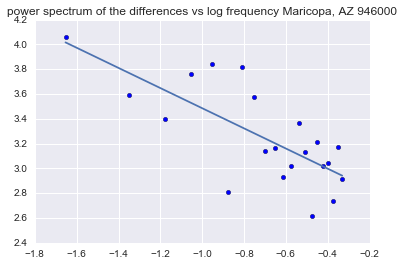

45 45
-0.663153343023 2.48098196997 0.384827673595


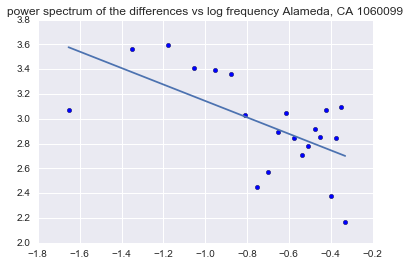

45 45
-0.700477401489 3.13754775213 0.466947723235


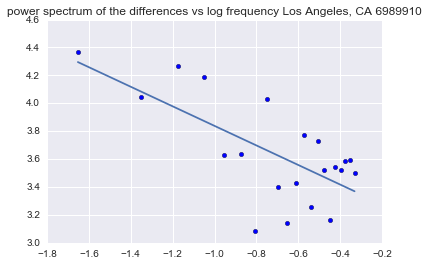

45 45
-0.882931122618 2.50073372557 0.723742805385


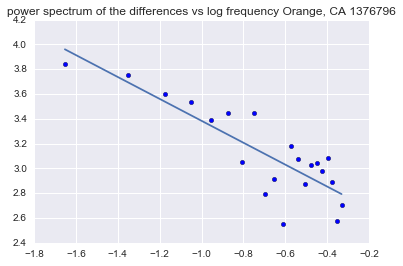

45 45
-0.930547226236 2.5786296673 0.821133893385


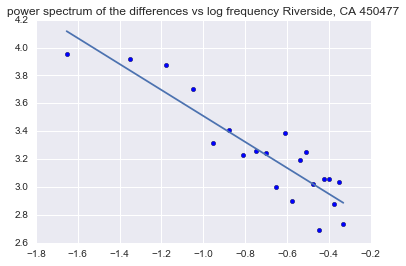

45 45
-1.14560966984 2.24733368172 0.578027840735


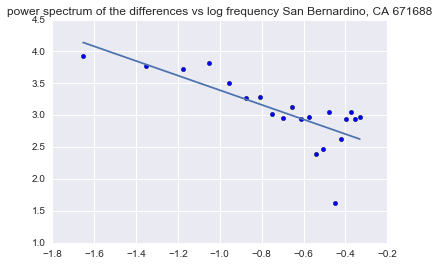

45 45
-0.560066622128 2.78678546212 0.317239716749


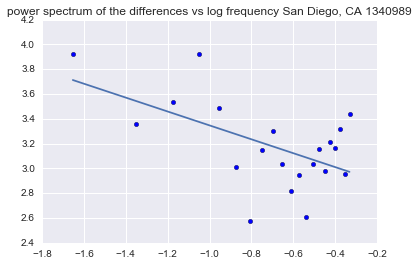

45 45
-0.662621565362 2.50873430902 0.278465672817


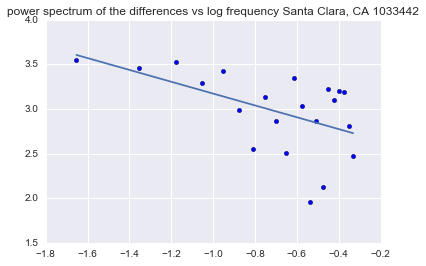

45 45
-0.767570425442 2.51733184949 0.482551233883


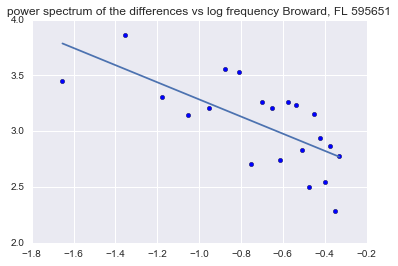

45 45
-0.258323761828 2.99497220985 0.103796861064


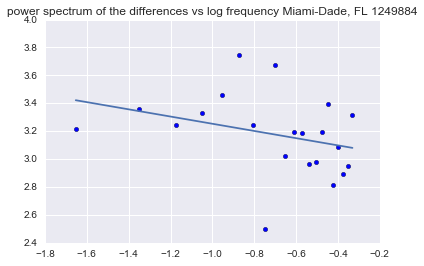

45 45
-0.759928139316 2.71298142455 0.359002669708


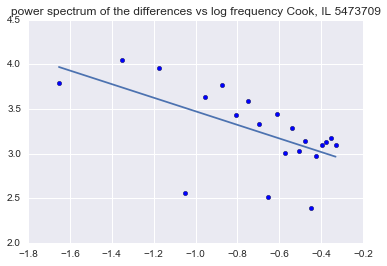

45 45
-0.781194518693 2.18481065127 0.581694842231


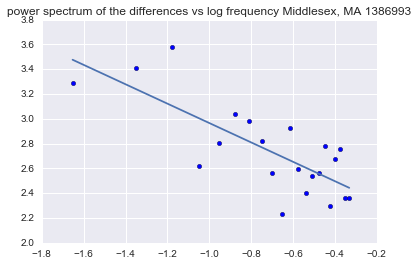

45 45
-0.760749037432 2.58932559718 0.657387754261


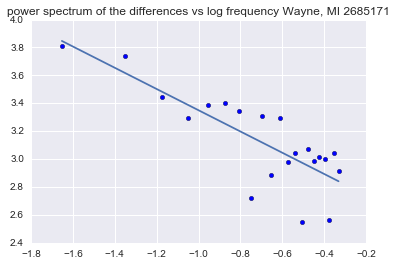

45 45
-0.92978644771 2.42482336061 0.717963323455


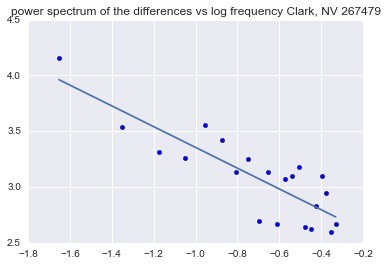

45 45
-1.0687296623 2.38584718163 0.596137804682


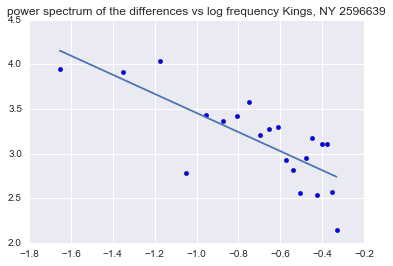

45 45
-0.453012153324 2.59801673068 0.158035169857


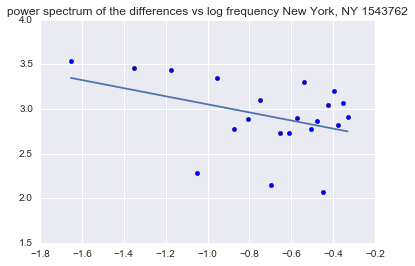

45 45
-1.16183086589 1.99240481558 0.506410813664


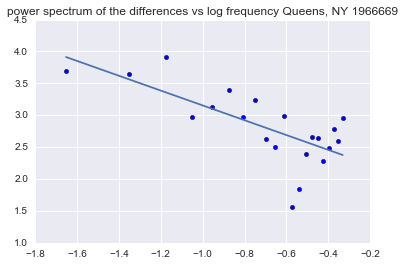

45 45
-0.384309211972 2.70400011334 0.313851982232


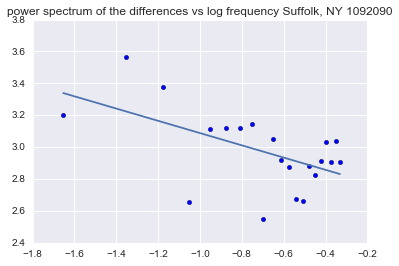

45 45
-1.01606120128 2.1736570738 0.639758053498


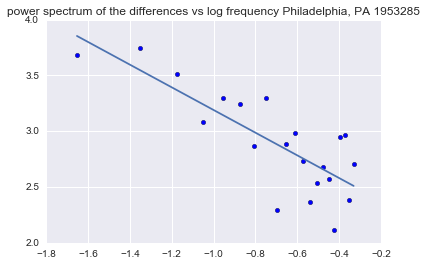

45 45
-0.787231078921 2.37434357772 0.599348497602


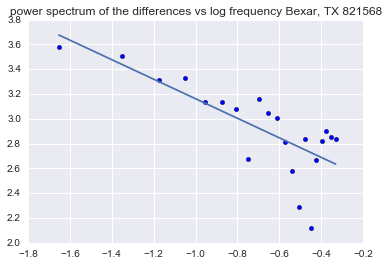

45 45
-0.509439101556 2.75885877656 0.374224099711


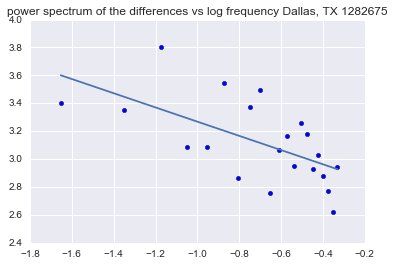

45 45
-0.586557450632 3.14579662317 0.648016842765


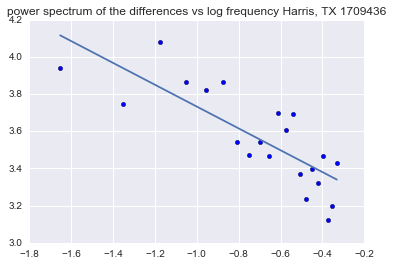

45 45
-0.770069319015 2.37121085242 0.558703360732


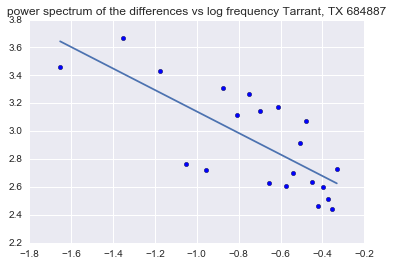

45 45
-0.968191910257 2.27569396098 0.605650657329


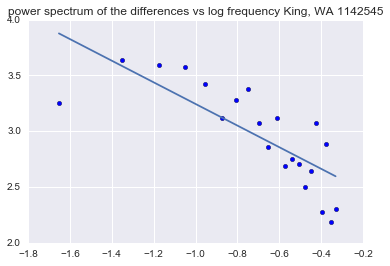

In [16]:
from scipy import stats
county=178
central=[]
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
print a[229][1]
for i in range(1,np.size(np.array(a).T[1,:]) ):
    
    #print i
    c= np.array([x for x in a[i][7:-2] if x!='(NA)' ] , dtype=np.int) #####key formatting thingy
    if (c[-2]>1500000):
        diffs=diff((np.array(c, dtype=np.int)))
        n=len(diffs)
        dt=1
        fft_x = fft(diffs) / n # FFT Normalized
        print np.size(fft_x),np.size(diffs)
        freq = fftfreq(n, dt) # Recuperamos las frecuencias
        fft_x_shifted = np.fft.fftshift(fft_x)
    #print np.int((np.size(corr)-1)/2.0),np.size(corr),np.size(abs(fft_x_shifted))
        freq_shifted = np.fft.fftshift(freq)
        x=log10(freq_shifted[(np.floor(np.size(freq_shifted)-1)/2.0)+1:-1])
        y=log10(abs(fft_x_shifted)[(np.floor(np.size(freq_shifted)-1)/2.0)+1:-1])
        plt.scatter(x,y)
    #plt.plot(freq_shifted[(np.floor(np.size(freq_shifted)-1)/2.0):-1],np.log10(abs(fft_x_shifted)[(np.floor(np.size(freq_shifted)-1)/2.0):-1]))
    #plt.plot(freq_shifted,np.real(fft_x_shifted))
    #plt.plot(freq_shifted,np.imag(fft_x_shifted))

        slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
        plot(x,x*slope+intercept)
        print slope, intercept, r_value**2
        plt.title('power spectrum of the differences vs log frequency '+a[i][1]+' '+str(c[0]))
        plt.show()

#real space correlation function


''' tk_image_slideshow3.py
create a Tkinter image repeating slide show
tested with Python27/33  by  vegaseat  03dec2013
'''
from itertools import cycle
try:
    # Python2
    import Tkinter as tk
except ImportError:
    # Python3
    import tkinter as tk
class App(tk.Tk):
    '''Tk window/label adjusts to size of image'''
    def __init__(self, image_files, x, y, delay):
        # the root will be self
        tk.Tk.__init__(self)
        # set x, y position only
        self.geometry('+{}+{}'.format(x, y))
        self.delay = delay
        # allows repeat cycling through the pictures
        # store as (img_object, img_name) tuple
        self.pictures = cycle((tk.PhotoImage(file=image), image)
                              for image in image_files)
        self.picture_display = tk.Label(self)
        self.picture_display.pack()
    def show_slides(self):
        '''cycle through the images and show them'''
        # next works with Python26 or higher
        img_object, img_name = next(self.pictures)
        self.picture_display.config(image=img_object)
        # shows the image filename, but could be expanded
        # to show an associated description of the image
        self.title(img_name)
        self.after(self.delay, self.show_slides)
    def run(self):
        self.mainloop()
# set milliseconds time between slides
delay = 350
# get a series of gif images you have in the working folder
# or use full path, or set directory to where the images are
image_files = [
'Slide_Farm.gif',
'Slide_House.gif',
'Slide_Sunset.gif',
'Slide_Pond.gif',
'Slide_Python.gif'
]
# upper left corner coordinates of app window
x = 100
y = 50
app = App(image_files, x, y, delay)
app.show_slides()
app.run()

idea para caracterizar y clasificar condados usando la media y la mediana para determinar la tendencia y el sesgo de las distribuciones de poblaciones.

Mirar fluctuaciones en las diferencias, claramente estan correlacionadas con la cantidad de gente en el condado.

intentar coarse graining temporal

intentar clasificar la distribucion de diferencias en poblaciones partiendo las muestras y viendo la ditribucion de maximos en ventanas de 10 años, comportamiento universal de los maximos?

otra idea.. hacer MLE para determinar la distribucion de pareto y el dominio de atraccion de la distribucion de maximos y la cola de las cumulativas, inspeccionar power law

no se pueden agrupar todos los condados de un estado por la presencia de ciudades grandes, se podrian agrupar datos por thresholds de densidad

In [17]:
county=178
central=[]
Cumdis=[]
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
means=[]
counties=[]
newest=[]
code=[]
indexcount=[]
for county in range(1,3136):
    
    c= [x for x in a[county][7:-2] if x!='(NA)' ]  #####key formatting thingy
    if(c[0]!='(NA)'):
        
        nearest=diff((np.array(c)).astype(int))
        central.append([np.median(nearest), np.mean(nearest)])
        means.append(np.mean((np.array(c)).astype(int)))
        newest.append(int(c[-1]))
        counties.append(a[county][1])
        code.append(a[county][0])
        indexcount.append(county)
        print county ,a[county][0],c[0], np.median(nearest), np.mean(nearest),a[county][1], np.size(nearest)
        

1 01001 25166 803.0 669.422222222 Autauga, AL 45
2 01003 56951 3111.0 3172.48888889 Baldwin, AL 45
3 01005 23818 25.0 66.6 Barbour, AL 45
4 01007 14994 200.0 167.888888889 Bibb, AL 45
5 01009 26411 682.0 694.377777778 Blount, AL 45
6 01011 12554 -40.0 -38.3333333333 Bullock, AL 45
7 01013 22726 -23.0 -54.4444444444 Butler, AL 45
8 01015 102946 359.0 289.933333333 Calhoun, AL 45
9 01017 37814 -101.0 -83.6 Chambers, AL 45
10 01019 15904 221.0 224.244444444 Cherokee, AL 45
11 01021 26594 396.0 385.044444444 Chilton, AL 45
12 01023 18432 -97.0 -114.288888889 Choctaw, AL 45
13 01025 28083 -100.0 -71.9111111111 Clarke, AL 45
14 01027 13075 30.0 10.2888888889 Clay, AL 45
15 01029 11115 75.0 87.9333333333 Cleburne, AL 45
16 01031 36137 305.0 326.533333333 Coffee, AL 45
17 01033 50891 29.0 79.7555555556 Colbert, AL 45
18 01035 16645 -98.0 -88.5111111111 Conecuh, AL 45
19 01037 11012 -2.0 -4.55555555556 Coosa, AL 45
20 01039 35074 66.0 62.5333333333 Covington, AL 45
21 01041 13866 4.0 1.82222222

219 06017 43168 2810.0 3108.48888889 El Dorado, CA 45
220 06019 408304 11848.0 12370.6444444 Fresno, CA 45
221 06021 17207 201.0 240.511111111 Glenn, CA 45
222 06023 98868 919.0 799.177777778 Humboldt, CA 45
223 06025 73604 1717.0 2349.51111111 Imperial, CA 45
224 06027 15417 6.0 66.2 Inyo, CA 45
225 06029 325549 12026.0 12192.0222222 Kern, CA 45
226 06031 65647 1711.0 1876.91111111 Kings, CA 45
227 06033 18799 1004.0 1007.93333333 Lake, CA 45
228 06035 16611 298.0 336.022222222 Lassen, CA 45
229 06037 6989910 70593.0 69322.8 Los Angeles, CA 45
230 06039 41079 2437.0 2521.84444444 Madera, CA 45
231 06041 203506 1075.0 1267.64444444 Marin, CA 45
232 06043 5868 270.0 261.511111111 Mariposa, CA 45
233 06045 49733 741.0 843.333333333 Mendocino, CA 45
234 06047 101255 3700.0 3662.93333333 Merced, CA 45
235 06049 7261 50.0 38.9777777778 Modoc, CA 45
236 06051 3780 202.0 228.377777778 Mono, CA 45
237 06053 255128 4966.0 3914.77777778 Monterey, CA 45
238 06055 76688 1337.0 1441.4 Napa, CA 45
2

504 13187 8445 450.0 504.355555556 Lumpkin, GA 45
505 13189 14846 119.0 148.644444444 McDuffie, GA 45
506 13191 7347 172.0 148.0 McIntosh, GA 45
507 13193 12951 10.0 19.2666666667 Macon, GA 45
508 13195 13357 302.0 334.022222222 Madison, GA 45
509 13197 5133 78.0 80.8666666667 Marion, GA 45
510 13199 19558 24.0 36.5555555556 Meriwether, GA 45
511 13201 6404 -19.0 -10.6888888889 Miller, GA 45
512 13205 19330 8.0 76.6222222222 Mitchell, GA 45
513 13207 11016 363.0 356.444444444 Monroe, GA 45
514 13209 6359 36.0 58.1333333333 Montgomery, GA 45
515 13211 9885 153.0 179.911111111 Morgan, GA 45
516 13213 12496 637.0 597.311111111 Murray, GA 45
517 13215 162886 803.0 848.911111111 Muscogee, GA 45
518 13217 25824 1039.0 1733.66666667 Newton, GA 45
519 13219 7848 573.0 606.644444444 Oconee, GA 45
520 13221 7647 160.0 156.288888889 Oglethorpe, GA 45
521 13223 16991 2068.0 2931.77777778 Paulding, GA 45
522 13225 16145 239.0 237.4 Peach, GA 45
523 13227 9520 337.0 456.133333333 Pickens, GA 45
524 

791 18141 244521 549.0 514.622222222 St. Joseph, IN 45
792 18143 16922 100.0 150.133333333 Scott, IN 45
793 18145 37474 103.0 156.822222222 Shelby, IN 45
794 18147 17050 66.0 84.0222222222 Spencer, IN 45
795 18149 19171 14.0 85.9111111111 Starke, IN 45
796 18151 19892 349.0 322.533333333 Steuben, IN 45
797 18153 20094 -3.0 20.2 Sullivan, IN 45
798 18155 6385 116.0 91.2222222222 Switzerland, IN 45
799 18157 107325 1692.0 1696.55555556 Tippecanoe, IN 45
800 18159 16595 -28.0 -25.9111111111 Tipton, IN 45
801 18161 6578 25.0 14.3777777778 Union, IN 45
802 18163 168667 387.0 294.466666667 Vanderburgh, IN 45
803 18165 16856 -43.0 -25.8222222222 Vermillion, IN 45
804 18167 114885 -208.0 -148.533333333 Vigo, IN 45
805 18169 35304 -84.0 -67.1555555556 Wabash, IN 45
806 18171 8699 -8.0 -8.2 Warren, IN 45
807 18173 27576 681.0 748.688888889 Warrick, IN 45
808 18175 19160 183.0 194.311111111 Washington, IN 45
809 18177 78695 -277.0 -249.955555556 Wayne, IN 45
810 18179 23542 68.0 95.2222222222 Wel

1054 21075 10274 -92.0 -89.4222222222 Fulton, KY 45
1055 21077 4084 84.0 100.488888889 Gallatin, KY 45
1056 21079 9482 151.0 165.6 Garrard, KY 45
1057 21081 9946 291.0 331.111111111 Grant, KY 45
1058 21083 30840 198.0 151.422222222 Graves, KY 45
1059 21085 16370 158.0 217.2 Grayson, KY 45
1060 21087 10425 23.0 13.8222222222 Green, KY 45
1061 21089 32765 -32.0 78.5333333333 Greenup, KY 45
1062 21091 6911 31.0 40.2 Hancock, KY 45
1063 21093 77202 796.0 694.688888889 Hardin, KY 45
1064 21095 38498 -276.0 -232.044444444 Harlan, KY 45
1065 21097 14108 107.0 100.777777778 Harrison, KY 45
1066 21099 13977 122.0 101.244444444 Hart, KY 45
1067 21101 35779 150.0 236.733333333 Henderson, KY 45
1068 21103 10909 81.0 103.644444444 Henry, KY 45
1069 21105 6304 -29.0 -35.4888888889 Hickman, KY 45
1070 21107 38176 87.0 180.622222222 Hopkins, KY 45
1071 21109 10057 86.0 72.6 Jackson, KY 45
1072 21111 686605 2520.0 1644.8 Jefferson, KY 45
1073 21113 17044 769.0 754.311111111 Jessamine, KY 45
1074 21115 

1222 24013 67917 2439.0 2217.0 Carroll, MD 45
1223 24015 53019 1195.0 1091.46666667 Cecil, MD 45
1224 24017 46637 2342.0 2401.11111111 Charles, MD 45
1225 24019 29475 38.0 67.8222222222 Dorchester, MD 45
1226 24021 84107 3426.0 3541.51111111 Frederick, MD 45
1227 24023 21440 160.0 182.488888889 Garrett, MD 45
1228 24025 112691 2970.0 3050.17777778 Harford, MD 45
1229 24027 60092 5287.0 5524.73333333 Howard, MD 45
1230 24029 16130 91.0 81.4 Kent, MD 45
1231 24031 510124 11217.0 11563.3777778 Montgomery, MD 45
1232 24033 639024 6022.0 5874.06666667 Prince George's, MD 45
1233 24035 18314 666.0 675.822222222 Queen Anne's, MD 45
1234 24037 46838 1373.0 1411.37777778 St. Mary's, MD 45
1235 24039 19016 96.0 147.022222222 Somerset, MD 45
1236 24041 23564 341.0 311.022222222 Talbot, MD 45
1237 24043 103073 1004.0 1030.0 Washington, MD 45
1238 24045 53951 1042.0 1062.6 Wicomico, MD 45
1239 24047 24436 648.0 602.822222222 Worcester, MD 45
1240 24510 909951 -5366.0 -6360.88888889 Baltimore (Indep

1566 29119 12433 225.0 230.2 McDonald, MO 45
1567 29121 15783 -21.0 -6.97777777778 Macon, MO 45
1568 29123 8841 72.0 78.7555555556 Madison, MO 45
1569 29125 6906 46.0 46.6666666667 Maries, MO 45
1570 29127 28337 21.0 11.9555555556 Marion, MO 45
1571 29129 5056 -31.0 -29.8888888889 Mercer, MO 45
1572 29131 15117 192.0 221.333333333 Miller, MO 45
1573 29133 17148 -34.0 -65.0444444444 Mississippi, MO 45
1574 29135 10850 93.0 111.822222222 Moniteau, MO 45
1575 29137 9766 -24.0 -23.8 Monroe, MO 45
1576 29139 11120 13.0 15.4666666667 Montgomery, MO 45
1577 29141 10164 243.0 223.288888889 Morgan, MO 45
1578 29143 24324 -132.0 -135.022222222 New Madrid, MO 45
1579 29145 33152 617.0 565.422222222 Newton, MO 45
1580 29147 22773 52.0 7.04444444444 Nodaway, MO 45
1581 29149 9380 16.0 33.5555555556 Oregon, MO 45
1582 29151 11104 52.0 57.4888888889 Osage, MO 45
1583 29153 6332 49.0 69.8 Ozark, MO 45
1584 29155 27598 -207.0 -222.0 Pemiscot, MO 45
1585 29157 14670 90.0 101.155555556 Perry, MO 45
1586 

1863 36023 45554 26.0 75.0 Cortland, NY 45
1864 36025 44598 70.0 44.4222222222 Delaware, NY 45
1865 36027 218638 1714.0 1727.6 Dutchess, NY 45
1866 36029 1108780 -3552.0 -4124.15555556 Erie, NY 45
1867 36031 34691 56.0 87.5777777778 Essex, NY 45
1868 36033 44144 74.0 155.311111111 Franklin, NY 45
1869 36035 52509 27.0 36.9777777778 Fulton, NY 45
1870 36037 58370 -25.0 16.2 Genesee, NY 45
1871 36039 33077 239.0 329.822222222 Greene, NY 45
1872 36041 4685 -18.0 0.466666666667 Hamilton, NY 45
1873 36043 67633 -40.0 -87.0666666667 Herkimer, NY 45
1874 36045 88565 163.0 675.533333333 Jefferson, NY 45
1875 36047 2596639 8839.0 535.133333333 Kings, NY 45
1876 36049 23674 65.0 77.7333333333 Lewis, NY 45
1877 36051 53331 210.0 254.044444444 Livingston, NY 45
1878 36053 62232 255.0 222.777777778 Madison, NY 45
1879 36055 700384 614.0 1110.62222222 Monroe, NY 45
1880 36057 55970 -97.0 -138.688888889 Montgomery, NY 45
1881 36059 1424424 373.0 -1461.13333333 Nassau, NY 45
1882 36061 1543762 3683.0 

2158 40007 6494 -15.0 -22.4666666667 Beaver, OK 45
2159 40009 16148 160.0 168.555555556 Beckham, OK 45
2160 40011 11963 9.0 -45.9333333333 Blaine, OK 45
2161 40013 26274 422.0 402.866666667 Bryan, OK 45
2162 40015 29536 18.0 -3.64444444444 Caddo, OK 45
2163 40017 31049 2043.0 2187.31111111 Canadian, OK 45
2164 40019 37502 261.0 250.088888889 Carter, OK 45
2165 40021 22507 566.0 573.222222222 Cherokee, OK 45
2166 40023 15307 -14.0 -3.64444444444 Choctaw, OK 45
2167 40025 4316 -54.0 -45.0666666667 Cimarron, OK 45
2168 40027 74984 4296.0 4337.88888889 Cleveland, OK 45
2169 40029 5403 -12.0 8.31111111111 Coal, OK 45
2170 40031 112963 -136.0 272.488888889 Comanche, OK 45
2171 40033 6754 -8.0 -13.9333333333 Cotton, OK 45
2172 40035 14595 18.0 -0.4 Craig, OK 45
2173 40037 45440 585.0 560.377777778 Creek, OK 45
2174 40039 21978 205.0 169.088888889 Custer, OK 45
2175 40041 17553 417.0 531.0 Delaware, OK 45
2176 40043 5738 -52.0 -17.5555555556 Dewey, OK 45
2177 40045 5289 -23.0 -25.7777777778 El

2339 44009 82896 1052.0 967.422222222 Washington, RI 45
2340 45001 20596 116.0 96.2222222222 Abbeville, SC 45
2341 45003 91582 1550.0 1621.22222222 Aiken, SC 45
2342 45005 9998 -43.0 -6.77777777778 Allendale, SC 45
2343 45007 102780 2024.0 2001.24444444 Anderson, SC 45
2344 45009 16197 -64.0 -22.3555555556 Bamberg, SC 45
2345 45011 17497 47.0 98.6222222222 Barnwell, SC 45
2346 45013 52890 2974.0 2716.17777778 Beaufort, SC 45
2347 45015 54689 3351.0 3189.33333333 Berkeley, SC 45
2348 45017 10198 116.0 103.777777778 Calhoun, SC 45
2349 45019 247753 2915.0 2946.33333333 Charleston, SC 45
2350 45021 36493 387.0 434.355555556 Cherokee, SC 45
2351 45023 29894 25.0 54.5555555556 Chester, SC 45
2352 45025 34093 274.0 267.022222222 Chesterfield, SC 45
2353 45027 25795 207.0 183.466666667 Clarendon, SC 45
2354 45029 28294 249.0 210.711111111 Colleton, SC 45
2355 45031 53590 237.0 315.066666667 Darlington, SC 45
2356 45033 29394 47.0 41.8888888889 Dillon, SC 45
2357 45035 31394 2474.0 2600.622222

2509 47115 20672 132.0 171.644444444 Marion, TN 45
2510 47117 17318 270.0 310.733333333 Marshall, TN 45
2511 47119 43913 797.0 926.333333333 Maury, TN 45
2512 47121 5220 135.0 144.533333333 Meigs, TN 45
2513 47123 23518 486.0 485.955555556 Monroe, TN 45
2514 47125 62116 2463.0 2837.31111111 Montgomery, TN 45
2515 47127 3560 58.0 61.6888888889 Moore, TN 45
2516 47129 13718 150.0 178.644444444 Morgan, TN 45
2517 47131 29716 -1.0 25.9555555556 Obion, TN 45
2518 47133 14884 132.0 157.711111111 Overton, TN 45
2519 47135 5244 57.0 57.7555555556 Perry, TN 45
2520 47137 3845 34.0 27.5333333333 Pickett, TN 45
2521 47139 11747 123.0 110.311111111 Polk, TN 45
2522 47141 34940 952.0 878.377777778 Putnam, TN 45
2523 47143 17116 329.0 345.244444444 Rhea, TN 45
2524 47145 38992 245.0 305.866666667 Roane, TN 45
2525 47147 28995 887.0 866.4 Robertson, TN 45
2526 47149 58753 5242.0 5119.86666667 Rutherford, TN 45
2527 47151 14865 145.0 158.422222222 Scott, TN 45
2528 47153 6307 191.0 188.244444444 Sequa

2841 50023 46985 240.0 265.666666667 Washington, VT 45
2842 50025 32949 268.0 240.377777778 Windham, VT 45
2843 50027 43800 286.0 270.266666667 Windsor, VT 45
2844 51001 29308 18.0 82.0 Accomack, VA 45
2845 51007 7702 88.0 112.955555556 Amelia, VA 45
2846 51009 26007 134.0 134.555555556 Amherst, VA 45
2847 51011 9803 117.0 121.4 Appomattox, VA 45
2848 51013 174981 1188.0 1147.62222222 Arlington, VA 45
2849 51017 5201 -31.0 -14.4888888889 Bath, VA 45
2850 51019 32709 995.0 986.355555556 Bedford, VA* 45
2851 51021 5502 0.0 24.5333333333 Bland, VA 45
2852 51023 18205 323.0 331.333333333 Botetourt, VA 45
2853 51025 16405 -43.0 8.48888888889 Brunswick, VA 45
2854 51027 32609 -306.0 -209.6 Buchanan, VA 45
2855 51029 10703 144.0 138.311111111 Buckingham, VA 45
2856 51033 13904 358.0 353.133333333 Caroline, VA 45
2857 51036 6102 20.0 20.4888888889 Charles City, VA 45
2858 51037 12504 -19.0 -7.06666666667 Charlotte, VA 45
2859 51041 74325 5256.0 5739.28888889 Chesterfield, VA 45
2860 51043 8102

3001 54027 12138 301.0 251.177777778 Hampshire, WV 45
3002 54029 39815 -205.0 -216.311111111 Hancock, WV 45
3003 54031 9028 127.0 109.511111111 Hardy, WV 45
3004 54033 72686 -33.0 -85.5555555556 Harrison, WV 45
3005 54035 21624 131.0 167.933333333 Jackson, WV 45
3006 54037 21676 712.0 756.977777778 Jefferson, WV 45
3007 54039 229266 -826.0 -869.222222222 Kanawha, WV 45
3008 54041 18603 -30.0 -48.0222222222 Lewis, WV 45
3009 54043 19237 30.0 52.4222222222 Lincoln, WV 45
3010 54045 46177 -160.0 -241.488888889 Logan, WV 45
3011 54047 49998 -668.0 -660.266666667 McDowell, WV 45
3012 54049 61238 -8.0 -97.3111111111 Marion, WV 45
3013 54051 38169 -215.0 -130.2 Marshall, WV 45
3014 54053 24428 42.0 59.3777777778 Mason, WV 45
3015 54055 63283 -106.0 -35.9111111111 Mercer, WV 45
3016 54057 23643 62.0 88.0 Mineral, WV 45
3017 54059 33275 -261.0 -168.866666667 Mingo, WV 45
3018 54061 62432 998.0 900.088888889 Monongalia, WV 45
3019 54063 11056 64.0 55.4888888889 Monroe, WV 45
3020 54065 8669 227.

In [18]:
def find_first(item, vec):
	"""return the index of the first occurence of item in vec"""
	for i in range(np.size(vec)):
		if vec[i]== item:
			return i
	return -1

a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
#a=filter(lambda l: l != '(NA)', a)
print ['100000000' for x in a if x=='(NA)' ]
lag=46
for i in range(2,3138):
    c= [x for x in a[i][7:-2] if x!='(NA)' ]
    dats=(np.array(c)).astype(int)
    b=dats
    ubound=11000000 ##to avoid overflow values

    print np.size(b)
    for j in range(np.size(dats)):
        if (dats[j]>ubound):
            b=np.delete(b,find_first(dats[j], b))
            print np.size(b)

[]
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
9
27
27
46
36
46
24
36
46
36
7
46
36
46
46
46
24
46
46
36
46
6
6
30
36
7
14
15
36
36
6
30
22
36
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
46
46
46
46
46
46
32
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
13
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
46
4

dats


# These are the largest 400 counties on which we'll probably focus

In [19]:


top=[countiesS for (meansS,countiesS) in sorted(zip(means,counties))]
top=top[::-1]
top[:400]


['Los Angeles, CA',
 'Cook, IL',
 'Harris, TX',
 'Maricopa, AZ',
 'Kings, NY',
 'Orange, CA',
 'San Diego, CA',
 'Wayne, MI',
 'Queens, NY',
 'Miami-Dade, FL',
 'Dallas, TX',
 'Philadelphia, PA',
 'King, WA',
 'New York, NY',
 'Santa Clara, CA',
 'Cuyahoga, OH',
 'Middlesex, MA',
 'San Bernardino, CA',
 'Allegheny, PA',
 'Suffolk, NY',
 'Nassau, NY',
 'Broward, FL',
 'Bronx, NY',
 'Alameda, CA',
 'Bexar, TX',
 'Riverside, CA',
 'Tarrant, TX',
 'Oakland, MI',
 'Sacramento, CA',
 'Hennepin, MN',
 'Clark, NV',
 'Franklin, OH',
 'St. Louis, MO',
 'Erie, NY',
 'Milwaukee, WI',
 'Westchester, NY',
 'Palm Beach, FL',
 'Hillsborough, FL',
 'Bergen, NJ',
 'Hamilton, OH',
 'Fairfield, CT',
 'Hartford, CT',
 'Fairfax, Fairfax City + Falls Church, VA*',
 'Shelby, TN',
 'Honolulu, HI',
 'Marion, IN',
 'Essex, NJ',
 'Contra Costa, CA',
 'Pinellas, FL',
 'New Haven, CT',
 'Salt Lake, UT',
 'DuPage, IL',
 'Montgomery, MD',
 "Prince George's, MD",
 'San Francisco, CA',
 'Macomb, MI',
 'Orange, FL',
 'B

In [20]:

top=[countiesS for (newestS,countiesS) in sorted(zip(newest,counties))]
top=top[::-1]
top[:400]

['Los Angeles, CA',
 'Cook, IL',
 'Harris, TX',
 'Maricopa, AZ',
 'San Diego, CA',
 'Orange, CA',
 'Miami-Dade, FL',
 'Kings, NY',
 'Dallas, TX',
 'Riverside, CA',
 'Queens, NY',
 'San Bernardino, CA',
 'King, WA',
 'Clark, NV',
 'Tarrant, TX',
 'Santa Clara, CA',
 'Broward, FL',
 'Bexar, TX',
 'Wayne, MI',
 'New York, NY',
 'Alameda, CA',
 'Middlesex, MA',
 'Philadelphia, PA',
 'Suffolk, NY',
 'Sacramento, CA',
 'Bronx, NY',
 'Palm Beach, FL',
 'Nassau, NY',
 'Hillsborough, FL',
 'Cuyahoga, OH',
 'Orange, FL',
 'Oakland, MI',
 'Franklin, OH',
 'Allegheny, PA',
 'Hennepin, MN',
 'Fairfax, Fairfax City + Falls Church, VA*',
 'Travis, TX',
 'Contra Costa, CA',
 'Salt Lake, UT',
 'Montgomery, MD',
 'Mecklenburg, NC',
 'Pima, AZ',
 'St. Louis, MO',
 'Wake, NC',
 'Fulton, GA',
 'Honolulu, HI',
 'Westchester, NY',
 'Fresno, CA',
 'Milwaukee, WI',
 'Fairfield, CT',
 'Shelby, TN',
 'Pinellas, FL',
 'Marion, IN',
 'DuPage, IL',
 'Bergen, NJ',
 'Erie, NY',
 "Prince George's, MD",
 'Duval, FL',
 

In [21]:
#50 is an arbitrary cuttoff
topCode=[codeS for (newestS,codeS) in sorted(zip(newest,code))]
topCode=topCode[::-1]
topCode=topCode[:50]
print topCode

topInd=[indexcountS for (newestS,indexcountS) in sorted(zip(newest,indexcount))]
topInd=topInd[::-1]
topInd=topInd[:50]
print topInd

['06037', '17031', '48201', '04013', '06073', '06059', '12086', '36047', '48113', '06065', '36081', '06071', '53033', '32003', '48439', '06085', '12011', '48029', '26163', '36061', '06001', '25017', '42101', '36103', '06067', '36005', '12099', '36059', '12057', '39035', '12095', '26125', '39049', '42003', '27053', '51919', '48453', '06013', '49035', '24031', '37119', '04019', '29189', '37183', '13121', '15003', '36119', '06019', '55079', '09001']
[229, 634, 2647, 128, 247, 240, 387, 1875, 2603, 243, 1892, 246, 2965, 1772, 2766, 253, 350, 2561, 1336, 1882, 211, 1249, 2318, 1903, 244, 1854, 394, 1881, 372, 2084, 392, 1317, 2091, 2269, 1364, 2932, 2773, 217, 2818, 1231, 1973, 131, 1602, 2005, 471, 572, 1911, 220, 3083, 333]


In [22]:
mig=list(csv.reader(open('county_migration_data.csv'), delimiter='\t'))


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


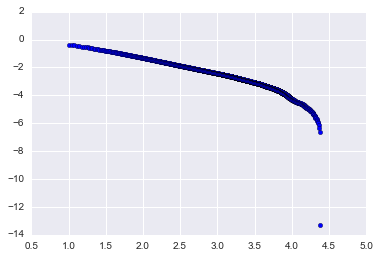

In [23]:
nearest=(array(mig[1:], dtype=np.int)[:,2:]).flatten()

bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


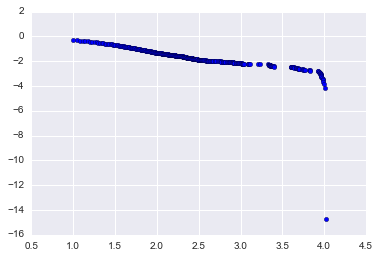

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log10


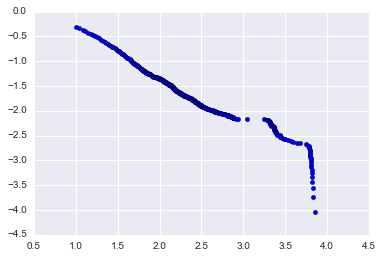

In [24]:
detroitIN=[]
for element in mig:
    if ((element[1])=='26163'):
        detroitIN.append(np.array(element,dtype=np.int))

        
detroitOUT=[]
for element in mig:
    if ((element[0])=='26163'):
        detroitOUT.append(np.array(element,dtype=np.int))
        
        
        
nearest=(array(detroitOUT, dtype=np.int)[:,2:]).flatten()

bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))
show()

nearest=(array(detroitIN, dtype=np.int)[:,2:]).flatten()

bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))
show()

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in log10


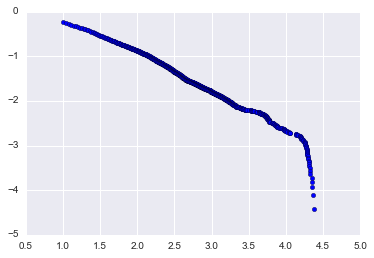

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log10


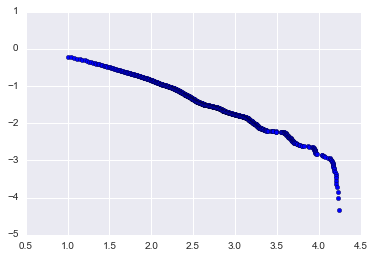

In [25]:
LaIN=[]
for element in mig:
    if ((element[1])=='06037'):
        LaIN.append(np.array(element,dtype=np.int))

        
LaOUT=[]
for element in mig:
    if ((element[0])=='06037'):
        LaOUT.append(np.array(element,dtype=np.int))
        
        
        
nearest=(array(LaOUT, dtype=np.int)[:,2:]).flatten()

bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))
show()

nearest=(array(LaIN, dtype=np.int)[:,2:]).flatten()
#print size(nearest)
bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))
show()


STD out  933.072750114 122.594521073


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in log10


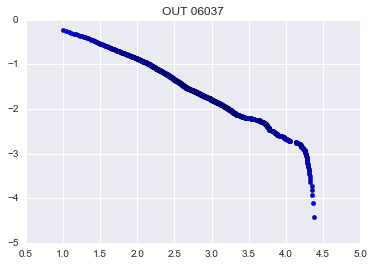

STD in  720.190232796 113.014519573


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in log10


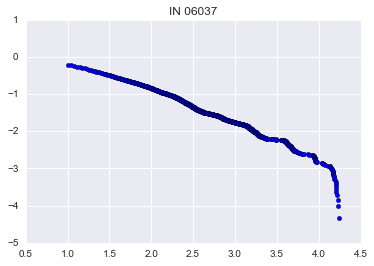

STD out  555.722702527 85.4051789474


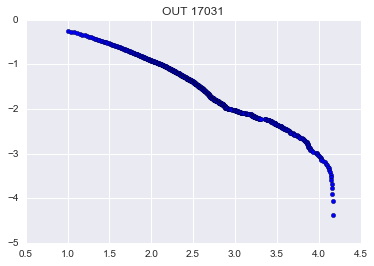

STD in  402.127214347 73.2662396204


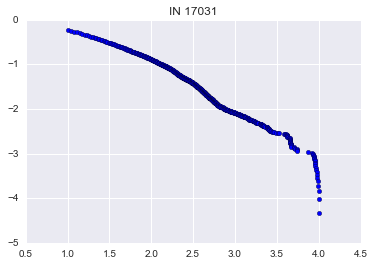

STD out  422.95170952 67.8212939841


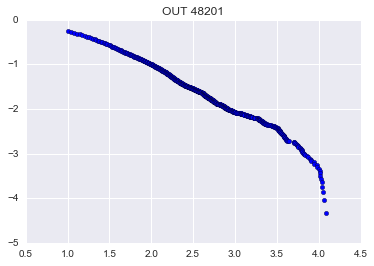

STD in  320.302215751 64.1257451404


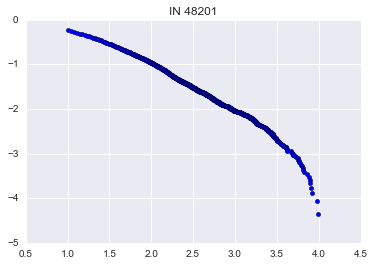

STD out  200.625193898 45.9406776379


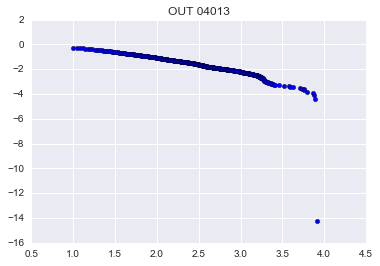

STD in  197.41871282 53.3536678201


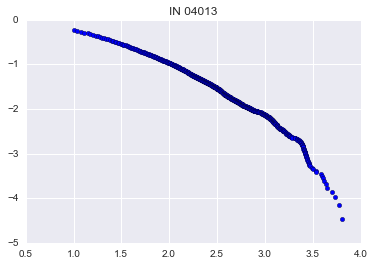

STD out  283.872840118 56.8271129707


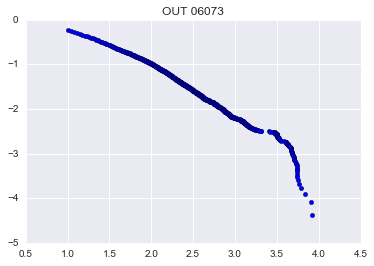

STD in  297.073653657 62.8179294118


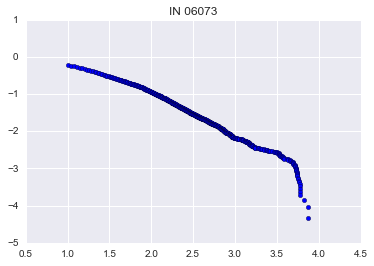

STD out  713.447696117 81.9524517088


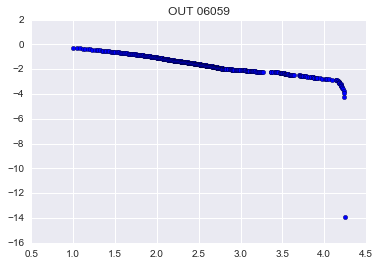

STD in  921.408665841 93.1552238806


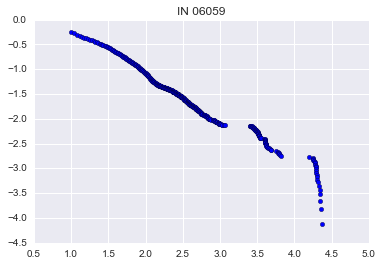

STD out  483.699420761 36.9054862119


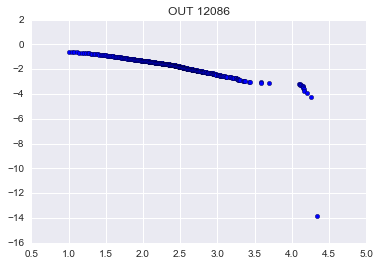

STD in  359.343720195 32.1205872757


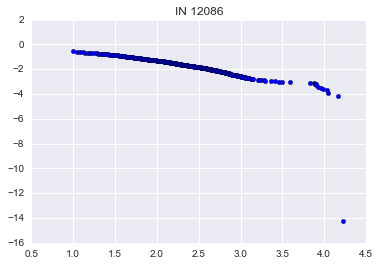

STD out  605.563448744 100.42973913


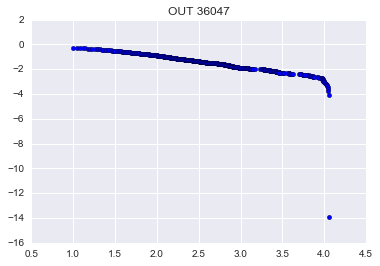

STD in  569.84708075 82.3609456265


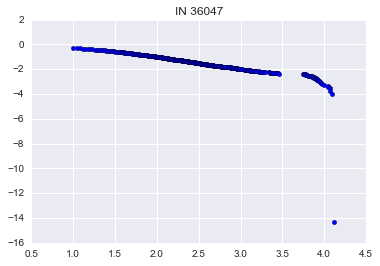

STD out  548.600496406 71.9583833116


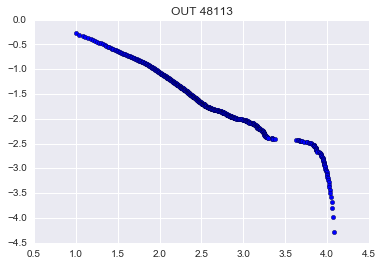

STD in  411.334266749 61.9762605549


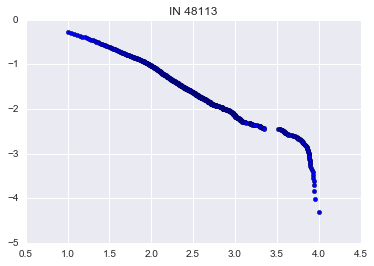

STD out  444.132210969 58.7235404896


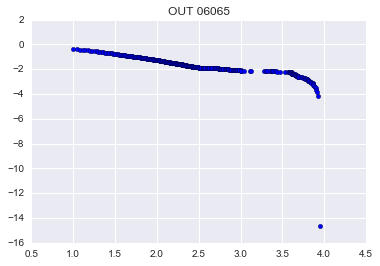

STD in  743.360450013 90.8771818182


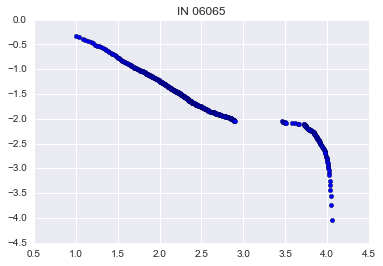

STD out  611.059692887 113.27755102


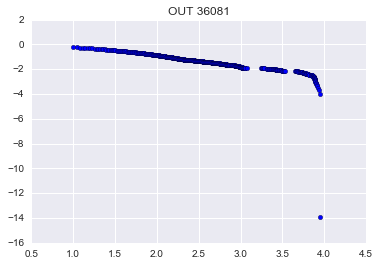

STD in  665.258628459 96.6494857143


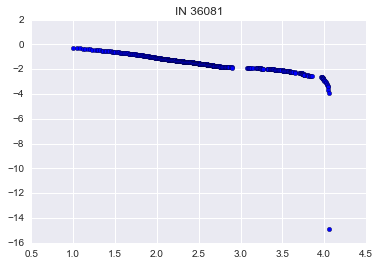

STD out  541.958973622 59.8172954925


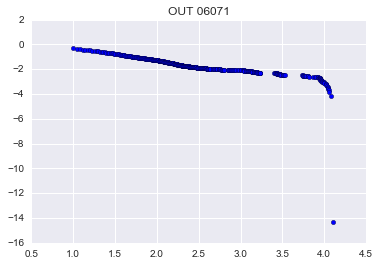

STD in  863.729972186 80.6671615721


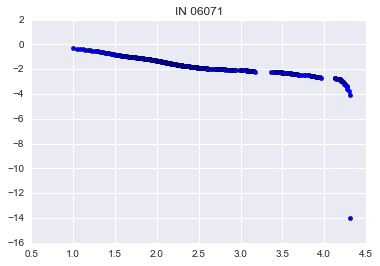

STD out  460.169603776 73.0544876325


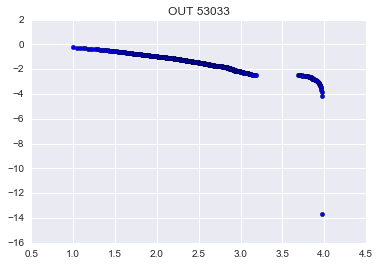

STD in  345.872696342 68.0730903328


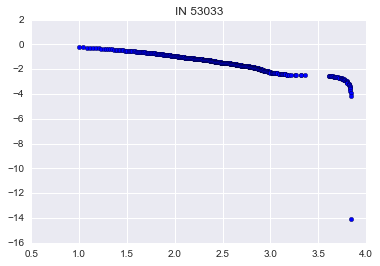

STD out  115.455968061 32.3636410923


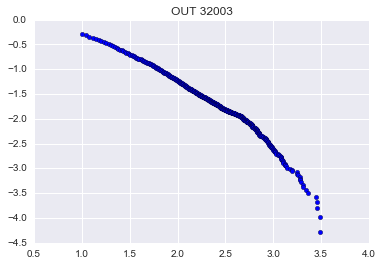

STD in  206.461185965 45.5543893591


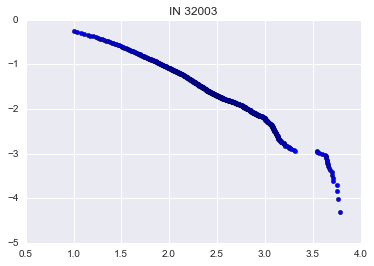

STD out  343.04570095 46.5996033994


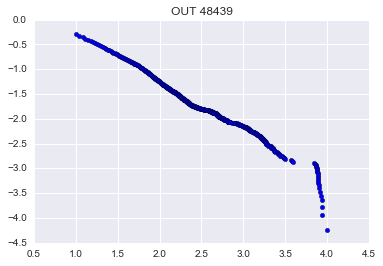

STD in  355.172312377 47.1837483617


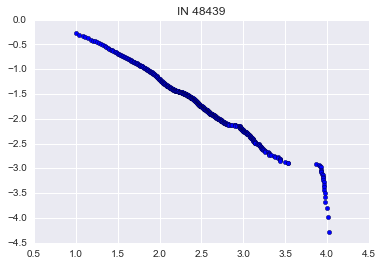

STD out  361.457086887 86.8942583732


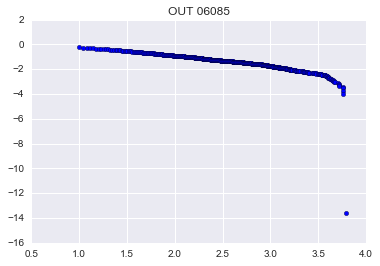

STD in  299.356783559 70.8949074074


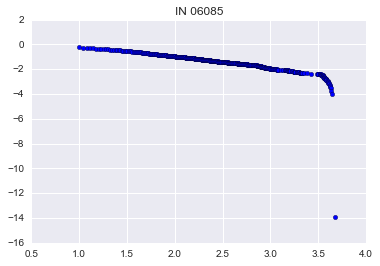

STD out  442.560271871 56.3544624448


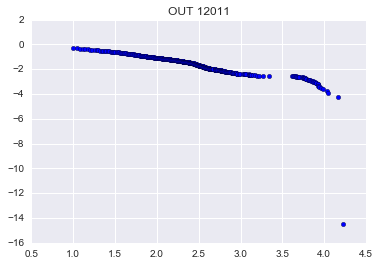

STD in  627.009064718 68.9597355372


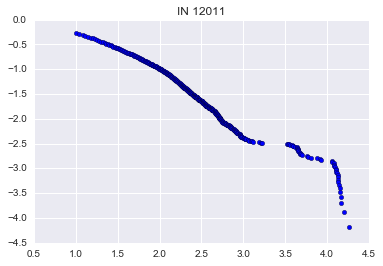

STD out  131.754403388 41.920071048


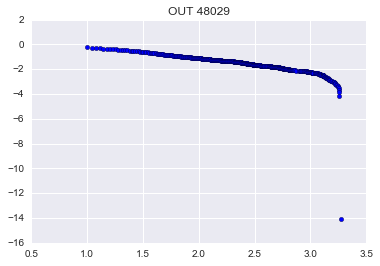

STD in  113.287914555 40.419125


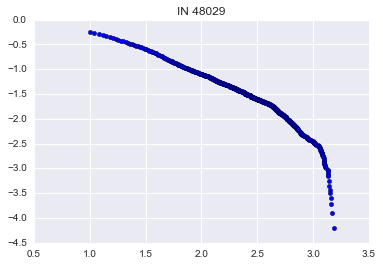

STD out  465.323116164 56.153220339


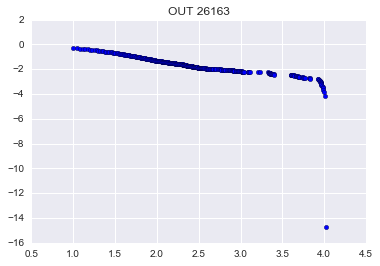

STD in  360.394678159 47.1031192661


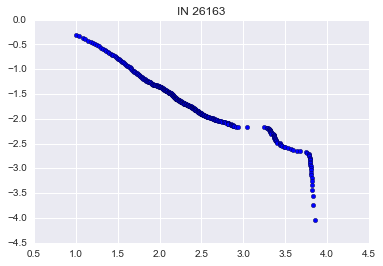

STD out  637.907629406 122.183492063


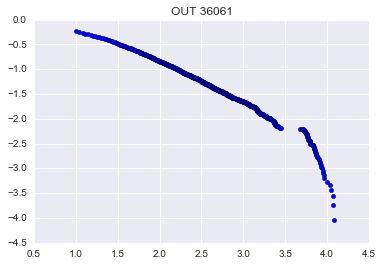

STD in  500.180149168 109.490556701


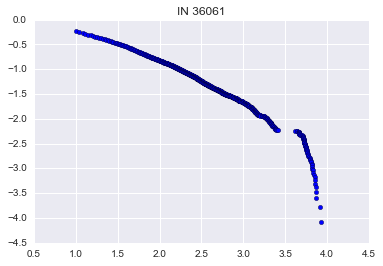

STD out  458.07168667 87.6217475728


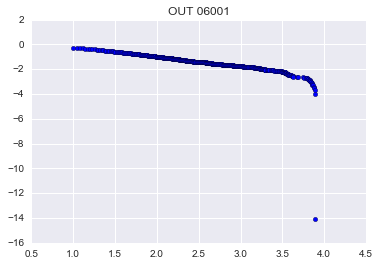

STD in  459.227302552 86.9307614213


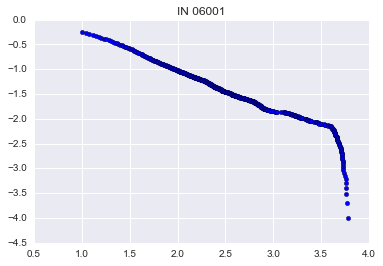

STD out  457.136321079 86.949266055


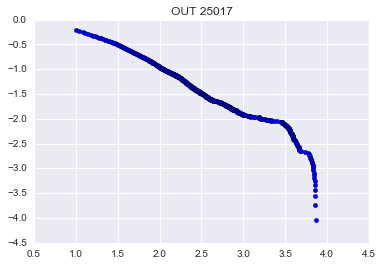

STD in  479.176415218 81.304


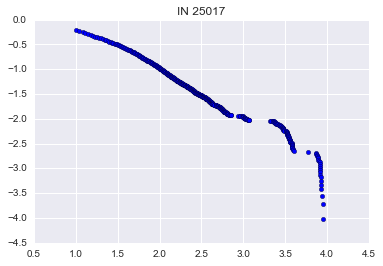

STD out  352.500765446 68.3725773196


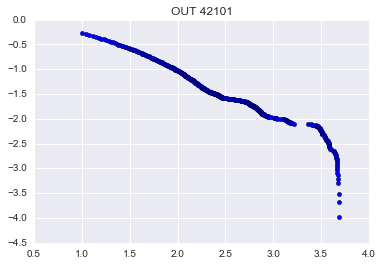

STD in  205.339331642 42.0740357853


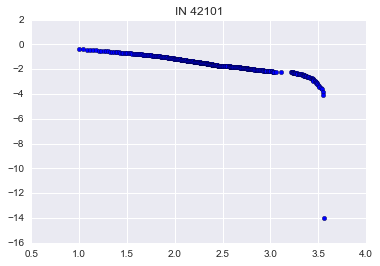

STD out  208.562144707 42.9201735358


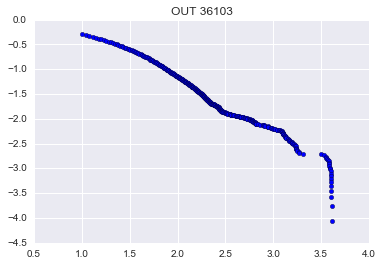

STD in  406.22386151 58.0593150685


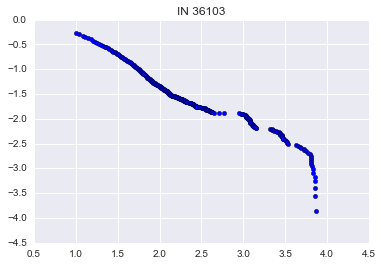

STD out  231.823142809 53.3615740741


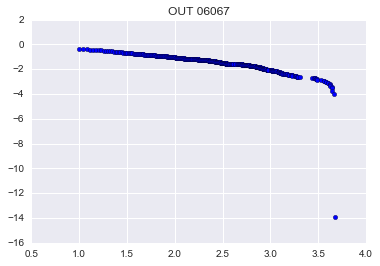

STD in  248.647607545 66.260704607


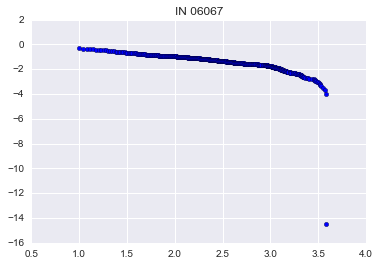

STD out  422.402874981 85.773105802


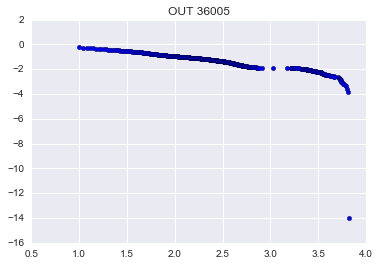

STD in  520.919355725 81.4982758621


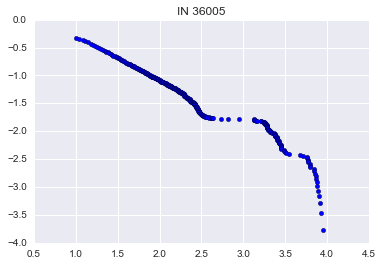

STD out  219.679001608 40.2495667244


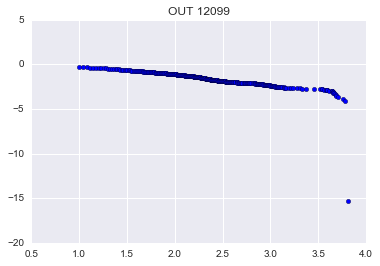

STD in  309.555840032 52.2859259259


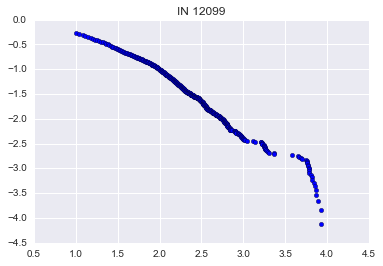

STD out  415.764826472 69.738879056


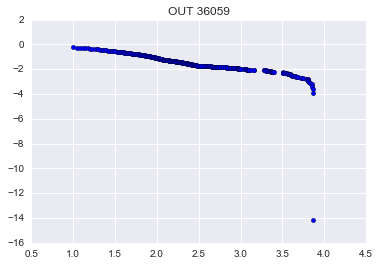

STD in  566.603025244 85.3488495575


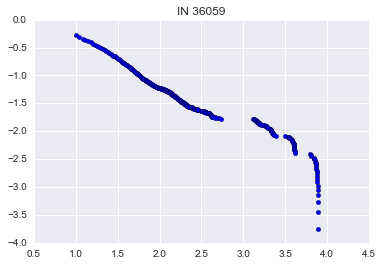

STD out  213.350263627 35.5848010974


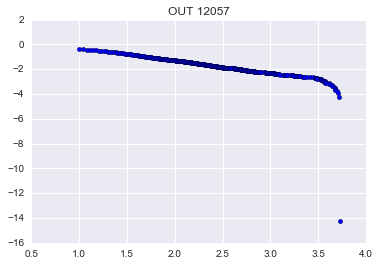

STD in  176.64062595 36.4359796438


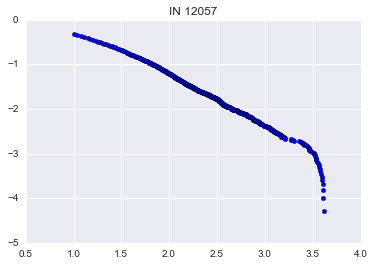

STD out  202.047535848 46.2866666667


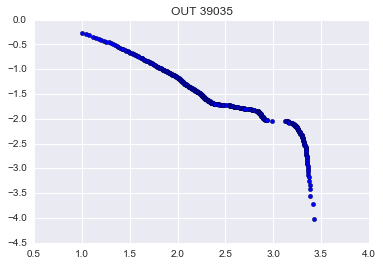

STD in  153.763660631 38.8766666667


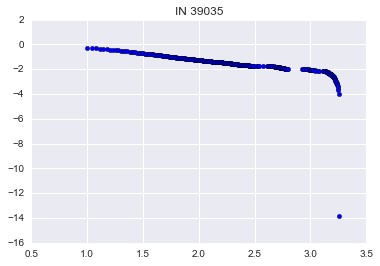

STD out  317.327011556 51.4843389831


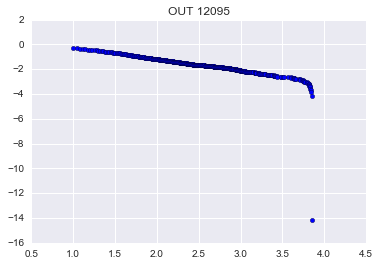

STD in  294.690744398 54.3134557596


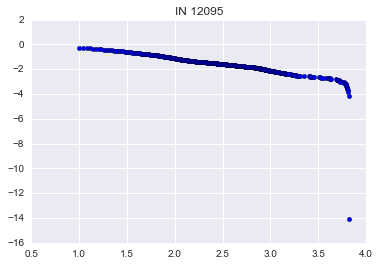

STD out  384.872586694 55.3488888889


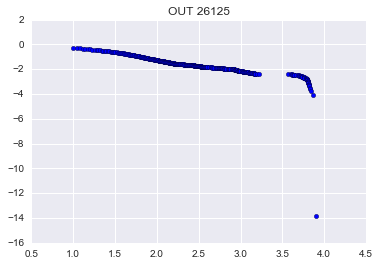

STD in  531.812052151 60.8512962963


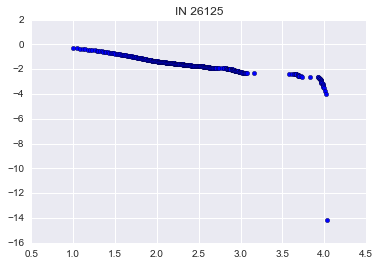

STD out  195.445778659 41.9283636364


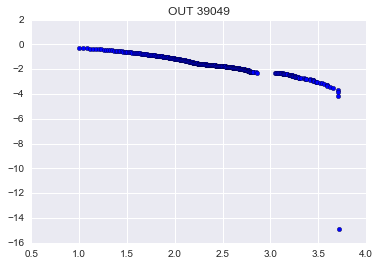

STD in  143.510766137 42.3499449541


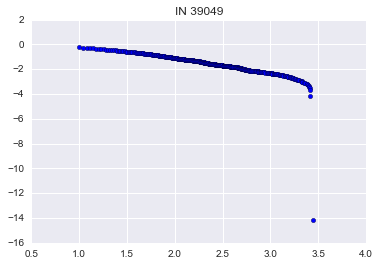

STD out  138.292103016 38.291754386


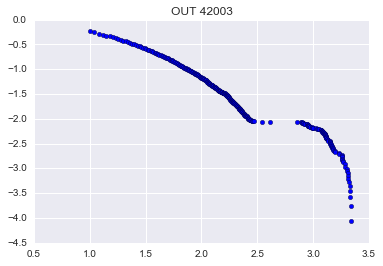

STD in  119.001509469 34.5018518519


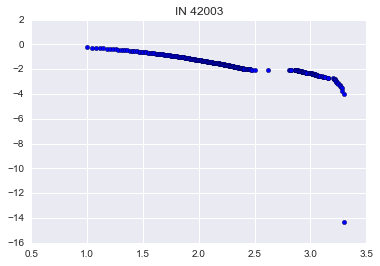

STD out  326.618638136 60.2885311871


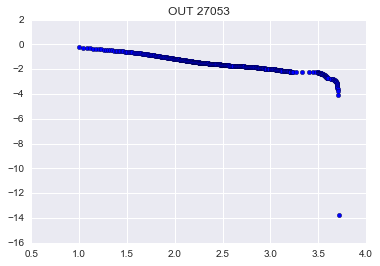

STD in  277.475742774 51.9042490842


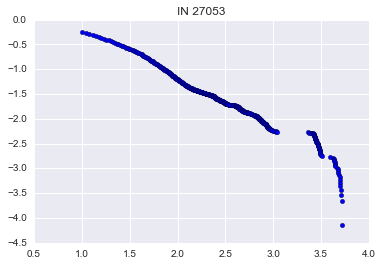

IndexError: too many indices for array

In [26]:
for element2 in topCode:
    IN=[]
    for element in mig:
        if ((element[1])==element2):
            IN.append(np.array(element,dtype=np.int))

        
    OUT=[]
    for element in mig:
        if ((element[0])==element2):
            OUT.append(np.array(element,dtype=np.int))
        
        
        
    nearest=(array(OUT, dtype=np.int)[:,2:]).flatten()
    print "STD out ",std(nearest),mean(nearest)
    
    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    #scatter(log10(init),log10(1-np.cumsum(values)))
    scatter(log10(x),log10(1-u))
    title('OUT '+(element2))
    show()

    nearest=(array(IN, dtype=np.int)[:,2:]).flatten()
    print "STD in ",std(nearest),mean(nearest)
    
    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    #scatter(log10(init),log10(1-np.cumsum(values)))
    scatter(log10(x),log10(1-u))
    title('IN '+(element2))
    show()
     

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log10


-0.879952988623 0.846264782184 0.991969784707


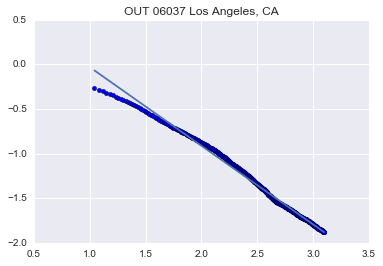

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: divide by zero encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in log10
/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: divide by zero encountered in log10


-0.883899820863 0.880037652428 0.989242715585


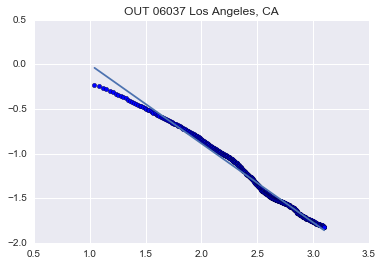

-1.04486433161 1.1482079046 0.973125664285


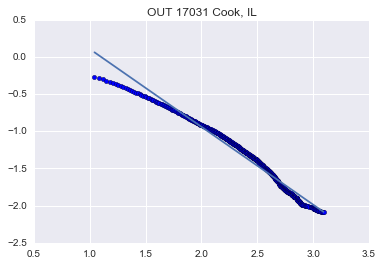

-1.10141512862 1.26226040163 0.971634934832


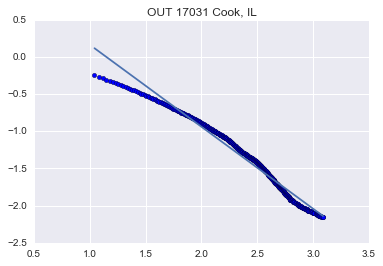

-1.01439642351 0.979836364161 0.994696855129


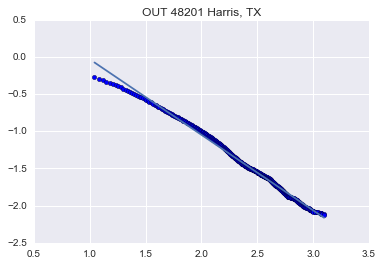

-1.01510226958 1.01630527375 0.995231683827


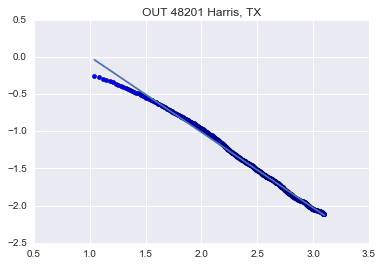

-1.08523413731 1.06460088993 0.993919988593


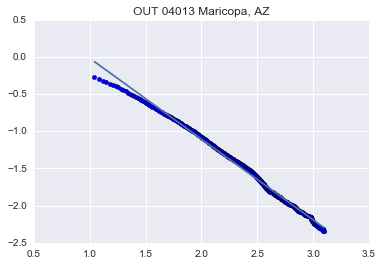

-1.11462874393 1.21122014987 0.989585062279


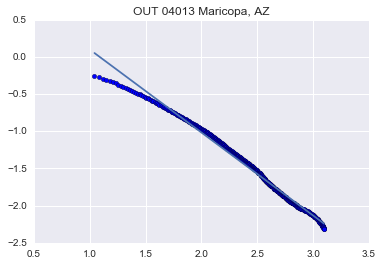

-1.10687084861 1.16894643565 0.990009881003


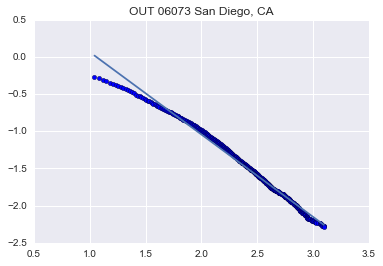

-1.10440904057 1.2149394821 0.988857945619


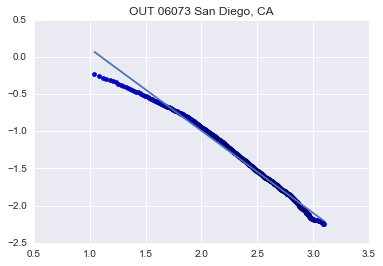

-1.01183078322 0.924467078404 0.99298203086


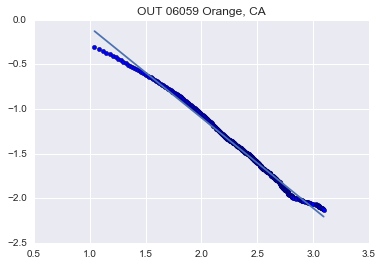

-1.01810820868 0.93930305282 0.99441218955


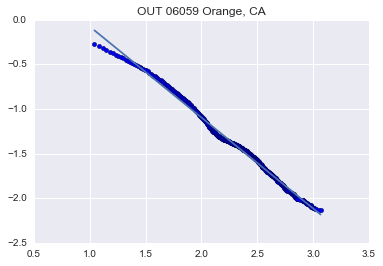

-1.01655588648 0.700969307877 0.981574347995


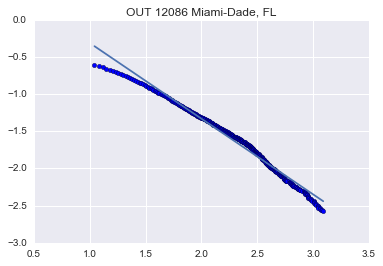

-1.08304739355 0.822896627606 0.979385112608


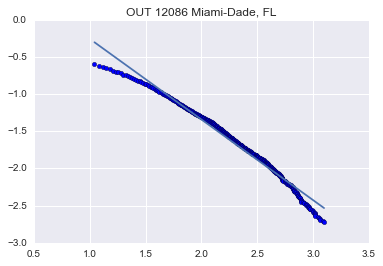

-0.885167597184 0.83857211852 0.992367082593


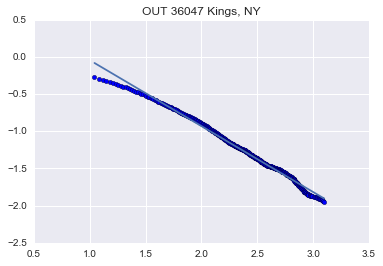

-0.952849561568 0.871868385673 0.995644814236


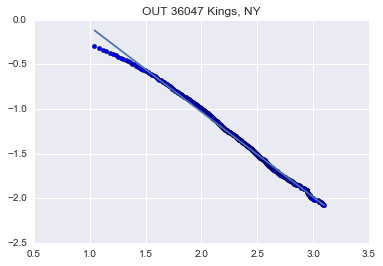

-0.98770473809 0.853775416641 0.985616050458


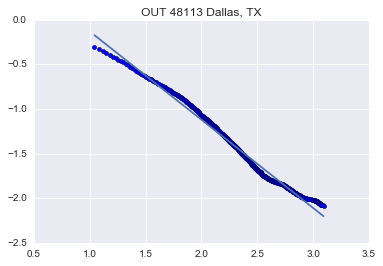

-1.04947195734 0.999539375617 0.994127313377


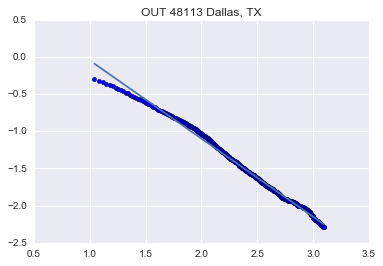

-0.950217684508 0.608131934687 0.977209707769


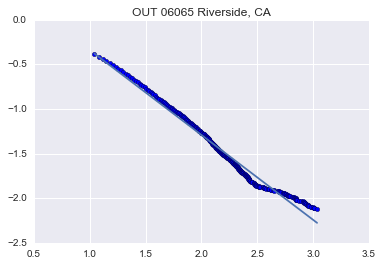

-0.956855932275 0.658064022971 0.994402397414


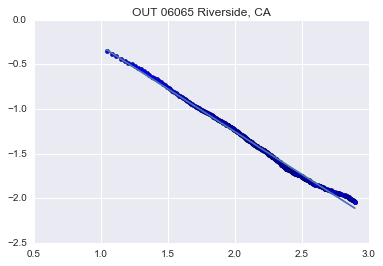

-0.87600375138 0.84739233447 0.993765877996


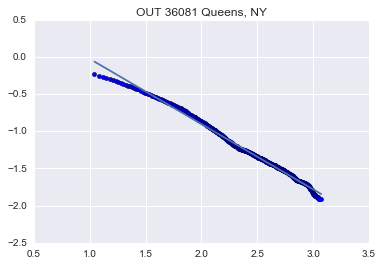

-0.90692414434 0.733183422189 0.994911529261


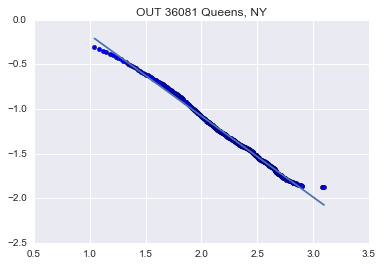

-0.969532654456 0.623982264433 0.963980717359


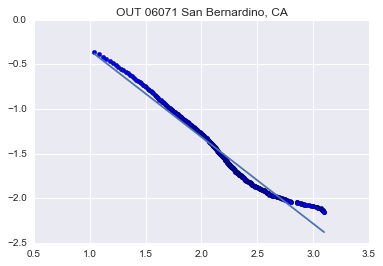

-0.952011858099 0.570766840039 0.964293425251


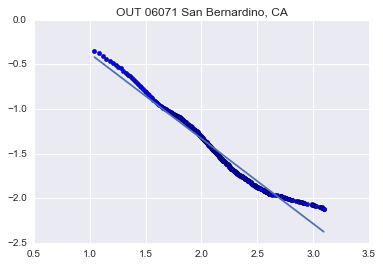

-1.07049057381 1.1583296255 0.973748223658


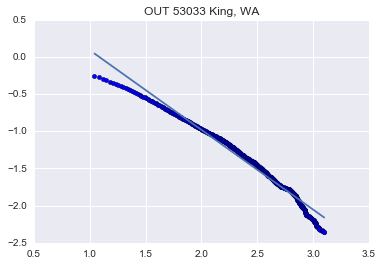

-1.10595858833 1.25239997727 0.973786592654


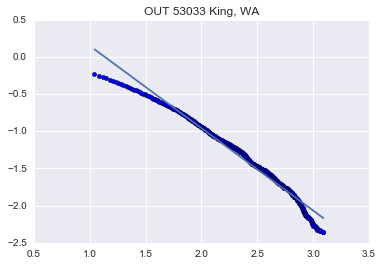

-1.20110958965 1.15773398562 0.98319883843


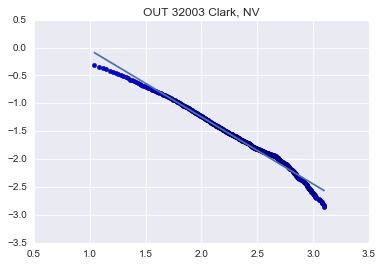

-1.10150387264 1.07681275851 0.993922508291


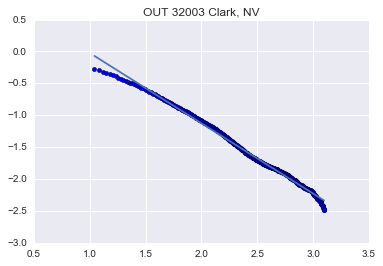

-0.977518729633 0.693492086565 0.984805601024


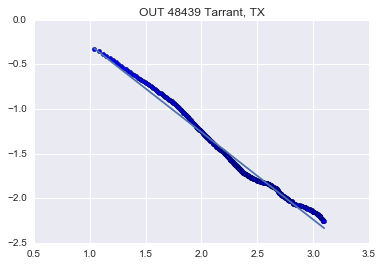

-1.06330804841 0.91722572918 0.994878246853


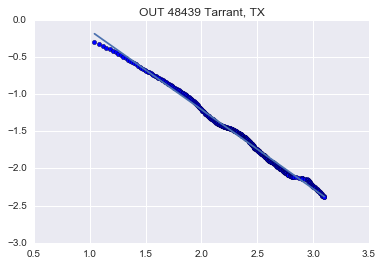

-0.797412826191 0.680824488745 0.995210673645


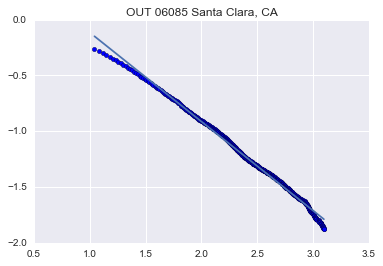

-0.893918480343 0.814303770779 0.992906205086


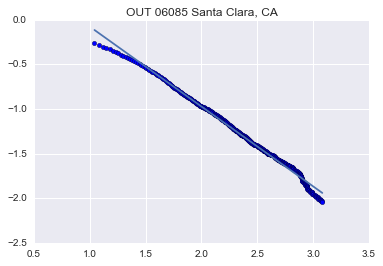

-1.19219410797 1.27185019029 0.965818790958


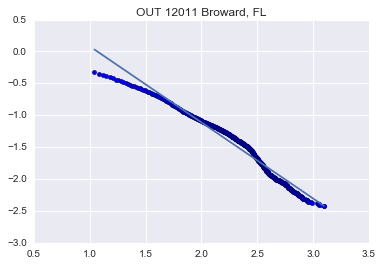

-1.21011864063 1.35266287287 0.977422460135


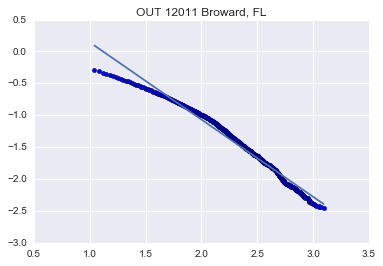

-1.0744512426 1.03494849486 0.989996393834


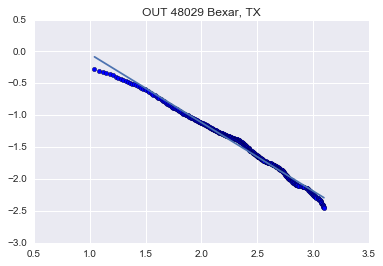

-1.20104871931 1.31082283077 0.957310731444


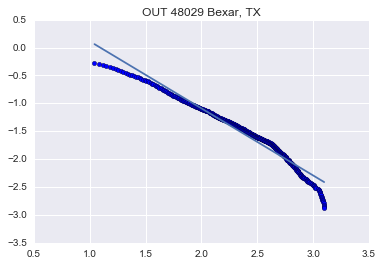

-1.01665086161 0.743340512561 0.980147113877


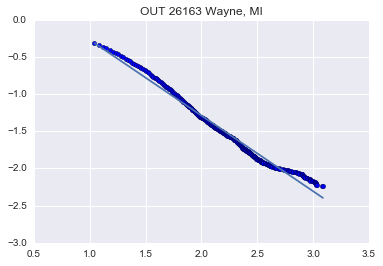

-1.02457091768 0.693182582938 0.988753949976


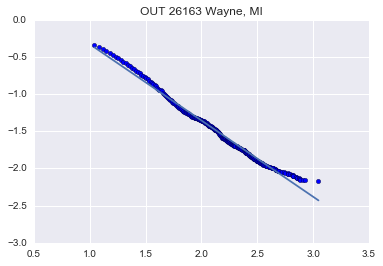

-0.794584077646 0.734233673865 0.996108915803


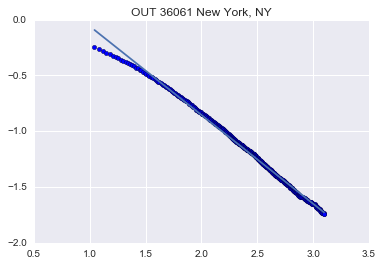

-0.810141553597 0.774624079432 0.992792673788


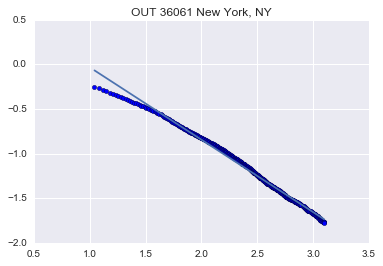

-0.794583138837 0.589419173563 0.996736772738


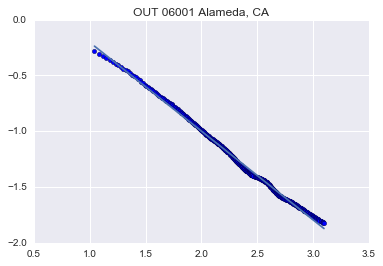

-0.831625964182 0.642088876889 0.998438752883


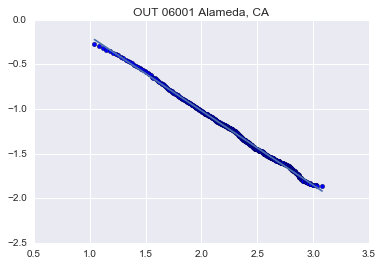

-0.953115432397 0.926229974128 0.993819140793


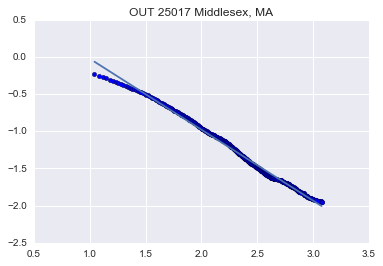

-1.01857147685 1.0181748153 0.992748147032


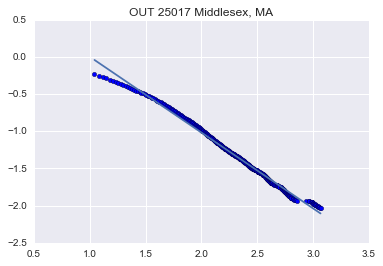

-0.916398765943 0.760744429711 0.985106389868


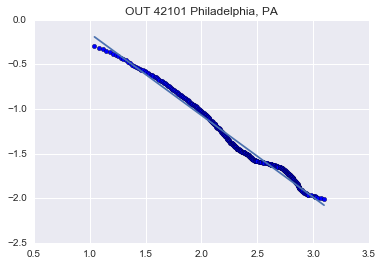

-1.00123835408 0.809949476569 0.991815954612


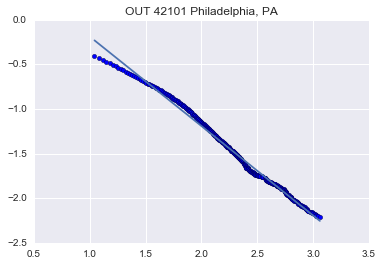

-1.12295896553 1.04279580796 0.977324210148


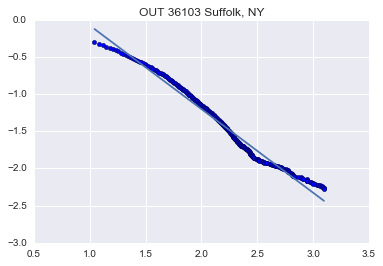

-0.850330319154 0.420106214664 0.927977868574


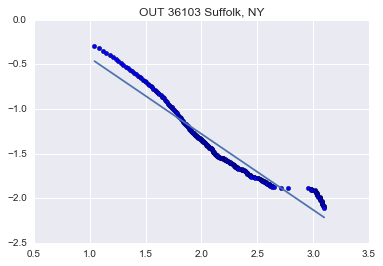

-0.901621358144 0.751445109718 0.971597321325


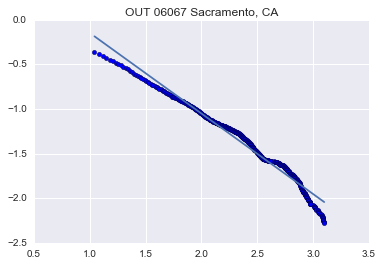

-0.753875295919 0.522673520381 0.986507480165


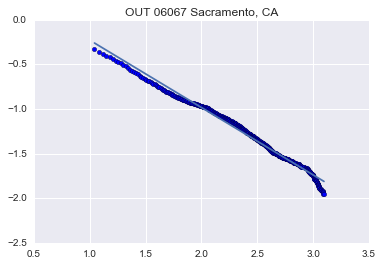

-0.917990475183 0.879460581655 0.965949998264


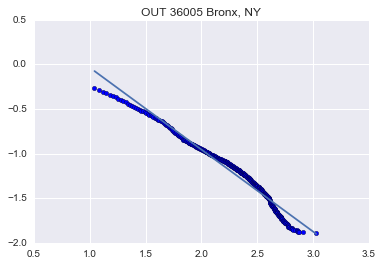

-0.920924421978 0.722623972904 0.97651481698


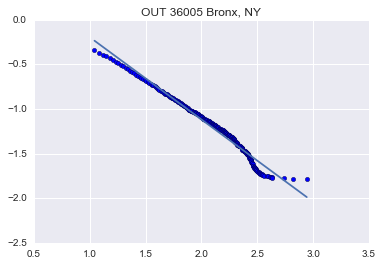

-1.19038758683 1.16703228982 0.983612977867


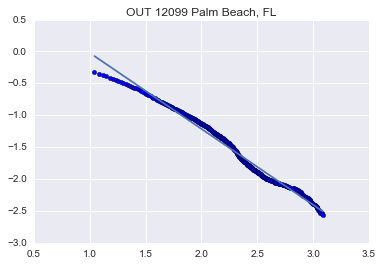

-1.20052821297 1.31311320517 0.979947820957


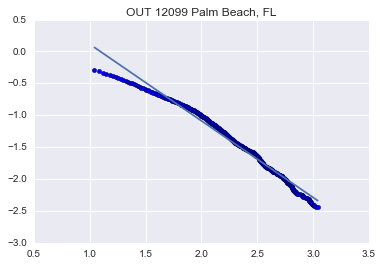

-0.981844303609 0.845761949127 0.972623376276


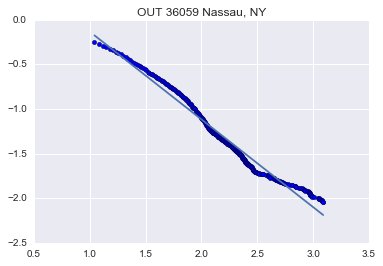

-0.920962286488 0.639249164004 0.990186642083


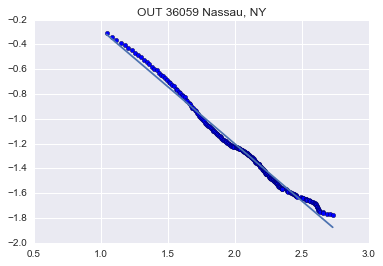

-1.04297712351 0.782421768291 0.997922317531


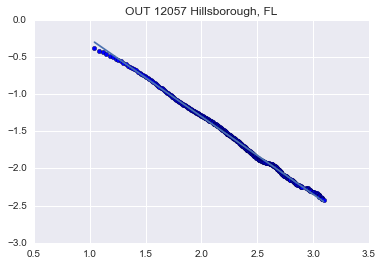

-1.12476273898 1.0114164811 0.996817746745


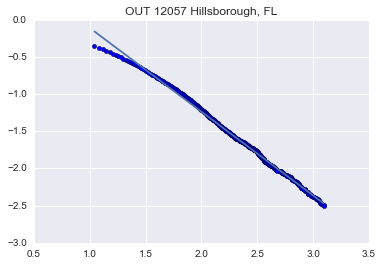

-0.93199456437 0.66613415154 0.965082942921


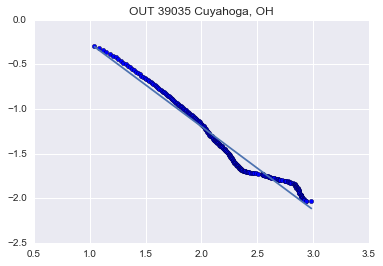

-0.906746341074 0.575961602798 0.984830384493


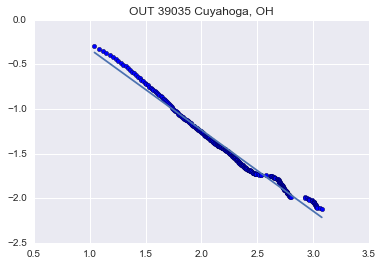

In [27]:
SlopesIN=[]
SlopesOUT=[]

topCode=[codeS for (newestS,codeS) in sorted(zip(newest,code))]
topCode=topCode[::-1]
topCode=topCode[:30]


for element2 in topCode:
    
    IN=[]
    for element in mig:
        if ((element[1])==element2):
            IN.append(np.array(element,dtype=np.int))

        
    OUT=[]
    for element in mig:
        if ((element[0])==element2):
            OUT.append(np.array(element,dtype=np.int))
        
        
        
    nearest=(array(OUT, dtype=np.int)[:,2:]).flatten()

    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    #xx=log10(init)[np.argmax(log10(init)>1):np.argmax(log10(init)>3.2)]
    #yy=log10(1-np.cumsum(values))[np.argmax(log10(init)>1):np.argmax(log10(init)>3.2)]
    xx=log10(x)[np.argmax(log10(x)>1):np.argmax(log10(x)>3.1)]
    yy=log10(1-u)[np.argmax(log10(x)>1):np.argmax(log10(x)>3.1)]
    scatter(xx,yy)
    slope, intercept, r_value, p_value, std_err = stats.linregress(xx,yy)
    plot(xx,xx*slope+intercept)
    print slope, intercept, r_value**2
    title('OUT '+(element2)+' '+top[topCode.index(element2)])
    show()
    SlopesOUT.append(slope)

    nearest=(array(IN, dtype=np.int)[:,2:]).flatten()

    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    #xx=log10(init)[np.argmax(log10(init)>1):np.argmax(log10(init)>3.2)]
    #yy=log10(1-np.cumsum(values))[np.argmax(log10(init)>1):np.argmax(log10(init)>3.2)]
    xx=log10(x)[np.argmax(log10(x)>1):np.argmax(log10(x)>3.1)]
    yy=log10(1-u)[np.argmax(log10(x)>1):np.argmax(log10(x)>3.1)]
    scatter(xx,yy)
    slope, intercept, r_value, p_value, std_err = stats.linregress(xx,yy)
    plot(xx,xx*slope+intercept)
    print slope, intercept, r_value**2
    title('OUT '+(element2)+' '+top[topCode.index(element2)])
    show()
    SlopesIN.append(slope)

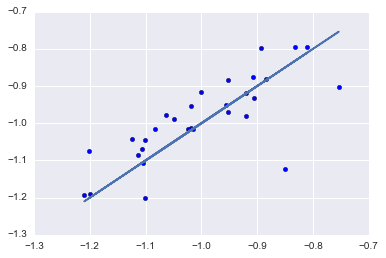

In [28]:
scatter(SlopesIN,SlopesOUT)
plot(SlopesIN,SlopesIN)
#there are more outflows than inflows, consistent with urban expansion, bigger migration to neighbouring counties
#there is no way this things have well defined variances, exponent is even too low for mean in some cases

In [29]:
bottCode=[codeS for (newestS,codeS) in sorted(zip(newest,code))]
bottCode=bottCode[100:110]
bottCode

['29227',
 '48359',
 '46017',
 '02105',
 '30107',
 '46095',
 '20025',
 '20187',
 '48327',
 '20203']

29227


/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


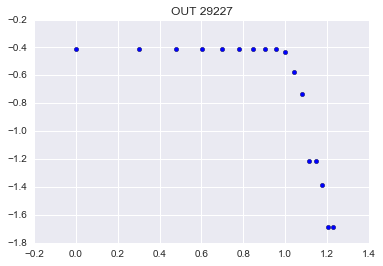

/Users/Felipe/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: divide by zero encountered in log10


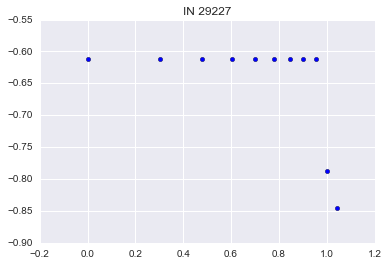

48359


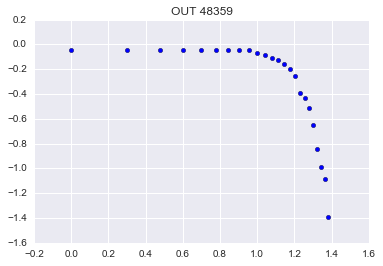

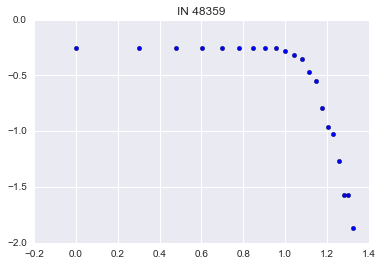

46017


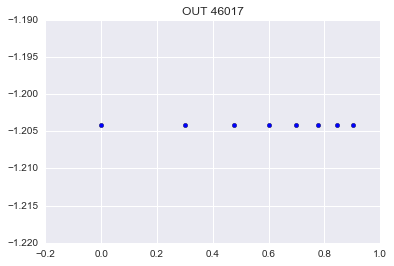

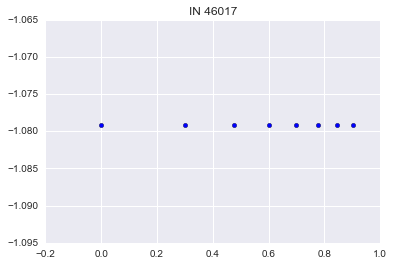

02105


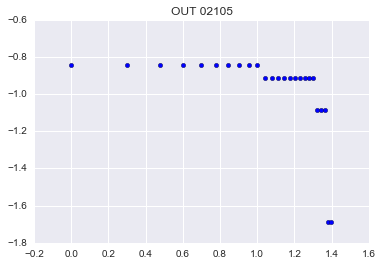

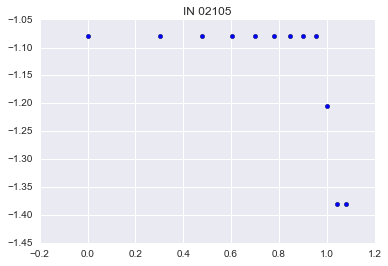

30107


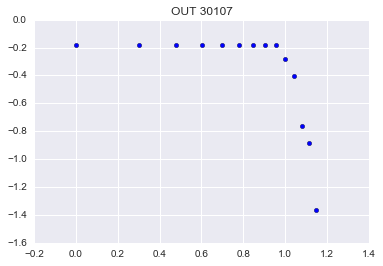

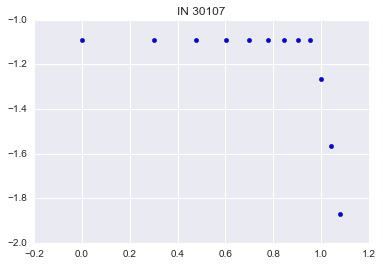

46095


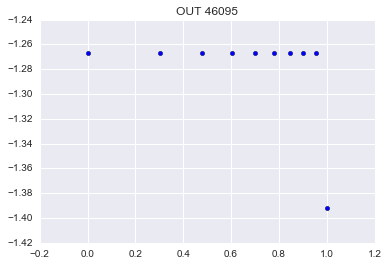

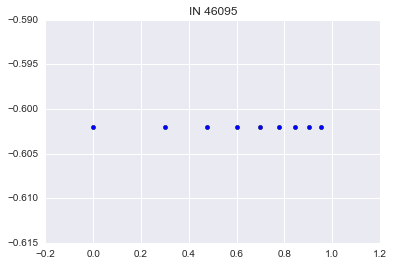

20025


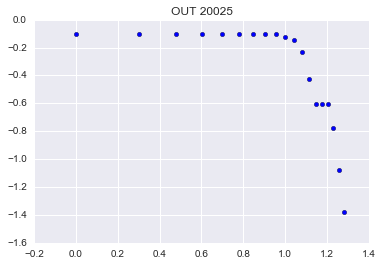

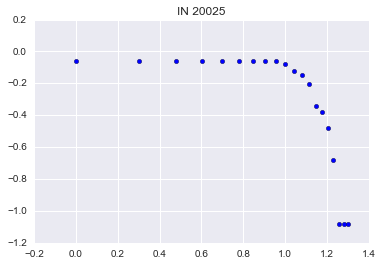

20187


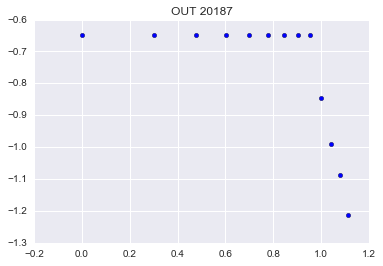

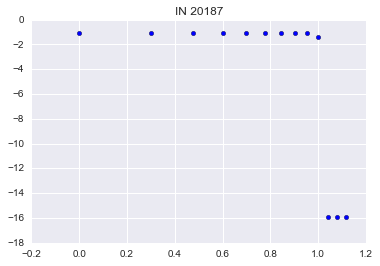

48327


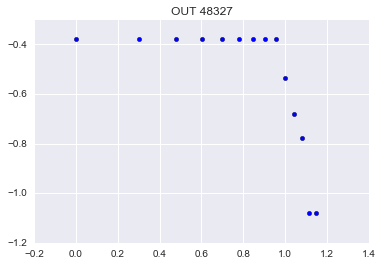

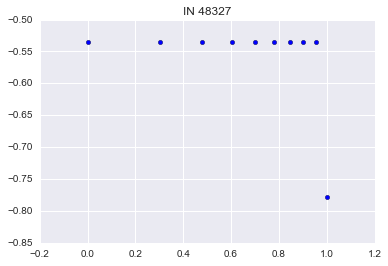

20203


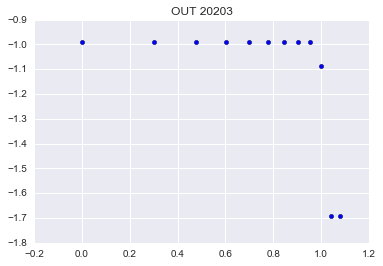

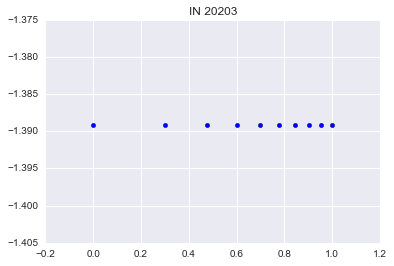

In [30]:
#top ten above dont have data on transitions
for element3 in bottCode:
    print element3
    IN=[]
    for element in mig:
        if ((element[1])==element3):
            IN.append(np.array(element,dtype=np.int))

        
    OUT=[]
    for element in mig:
        if ((element[0])==element3):
            OUT.append(np.array(element,dtype=np.int))
        
        
    #print IN , OUT  
    nearest=(array(OUT, dtype=np.int)[:,2:]).flatten()

    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    scatter(log10(init),log10(1-np.cumsum(values)))
    title('OUT '+(element3))
    show()
    
    
    nearest=(array(IN, dtype=np.int)[:,2:]).flatten()

    bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
    values, base = np.histogram(nearest, bins=bins, density=1)
    u, indices = np.unique(np.cumsum(values), return_index=True)
    init=bins[:-1]
    x=[init[j] for j in indices]
    scatter(log10(init),log10(1-np.cumsum(values)))
    title('IN '+(element3))
    show()

In [31]:
#calculate variance of gaussian from power law in each county.
#calculate total in and outflows and relate variance to the total population.
#How closely is IN-OUT vs IN and OUT.
#Stick and slip conditions
#literature search


In [32]:
#mig has data fro 1990 to 2014

In [33]:
#variance from power law
#literature
#exponent consistent with CTL?
#total inflows vs outflows in one year
#In -Out vs In and OUT separately... same order of magnitude???


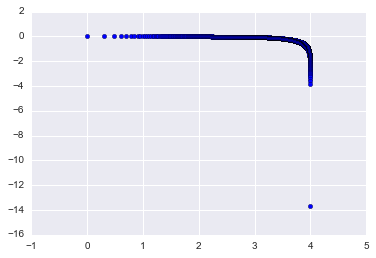

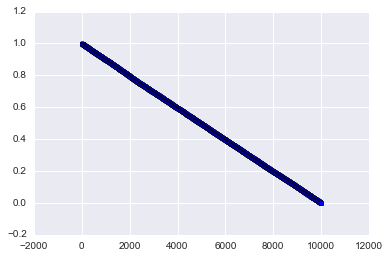

In [34]:
##checking if I can reproduce the behavior just by using random integers

import random
nearest=np.array([random.randint(0,10000) for i in range(21075)],dtype=np.int)

bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
#scatter(log10(init),log10(1-np.cumsum(values)))
scatter(log10(x),log10(1-u))
show()

scatter((x),(1-u))
show()

In [35]:
element5='06037'
IN=[]
for element in mig:
    if ((element[1])==element5):
        IN.append(np.array(element,dtype=np.int))

        
OUT=[]
for element in mig:
    if ((element[0])==element5):
        OUT.append(np.array(element,dtype=np.int))

In [36]:
##ins-outs practically irrelevant in population differences? gaussian behavior may come from birthsand deaths

outs=(array(OUT, dtype=np.int)[:,2:])
ins=(array(IN, dtype=np.int)[:,2:])


print sum(outs.T,1), sum(ins.T,1), sum(ins.T,1)-sum(outs.T,1)
print amax(outs.T,1), amax(ins.T,1),amax(outs.T,1)- amax(ins.T,1)

[153569 146983 150543 152374 143823 125632 120732 116308 115173 118816
 117129 114919 115853 122927 131870 140820 138162 126694 120205 118899
 115855 132218 134512 124407 101294] [101674  96329  83799  78096  81152  79615  86150  91895  96135  95084
  96144  96541  95380  94057  92277  93782  91307 100742 101396  95961
 101700 118900 118308 106448  88909] [-51895 -50654 -66744 -74278 -62671 -46017 -34582 -24413 -19038 -23732
 -20985 -18378 -20473 -28870 -39593 -47038 -46855 -25952 -18809 -22938
 -14155 -13318 -16204 -17959 -12385]
[24212 24218 23359 22947 22120 20756 22154 22315 21097 20369 19386 18688
 19227 19926 20065 20565 18536 17814 17736 19127 18243 19871 20274 19238
 15621] [17455 17351 16042 14921 14946 13950 14507 16211 17191 15964 16025 16127
 15743 15413 14943 14615 14058 14724 15192 15148 14834 17241 17960 16554
 13709] [6757 6867 7317 8026 7174 6806 7647 6104 3906 4405 3361 2561 3484 4513 5122
 5950 4478 3090 2544 3979 3409 2630 2314 2684 1912]


'differences and migration in LA'

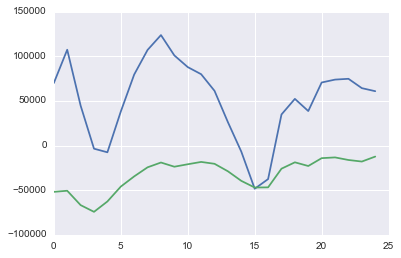

In [37]:

a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
c=(a[229][8:-1])
ome=diff((np.array(c, dtype=np.int)))[-25:]
plot(ome)
lediff=sum(ins.T,1)-sum(outs.T,1)
plot(lediff)
"differences and migration in LA"

initial pop, median, mean,std 7042756 -24413.0 -32717.44 17786.3720912


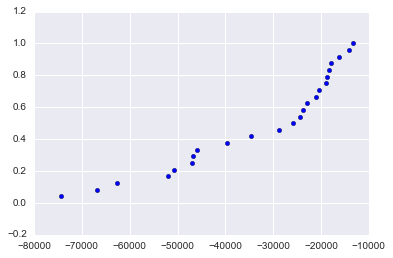

In [38]:
element5='06037'
IN=[]
for element in mig:
    if ((element[1])==element5):
        IN.append(np.array(element,dtype=np.int))

        
OUT=[]
for element in mig:
    if ((element[0])==element5):
        OUT.append(np.array(element,dtype=np.int))

outs=(array(OUT, dtype=np.int)[:,2:])
ins=(array(IN, dtype=np.int)[:,2:])


lediff=sum(ins.T,1)-sum(outs.T,1)
nearest=lediff
central.append([np.median(nearest), np.mean(nearest)])
print 'initial pop, median, mean,std',c[0], np.median(nearest), np.mean(nearest),np.std(nearest)
bins = np.arange(np.floor(nearest.min()),np.ceil(nearest.max()))
values, base = np.histogram(nearest, bins=bins, density=1)
u, indices = np.unique(np.cumsum(values), return_index=True)
init=bins[:-1]
x=[init[j] for j in indices]
scatter(x, u)

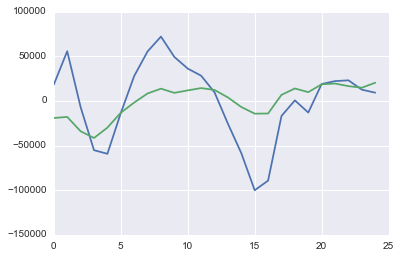

6449353653.4320011

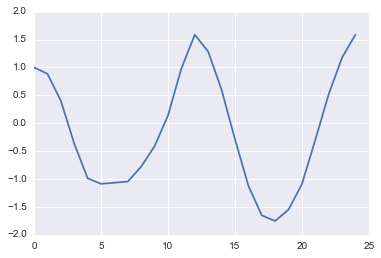

In [39]:
plot(ome-mean(ome))
plot(lediff-mean(lediff))
show()
core=correlate(ome-mean(ome),lediff-mean(lediff),'same')
plot(core/core[0])
core[0]

0
Los Angeles, CA


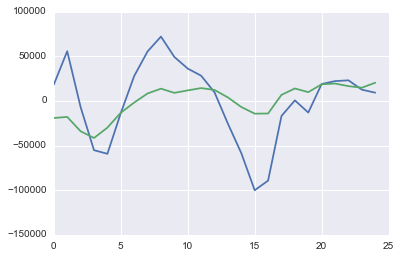

371729867.544


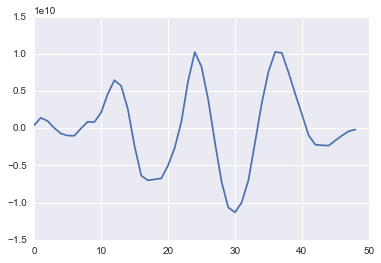

1
Cook, IL


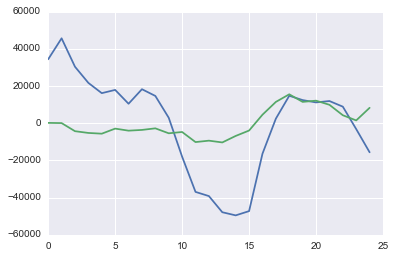

284359586.314


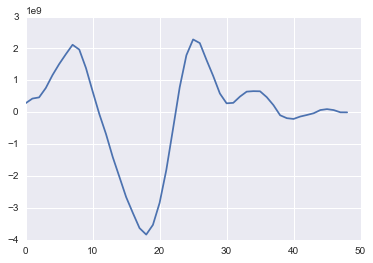

2
Harris, TX


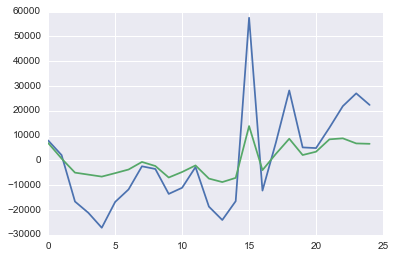

53705336.0752


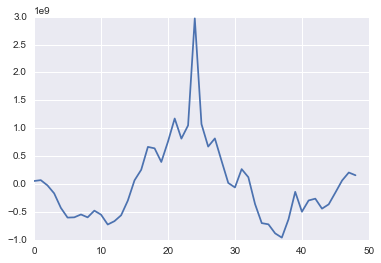

3
Maricopa, AZ


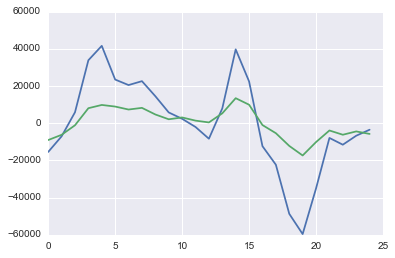

89178595.4304


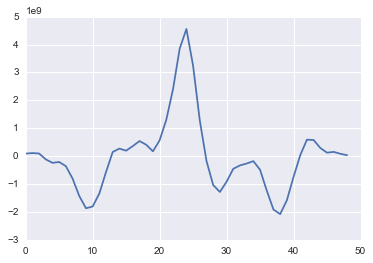

4
San Diego, CA


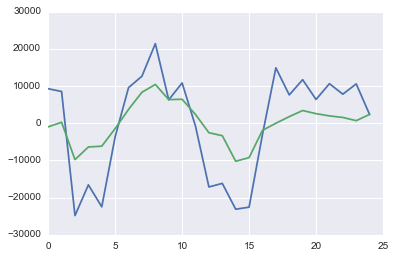

21976151.1648


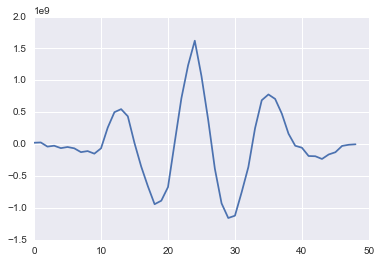

5
Orange, CA


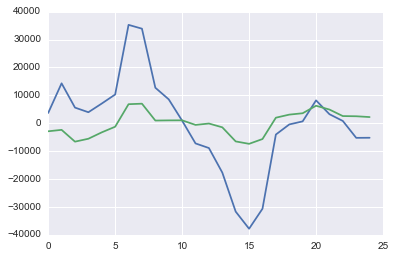

8088092.12


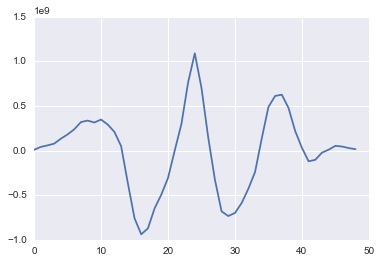

6
Miami-Dade, FL


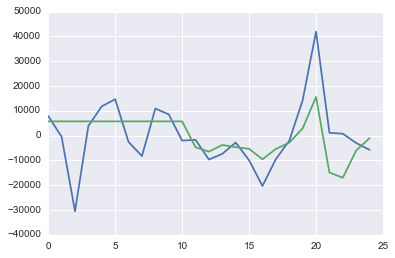

-8234392.0


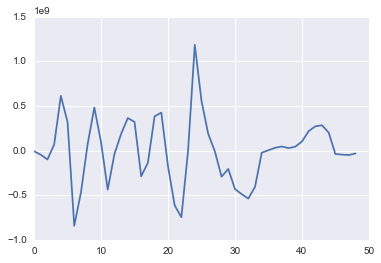

7
Kings, NY


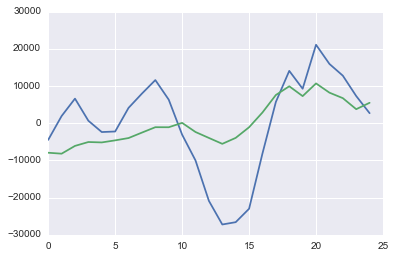

-24604021.12


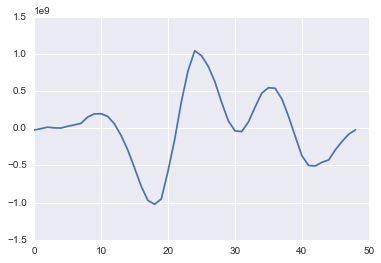

8
Dallas, TX


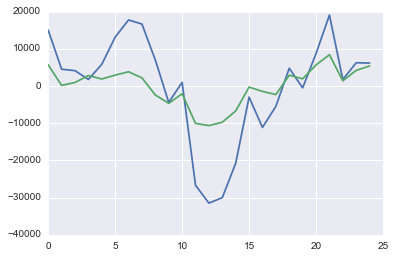

80657128.2944


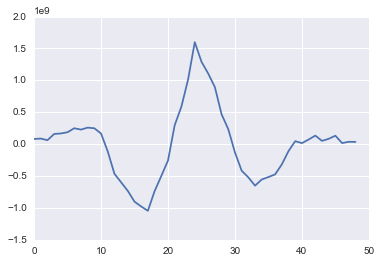

9
Riverside, CA


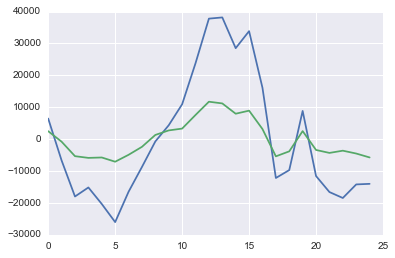

-37070664.352


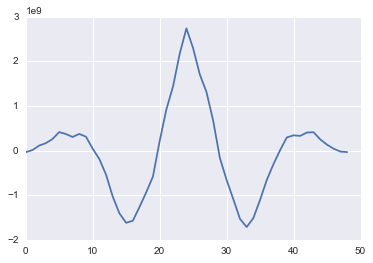

10
Queens, NY


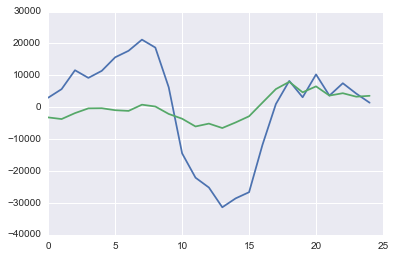

10775301.9552


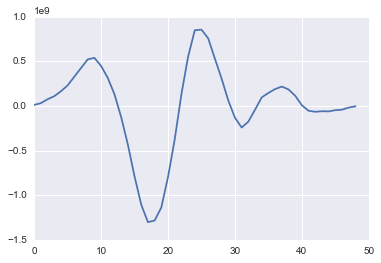

11
San Bernardino, CA


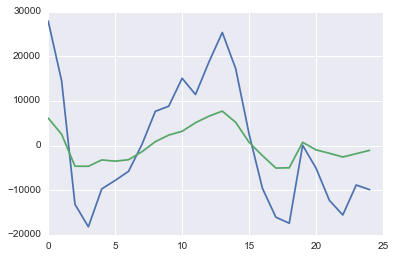

-30106382.4


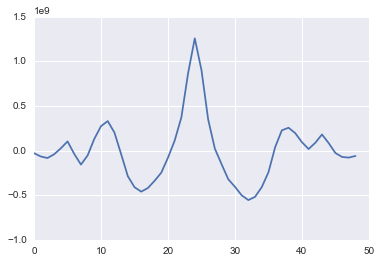

12
King, WA


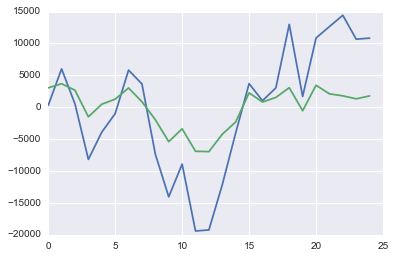

517885.3904


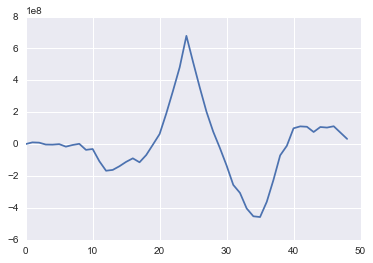

13
Clark, NV


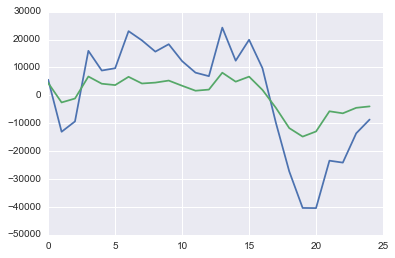

-22150044.3584


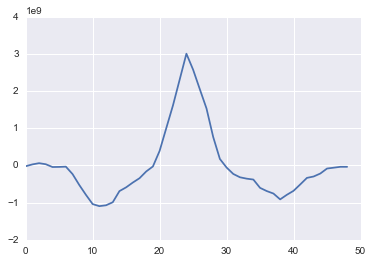

14
Tarrant, TX


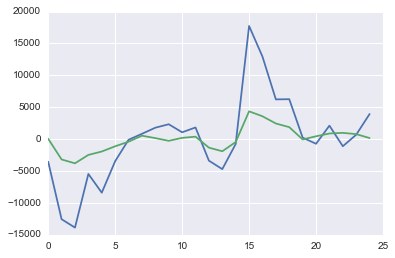

-610013.9344


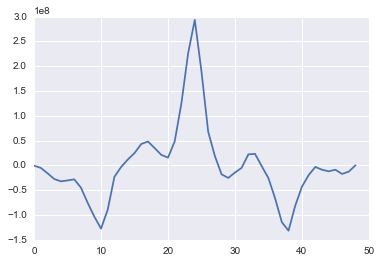

15
Santa Clara, CA


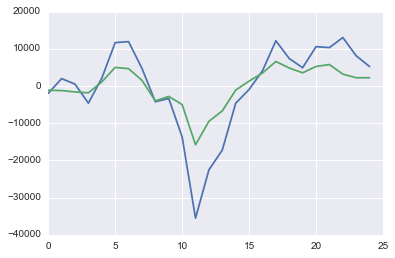

-4394599.776


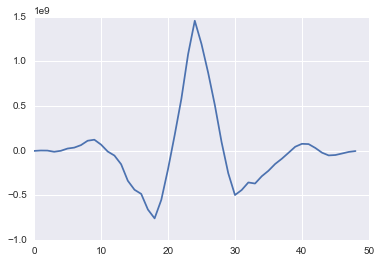

16
Broward, FL


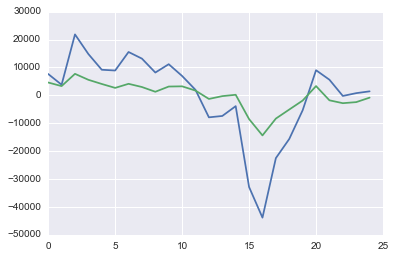

-6405493.1584


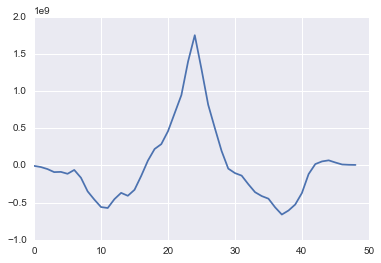

17
Bexar, TX


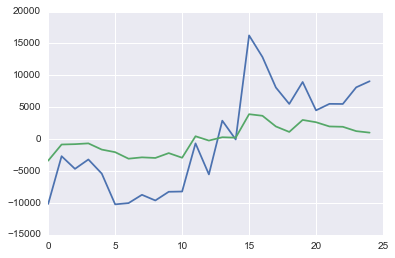

-10367981.8112


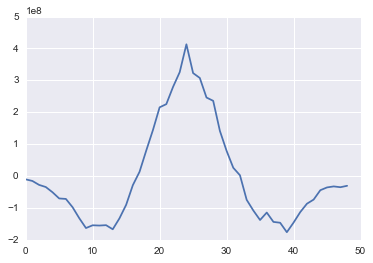

18
Wayne, MI


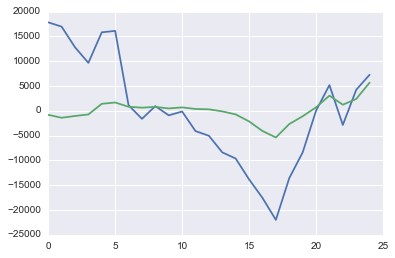

101333791.68


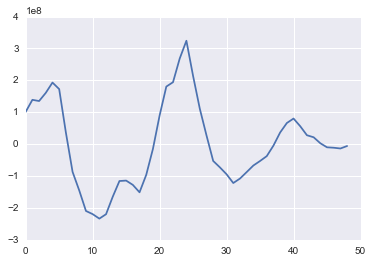

19
New York, NY


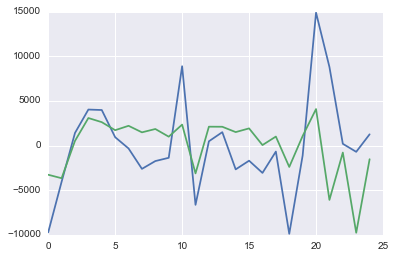

14911184.4


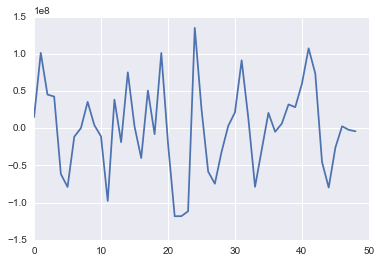

20
Alameda, CA


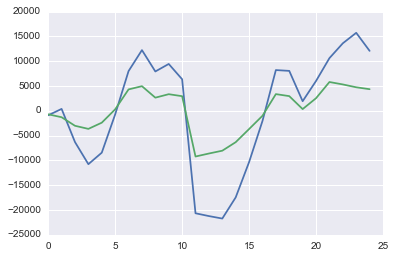

-3943308.9024


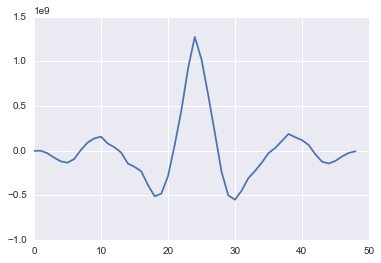

21
Middlesex, MA


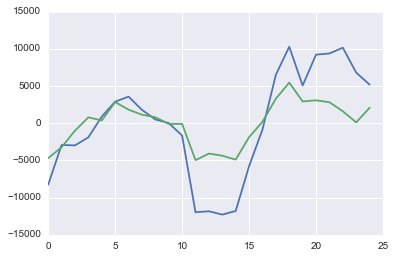

-17199400.2432


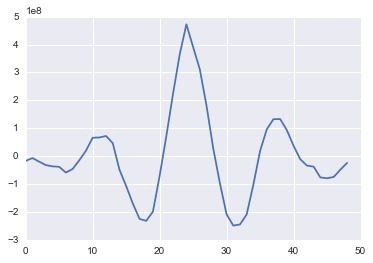

22
Philadelphia, PA


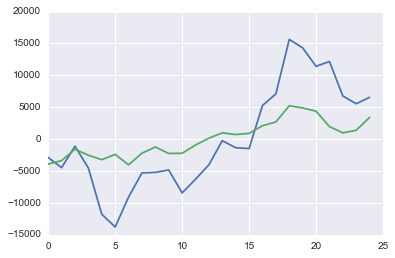

-9806331.8272


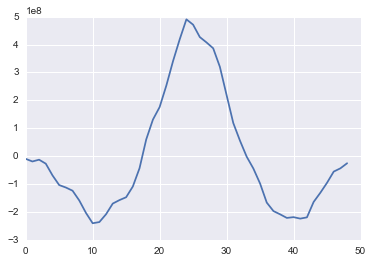

23
Suffolk, NY


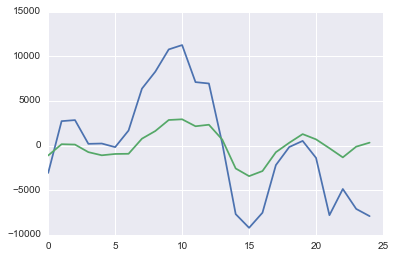

-986575.0752


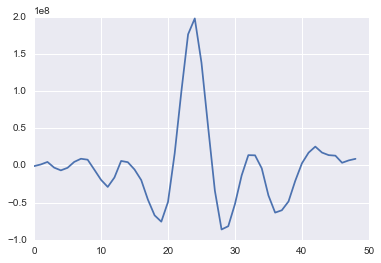

24
Sacramento, CA


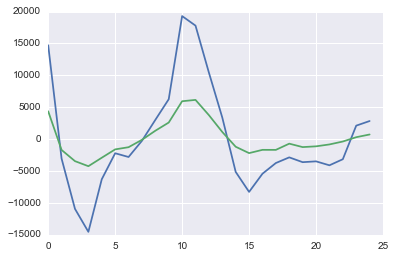

10745132.8


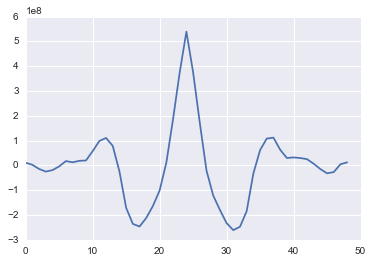

25
Bronx, NY


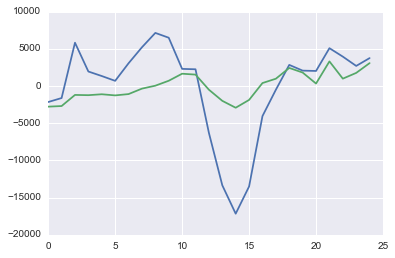

-6624424.3488


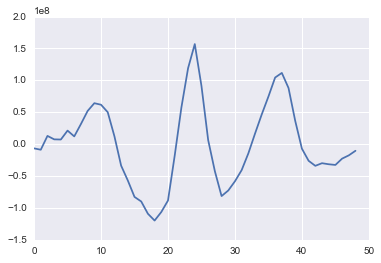

26
Palm Beach, FL


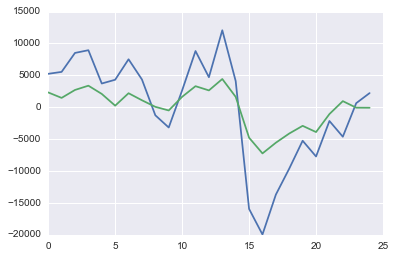

-405795.816


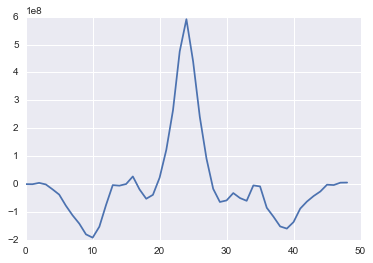

27
Nassau, NY


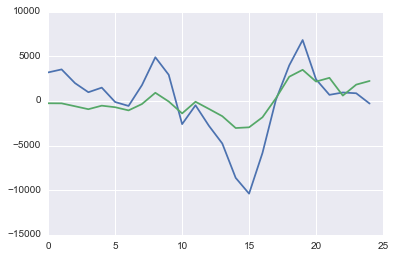

7113957.088


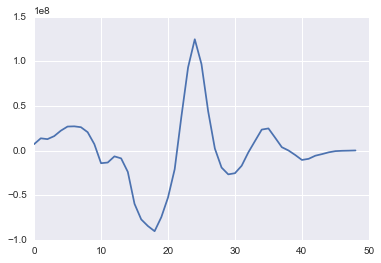

28
Hillsborough, FL


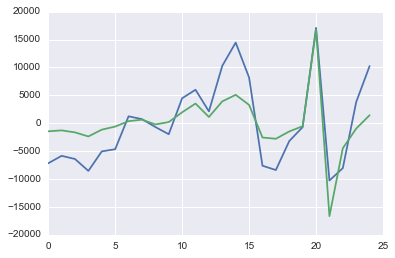

-10312029.8432


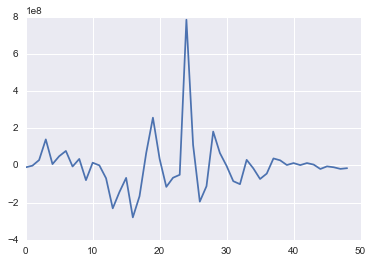

29
Cuyahoga, OH


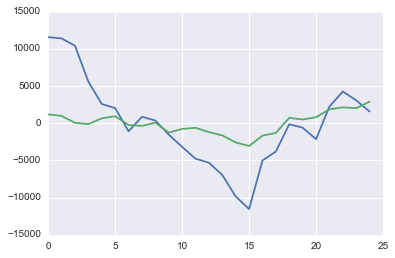

33546023.5264


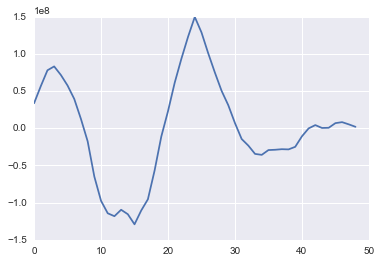

In [40]:
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
for i in range(len(topCode)):
    print i

    rank=i
    print top[rank]
    c=(a[topInd[rank]][8:-1])
    ome=diff((np.array(c, dtype=np.int)))[-25:]

    element5=topCode[rank]
    IN=[]
    for element in mig:
        if ((element[1])==element5):
            IN.append(np.array(element,dtype=np.int))

        
    OUT=[]
    for element in mig:
        if ((element[0])==element5):
            OUT.append(np.array(element,dtype=np.int))

    outs=(array(OUT, dtype=np.int)[:,2:])
    ins=(array(IN, dtype=np.int)[:,2:])
    lediff=sum(ins.T,1)-sum(outs.T,1)

    plot(ome-mean(ome))
    plot(lediff-mean(lediff))
    show()
    
    core=correlate(ome-mean(ome),lediff-mean(lediff),'full')
    plot(core)
    print core[0]
    show()


['06037', '17031', '48201', '04013', '06073', '06059', '12086', '36047', '48113', '06065', '36081', '06071', '53033', '32003', '48439', '06085', '12011', '48029', '26163', '36061', '06001', '25017', '42101', '36103', '06067', '36005', '12099', '36059', '12057', '39035', '12095', '26125', '39049', '42003', '27053', '51919', '48453', '06013', '49035', '24031', '37119', '04019', '29189', '37183', '13121', '15003', '36119', '06019', '55079', '09001', '47157', '12103', '18097', '17043', '34003', '36029', '24033', '12031', '09003', '48085', '13135', '06029', '26099', '09009', '06075', '06111', '34023', '48141', '48215', '53053', '24005', '42091', '25027', '39061', '34013', '41051', '25009', '25025', '40109', '21111', '53061', '06081', '48121', '36055', '13067', '13089', '06077', '17097', '25021', '48157', '17197', '29095', '12071', '35001', '34017', '47037', '08031', '08041', '01073', '11001']
[229, 634, 2647, 128, 247, 240, 387, 1875, 2603, 243, 1892, 246, 2965, 1772, 2766, 253, 350, 2561, 

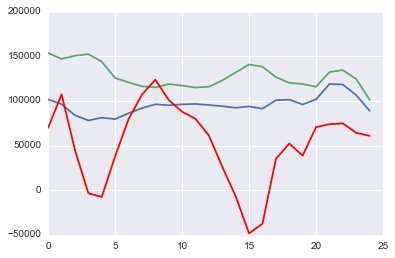

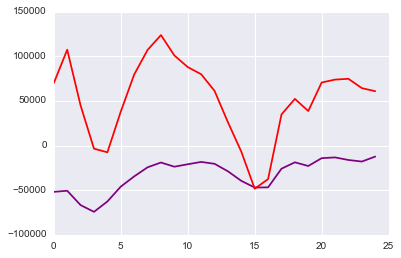

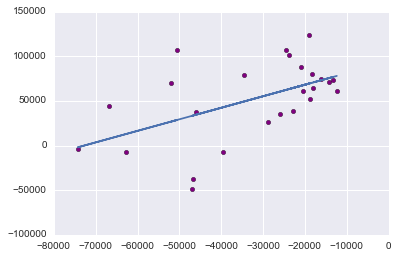

(1.2923658105774978, 93968.300865620651, 0.52446811871361854)
1
Cook, IL


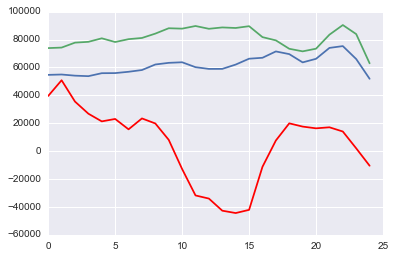

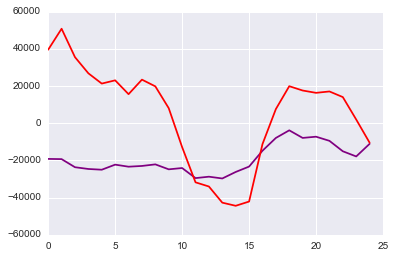

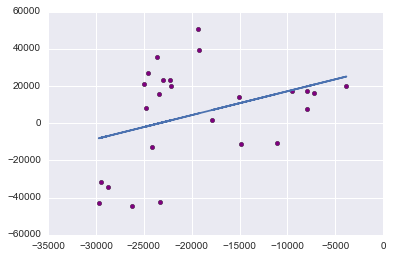

(1.2830642058936901, 30002.5326031855, 0.36358881530668741)
2
Harris, TX


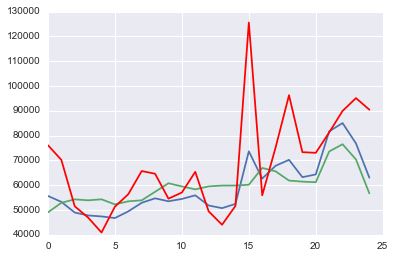

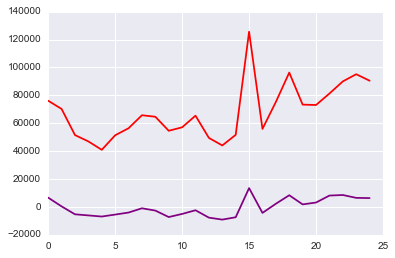

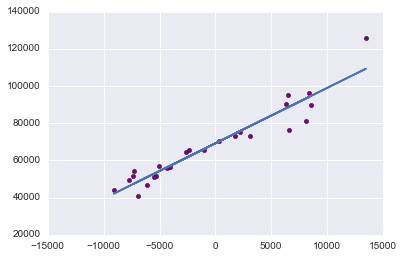

(2.9736501606320092, 69184.647397453111, 0.95348759613394685)
3
Maricopa, AZ


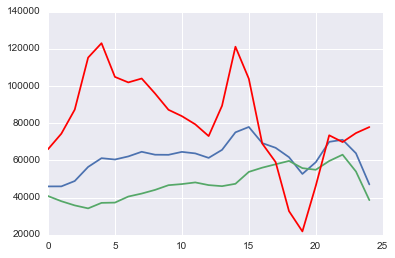

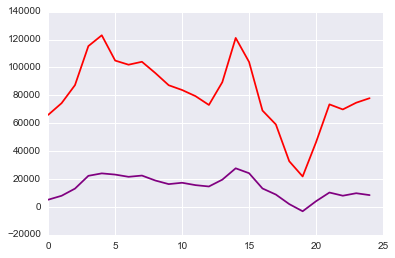

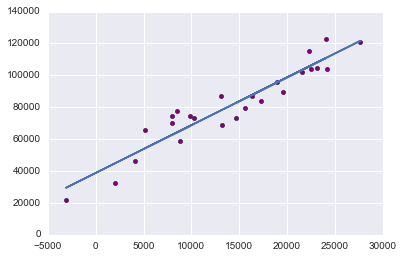

(2.9957730451344511, 38827.667805422687, 0.94729257334833061)
4
San Diego, CA


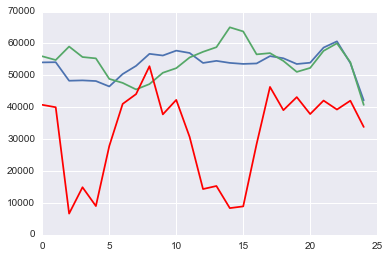

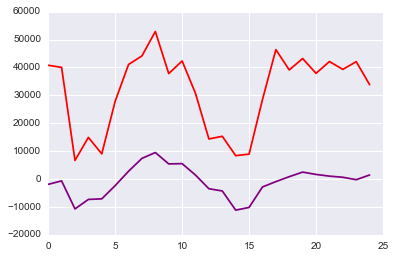

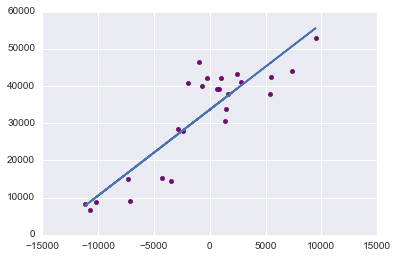

(2.3099935193471022, 33637.952763401438, 0.88436441569918955)
5
Orange, CA


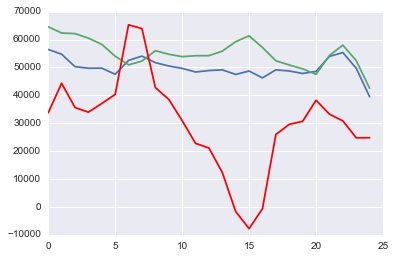

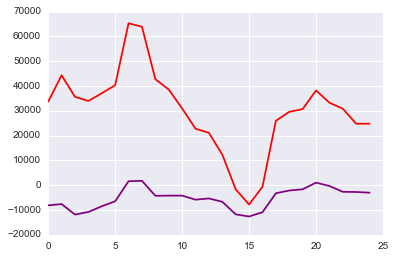

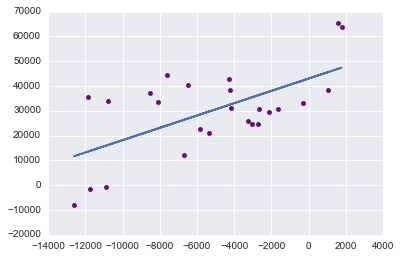

(2.4837434259830671, 43003.695165224359, 0.62086592394768758)
6
Miami-Dade, FL


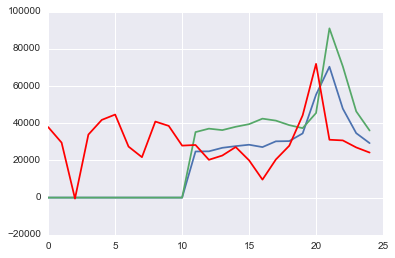

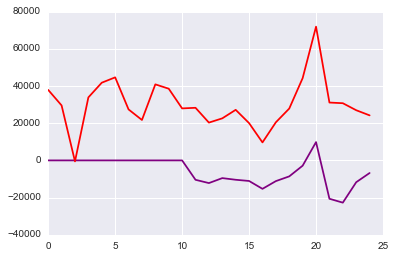

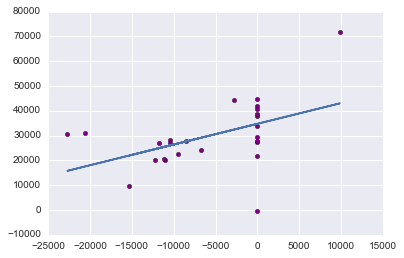

(0.83602412982117413, 34773.073015948707, 0.47415212554731873)
7
Kings, NY


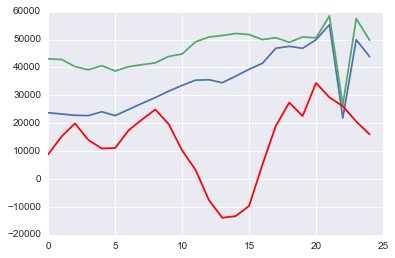

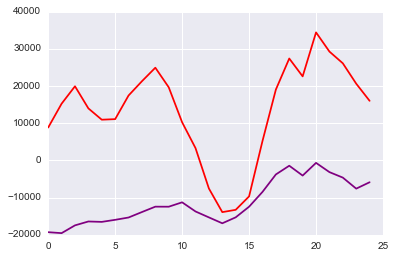

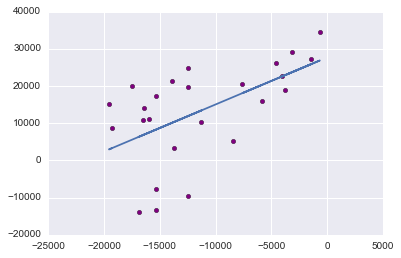

(1.2652695042621522, 27694.436298913788, 0.56274363061413402)
8
Dallas, TX


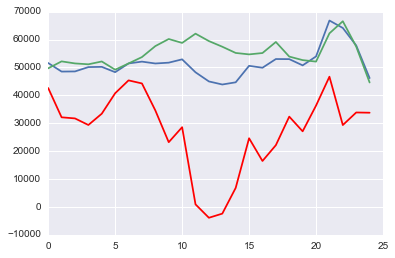

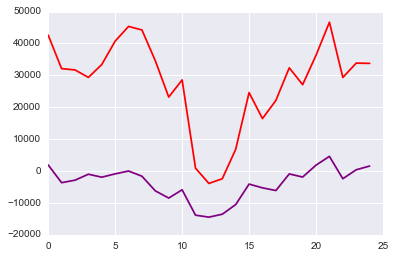

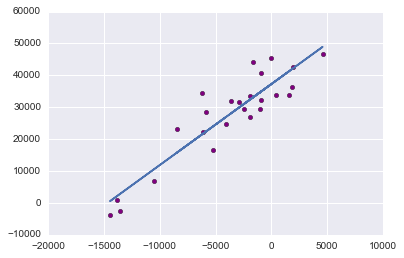

(2.5402810812399927, 37281.582376389837, 0.91276431534417868)
9
Riverside, CA


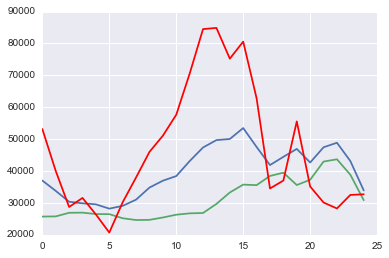

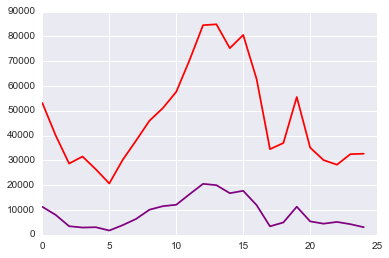

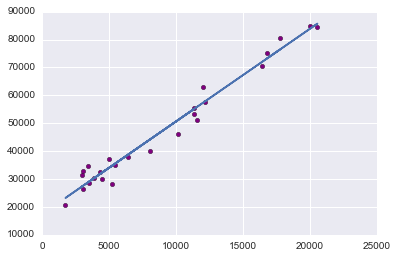

(3.3212504580102498, 17475.308067787686, 0.98561076298355121)
10
Queens, NY


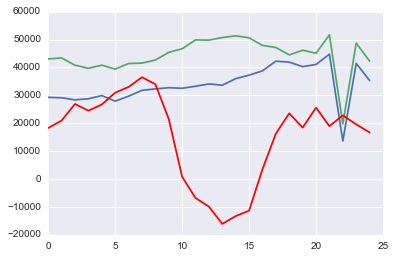

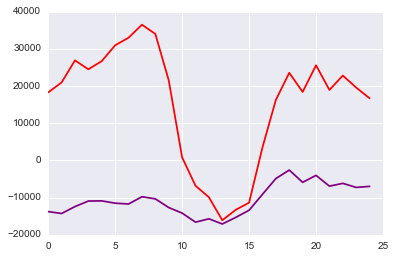

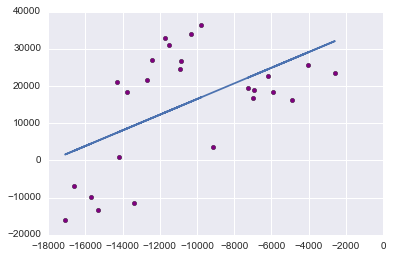

(2.1022429359752177, 37511.192610419144, 0.54275252924771999)
11
San Bernardino, CA


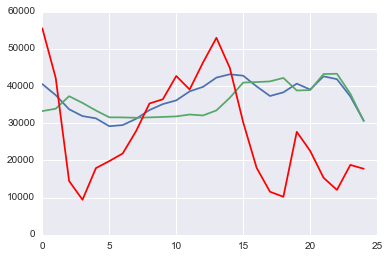

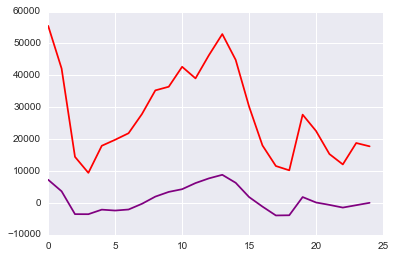

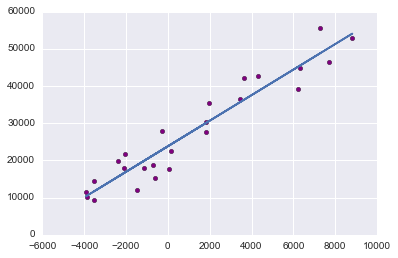

(3.4356221932332294, 23802.00125454495, 0.95650534099767337)
12
King, WA


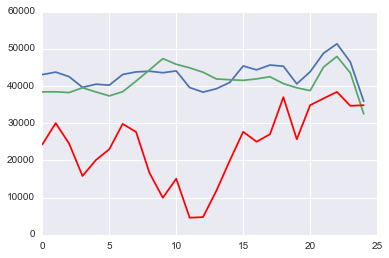

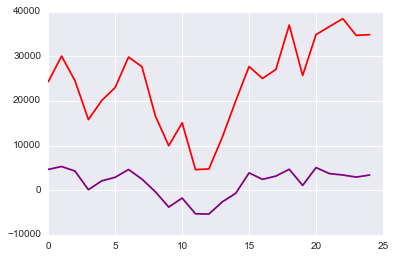

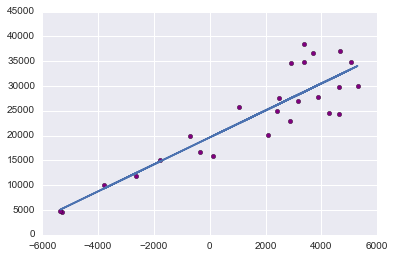

(2.7174534210789227, 19634.406372210426, 0.89174743787039112)
13
Clark, NV


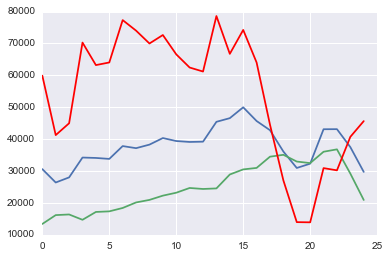

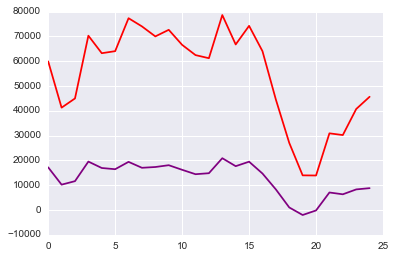

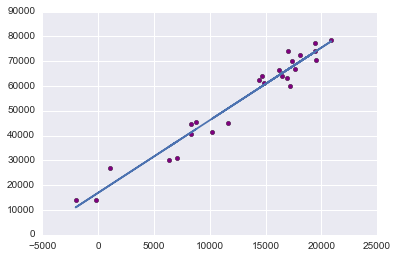

(2.9257713585445857, 16936.795533066295, 0.97685995938634773)
14
Tarrant, TX


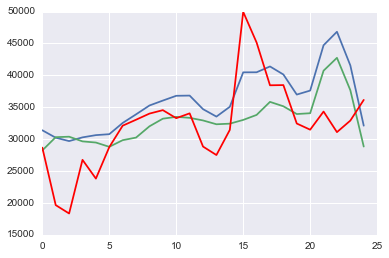

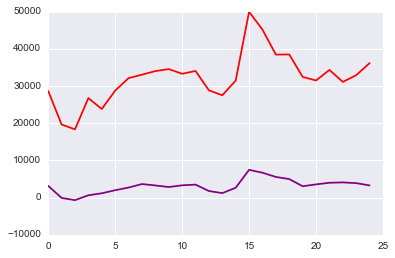

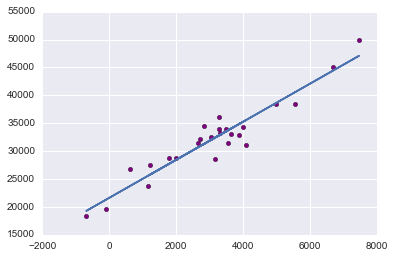

(3.4114266033757006, 21629.284047520981, 0.9515013148507655)
15
Santa Clara, CA


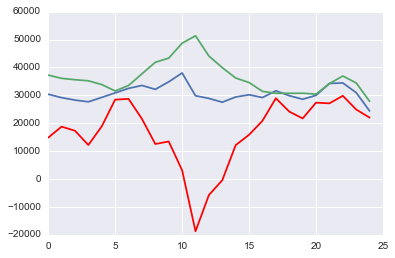

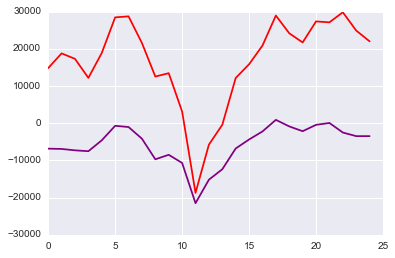

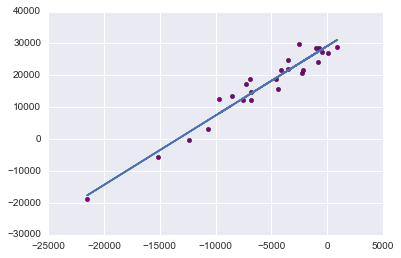

(2.1768725530916262, 29187.204564367428, 0.96992626545531424)
16
Broward, FL


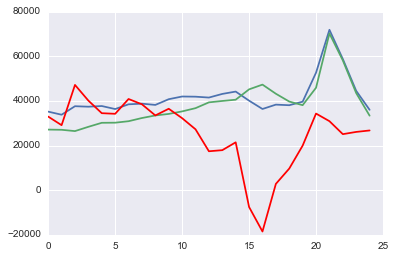

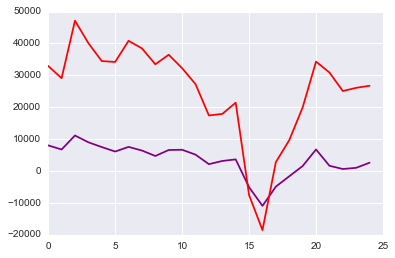

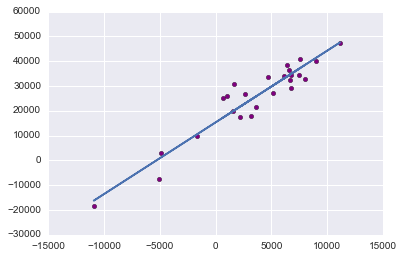

(2.891177890831738, 15333.164856401145, 0.94898577722687616)
17
Bexar, TX


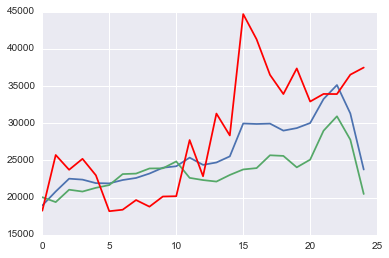

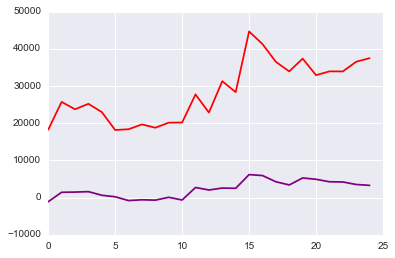

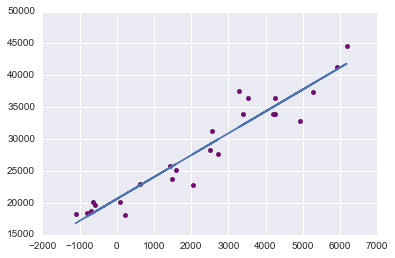

(3.4333451783400353, 20614.902477860338, 0.95448841381458016)
18
Wayne, MI


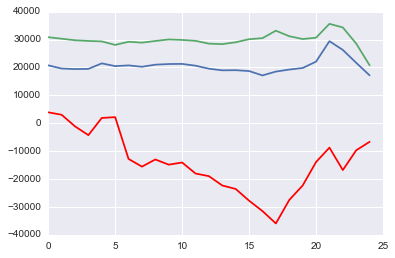

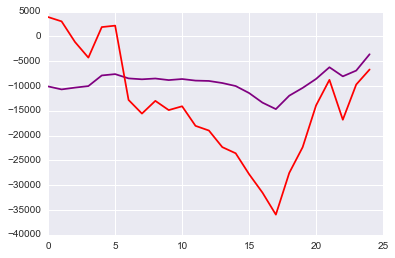

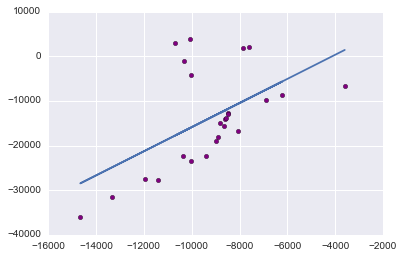

(2.7028031673702397, 11139.894514462772, 0.54709418085346073)
19
New York, NY


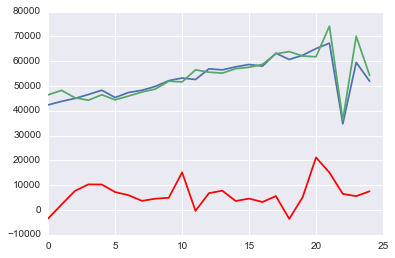

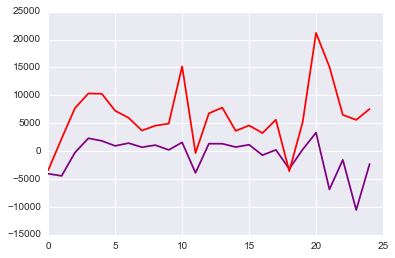

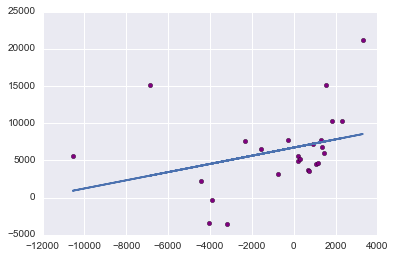

(0.54973889806429588, 6726.5963404901513, 0.32466304375420224)
20
Alameda, CA


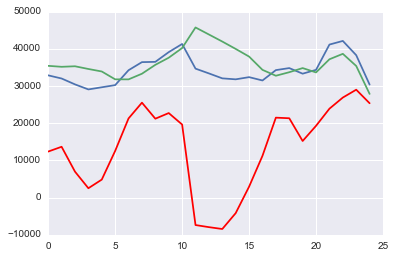

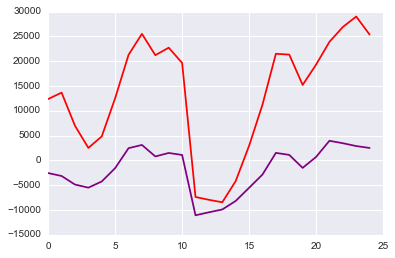

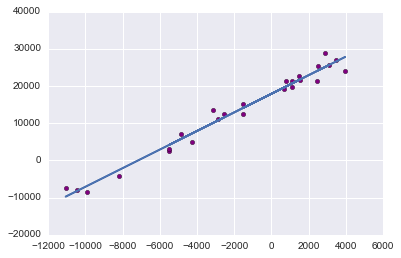

(2.4992728825167023, 17904.215239841687, 0.98705658858444667)
21
Middlesex, MA


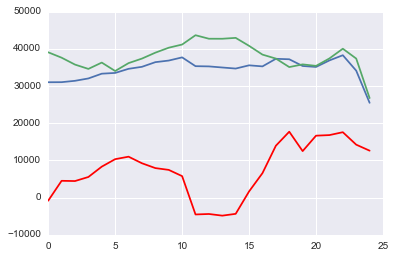

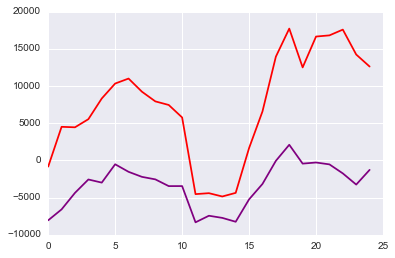

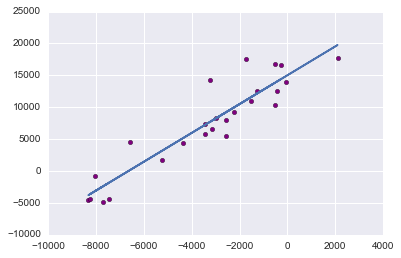

(2.2589851139574559, 15013.671167204755, 0.92472136600450028)
22
Philadelphia, PA


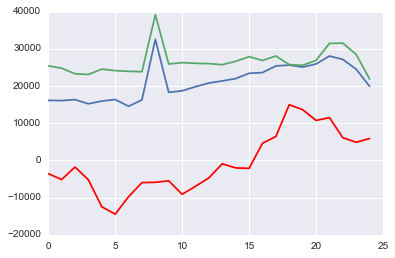

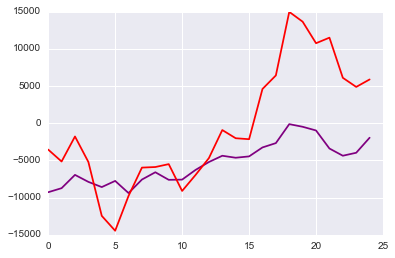

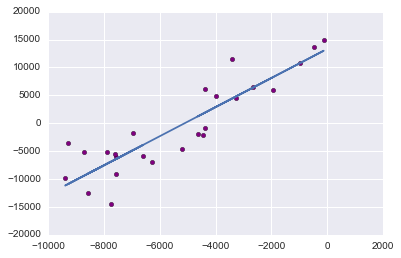

(2.6076275269554245, 13316.716122924478, 0.89465779053786376)
23
Suffolk, NY


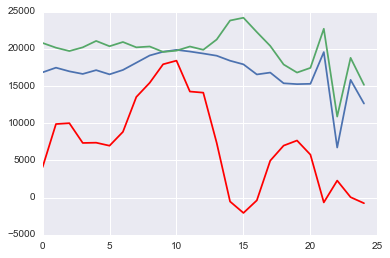

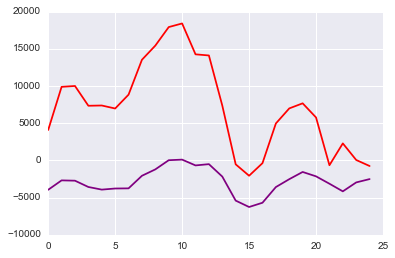

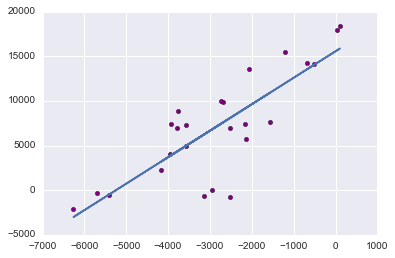

(2.964970874034329, 15555.446689634369, 0.81417244490551499)
24
Sacramento, CA


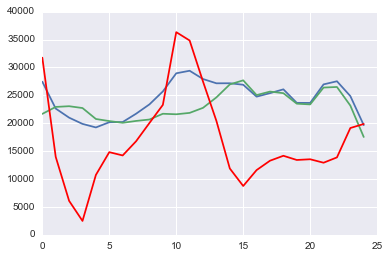

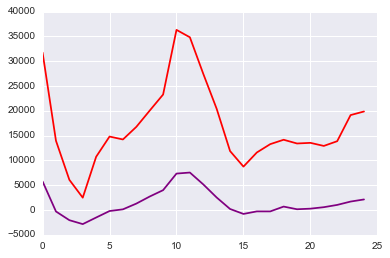

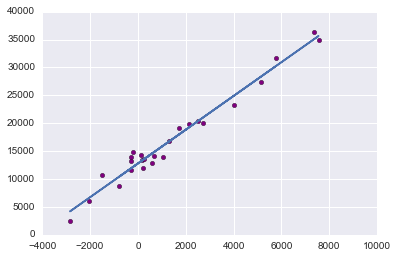

(3.0244156435026173, 12792.506930383341, 0.98589942559249044)
25
Bronx, NY


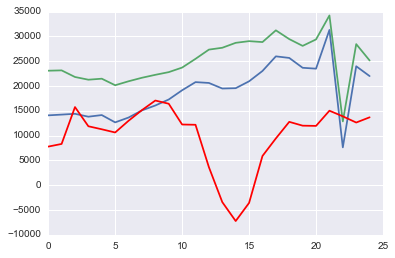

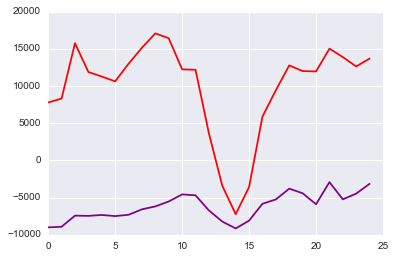

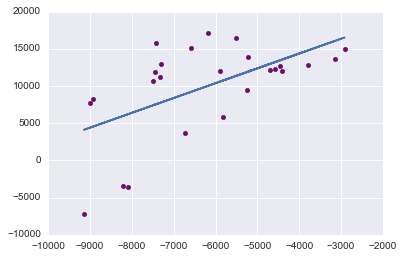

(1.9929391633276754, 22339.533917418383, 0.56559840188986421)
26
Palm Beach, FL


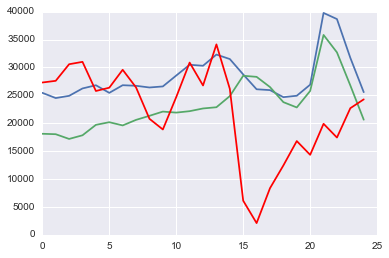

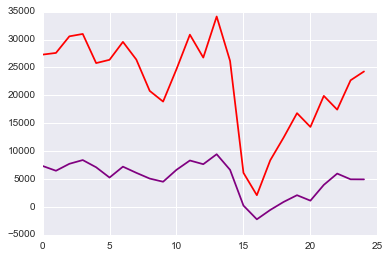

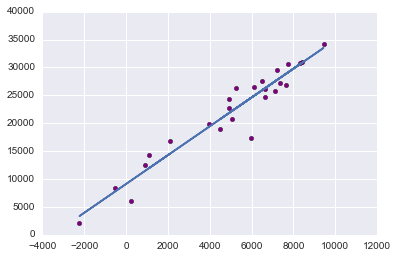

(2.5832882472396443, 9105.8525660304877, 0.96138076853820598)
27
Nassau, NY


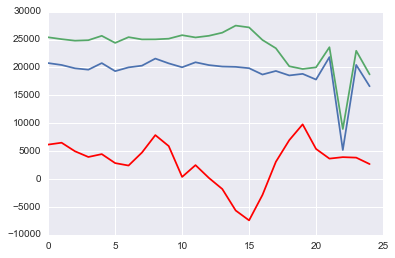

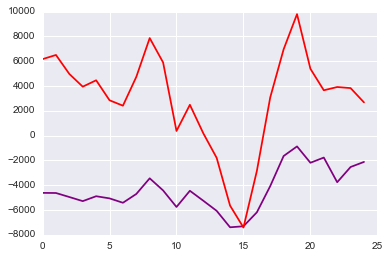

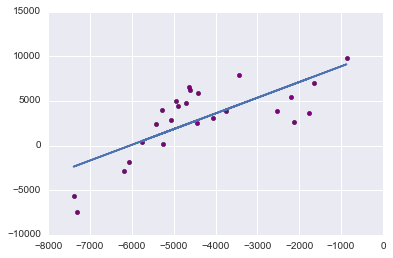

(1.7582085482812086, 10630.64885559072, 0.74967460504658712)
28
Hillsborough, FL


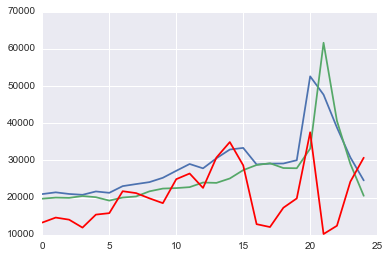

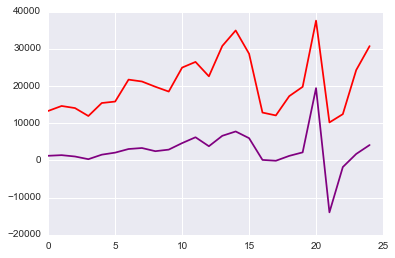

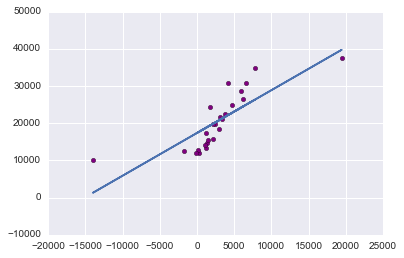

(1.1495882369835382, 17380.026673090084, 0.79720069556485251)
29
Cuyahoga, OH


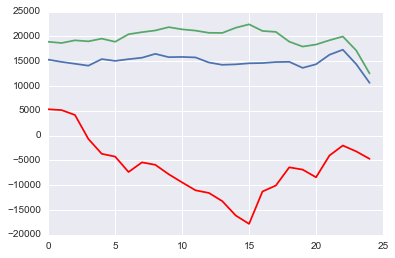

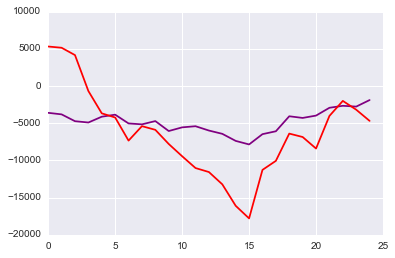

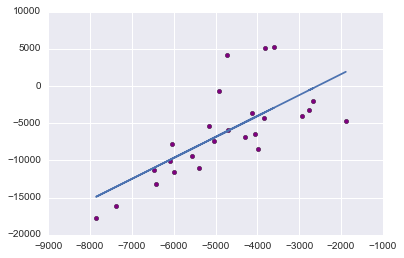

(2.81535757667235, 7226.4188063206857, 0.70892929284743877)
30
Orange, FL


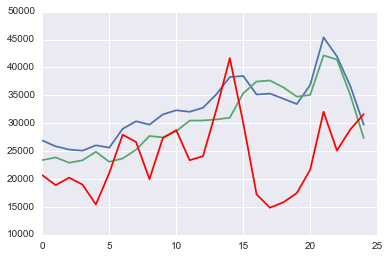

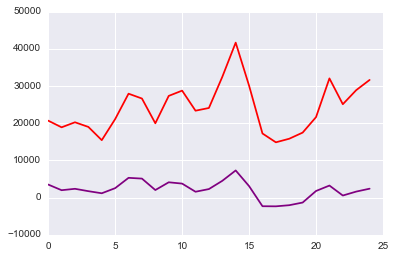

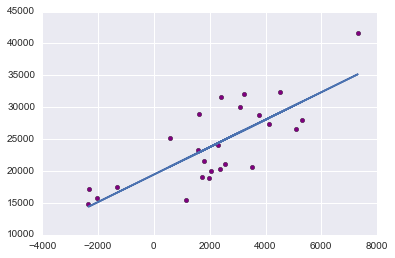

(2.1517699051081118, 19450.800544776695, 0.7765506113656272)
31
Oakland, MI


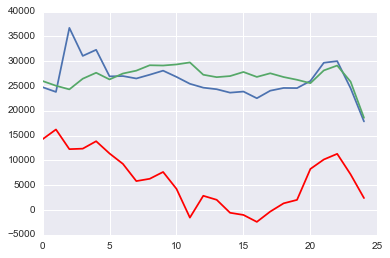

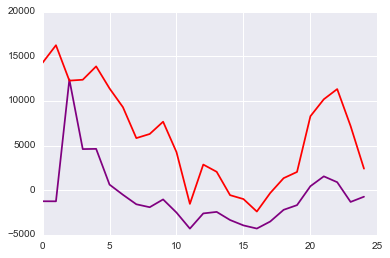

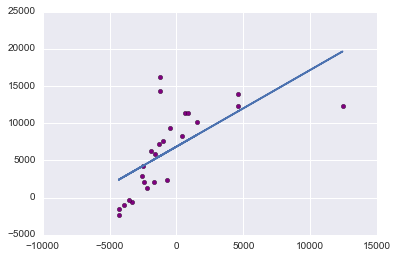

(1.0314550545640615, 6855.8042023822927, 0.66075969060159923)
32
Franklin, OH


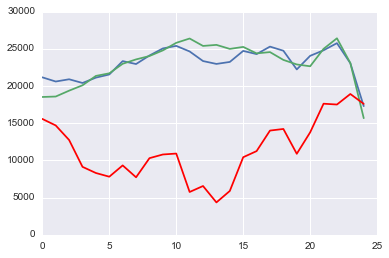

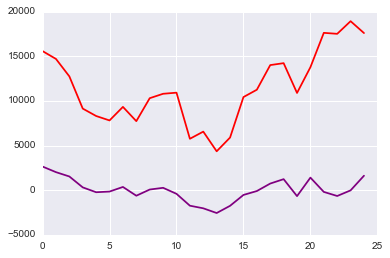

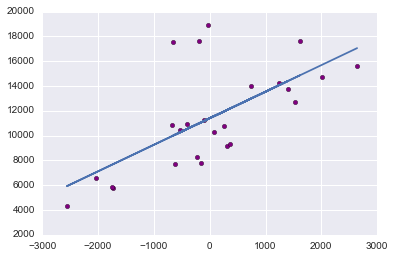

(2.1402568849465293, 11401.818031474875, 0.66373100533536633)
33
Allegheny, PA


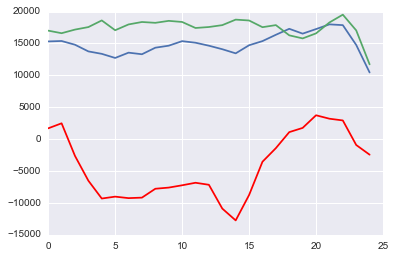

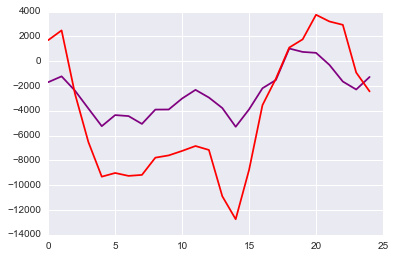

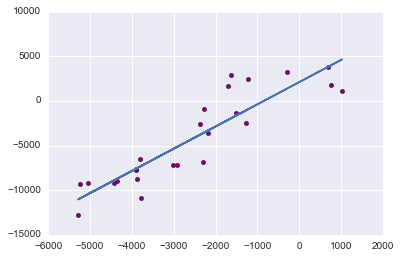

(2.4867305940896345, 2105.4402138356872, 0.89812201668739056)
34
Hennepin, MN


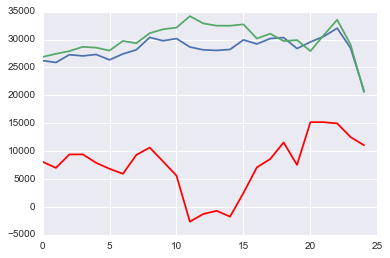

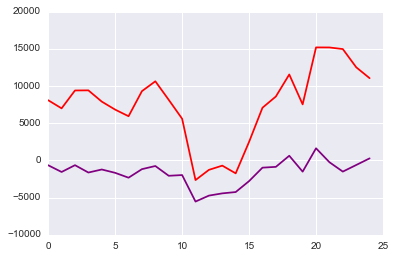

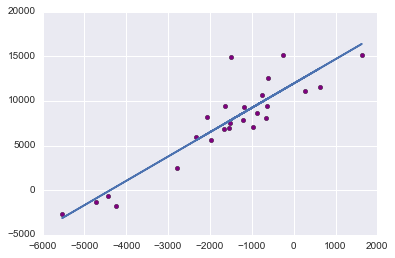

(2.7249359818832093, 11945.10405506413, 0.90679512886695612)
35
Fairfax, Fairfax City + Falls Church, VA*


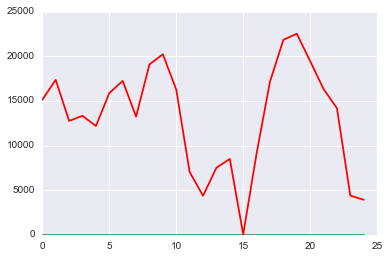

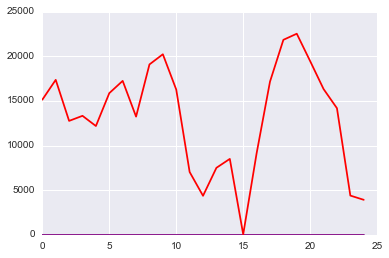

/Users/Felipe/anaconda/lib/python2.7/site-packages/scipy/stats/_stats_mstats_common.py:106: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/Users/Felipe/anaconda/lib/python2.7/site-packages/scipy/stats/_stats_mstats_common.py:118: RuntimeWarning: divide by zero encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)


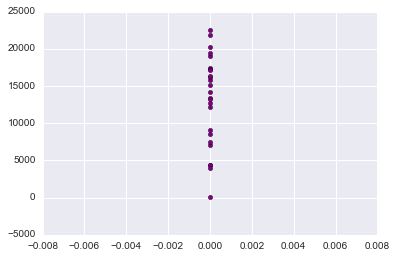

(nan, nan, 0.0)
36
Travis, TX


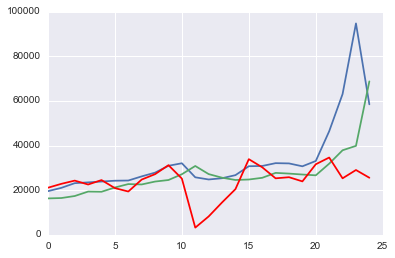

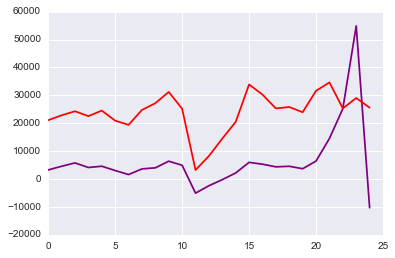

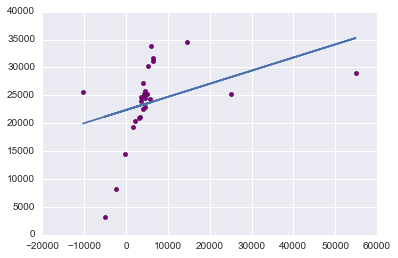

(0.23520947380663504, 22364.604236547035, 0.39102711025713793)
37
Contra Costa, CA


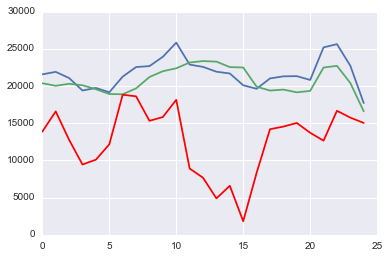

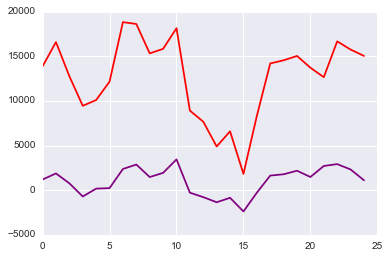

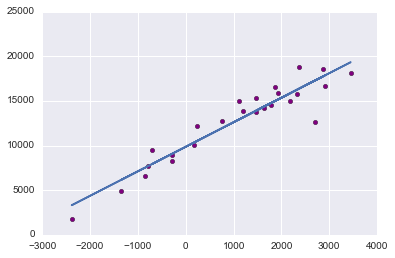

(2.7464964432088581, 9864.4934283321127, 0.94177013011191169)
38
Salt Lake, UT


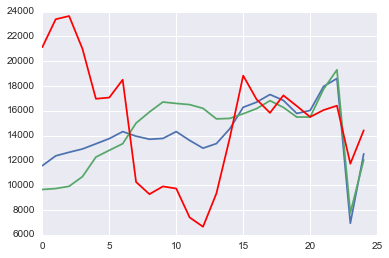

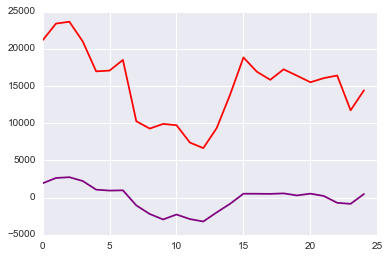

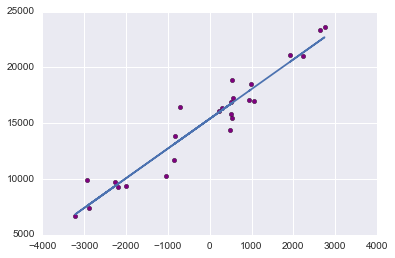

(2.6632813734820693, 15393.529545005902, 0.96346255114179091)
39
Montgomery, MD


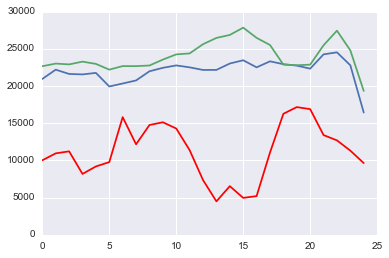

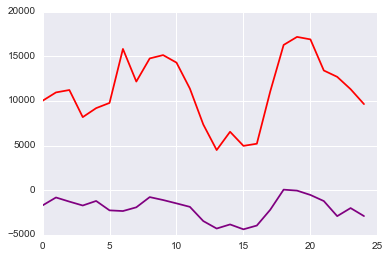

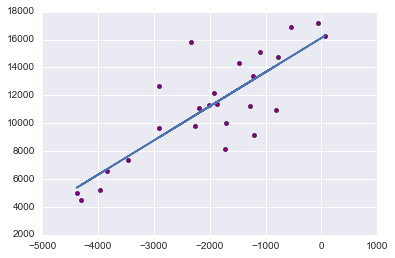

(2.4484862213858176, 16109.752090338143, 0.8263464305147844)
40
Mecklenburg, NC


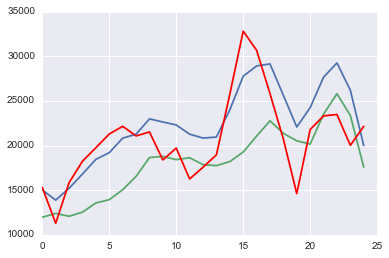

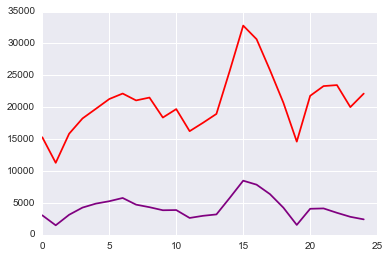

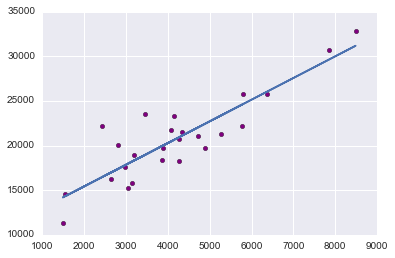

(2.4284617104460278, 10565.968171878423, 0.87829880129508975)
41
Pima, AZ


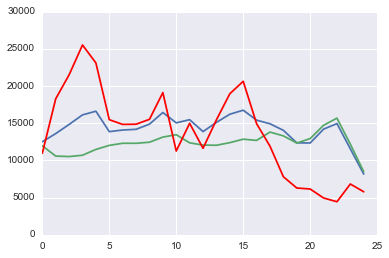

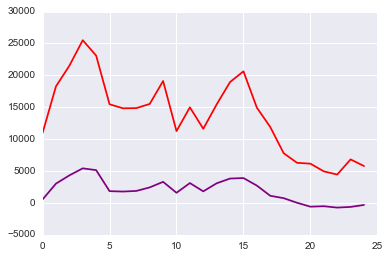

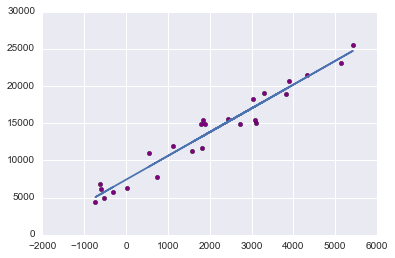

(3.1939204498311513, 7410.4076592057136, 0.97527409703067269)
42
St. Louis, MO


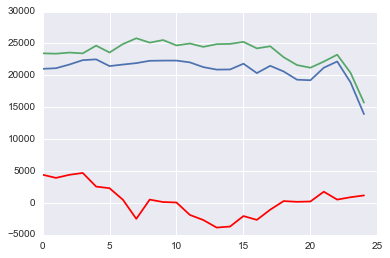

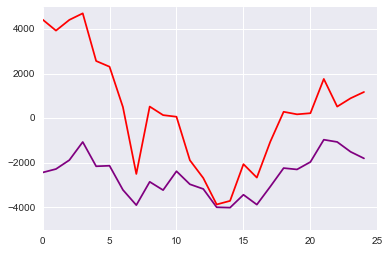

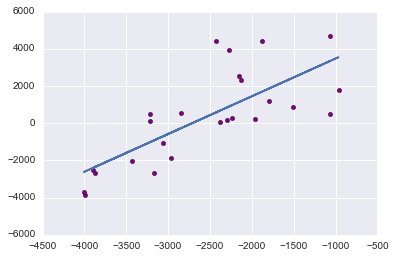

(2.0290800754061196, 5505.6651476695961, 0.74697088243847454)
43
Wake, NC


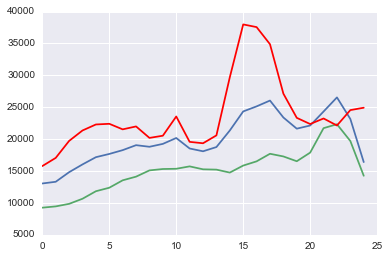

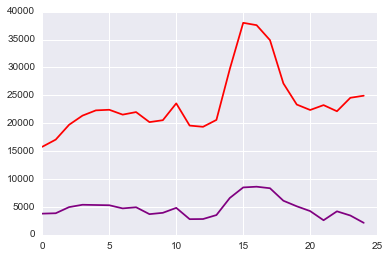

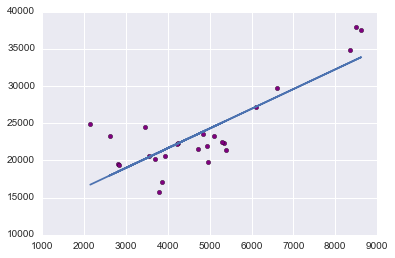

(2.6467945243395579, 11060.679153325005, 0.81540852694297727)
44
Fulton, GA


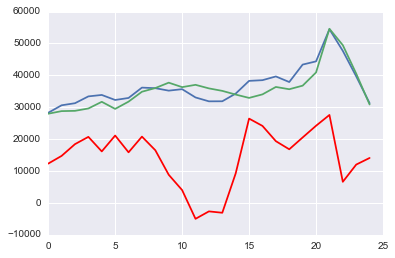

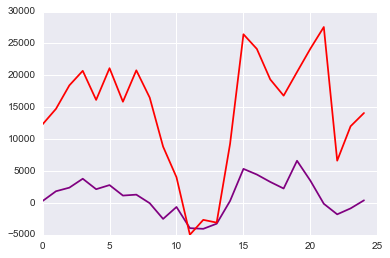

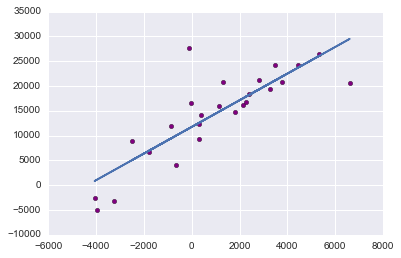

(2.6857865093449393, 11751.356348963085, 0.83767816786615013)
45
Honolulu, HI


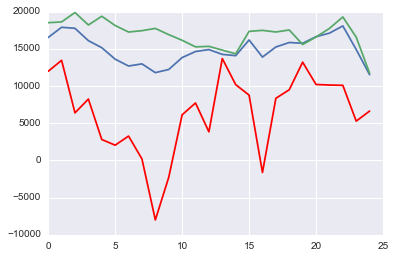

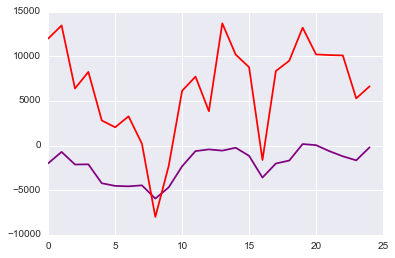

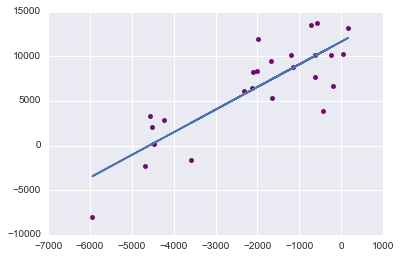

(2.5350772209740846, 11628.039431962869, 0.83746956509704329)
46
Westchester, NY


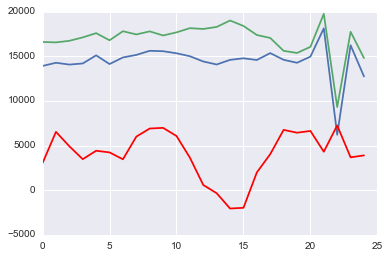

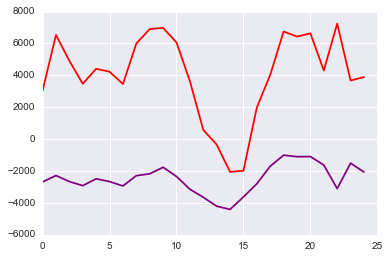

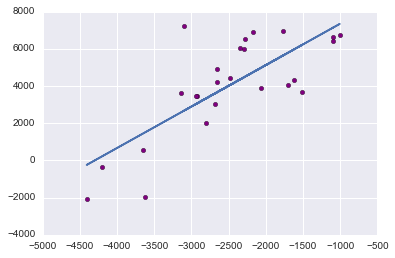

(2.2285118097798571, 9579.3967540696722, 0.75753001782836271)
47
Fresno, CA


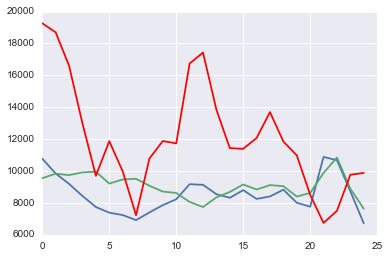

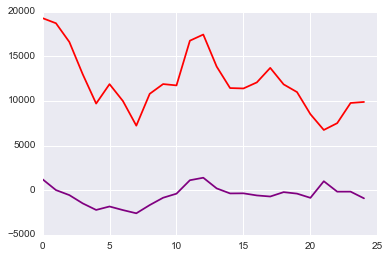

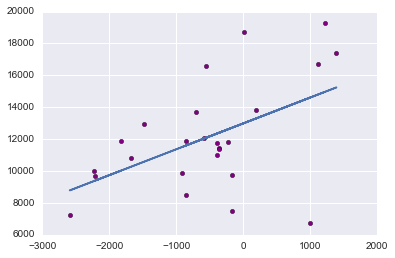

(1.6223360956190223, 12986.533172112368, 0.50447036858037975)
48
Milwaukee, WI


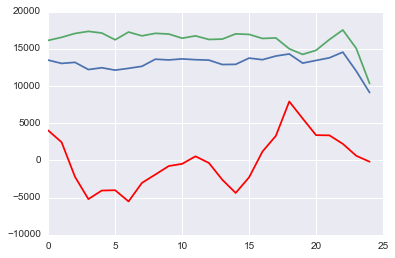

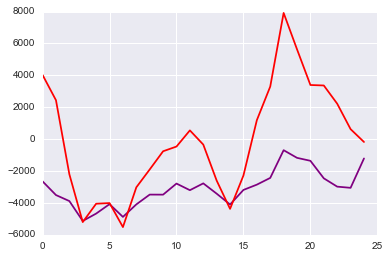

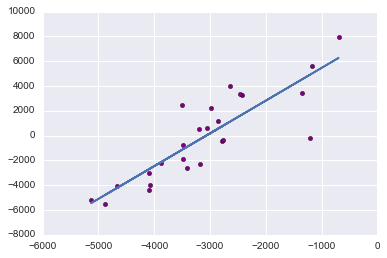

(2.6411113009535367, 8100.9661442569177, 0.85807023520807824)
49
Fairfield, CT


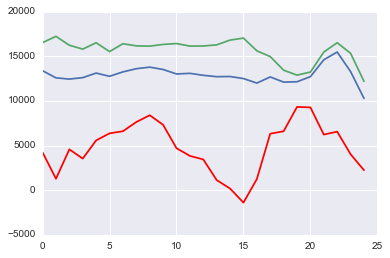

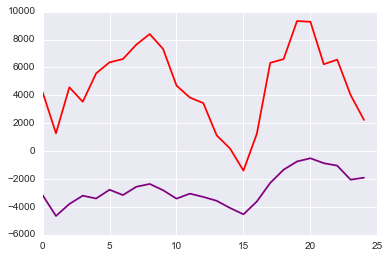

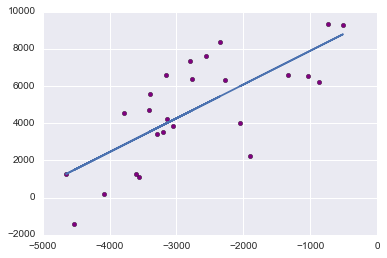

(1.816524326744714, 9714.9876734026948, 0.73494254892565603)
50
Shelby, TN


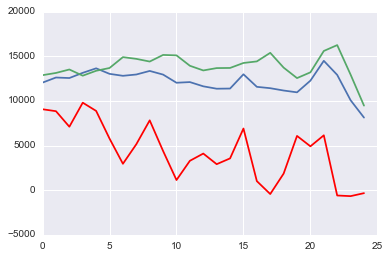

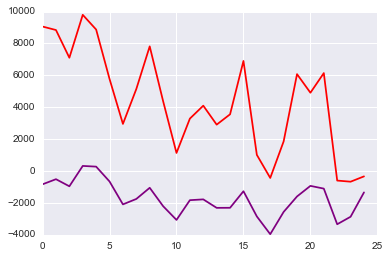

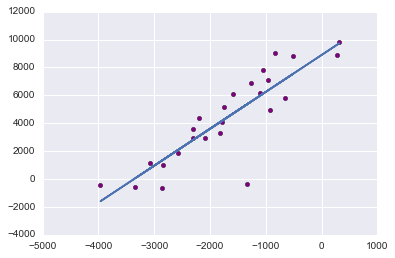

(2.6458879083765727, 8889.5970817692832, 0.87140881055629349)
51
Pinellas, FL


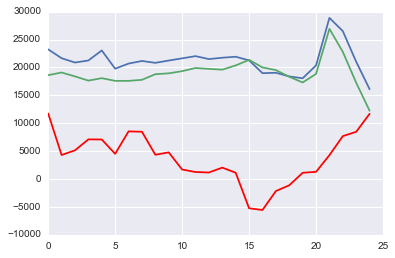

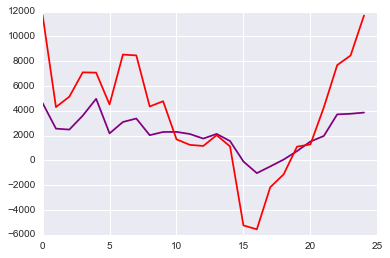

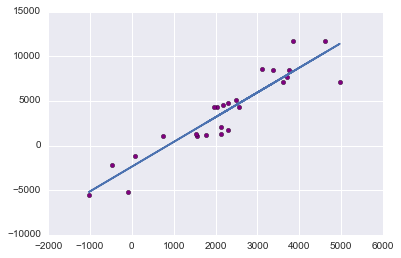

(2.7697243721860807, -2362.4640752936189, 0.9254617130640731)
52
Marion, IN


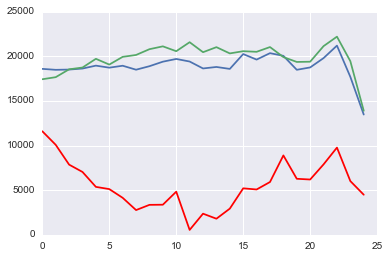

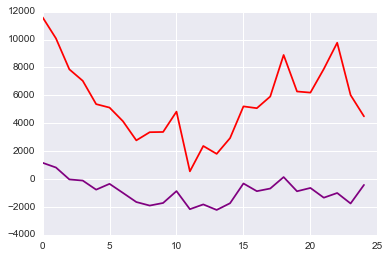

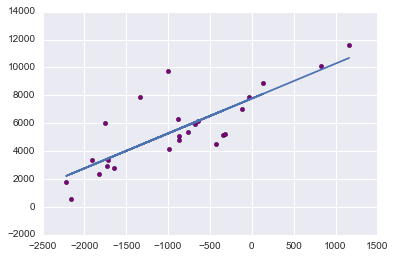

(2.502144625893755, 7770.0783370561157, 0.81242527511921225)
53
DuPage, IL


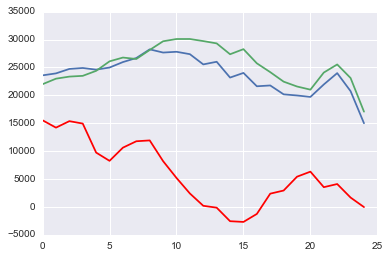

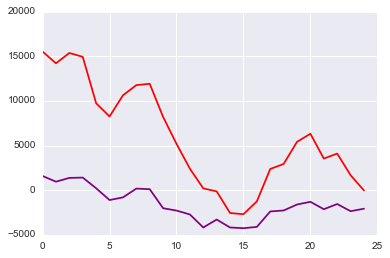

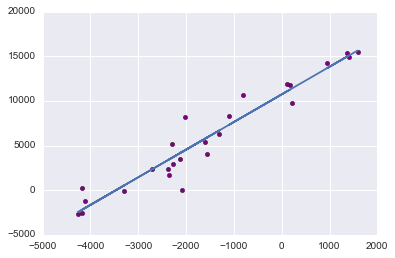

(3.095571122591211, 10729.113701661838, 0.96146260657288307)
54
Bergen, NJ


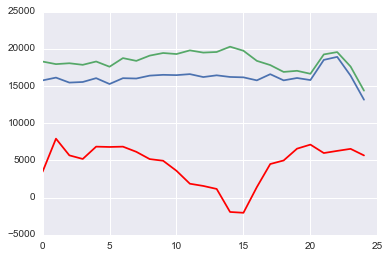

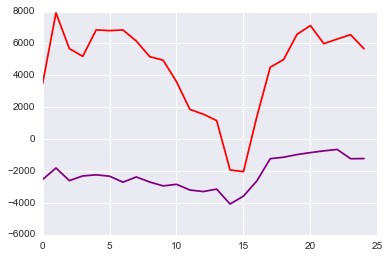

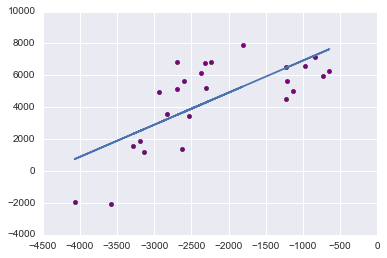

(2.0144405957529274, 8944.2540774037443, 0.7150725219438373)
55
Erie, NY


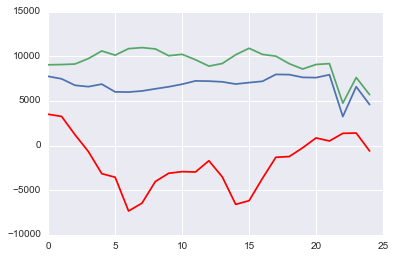

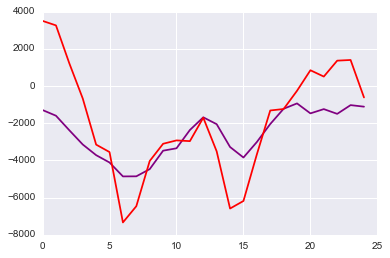

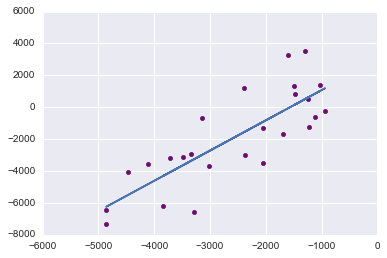

(1.8957271699030398, 2969.3038128991611, 0.80524789797368868)
56
Prince George's, MD


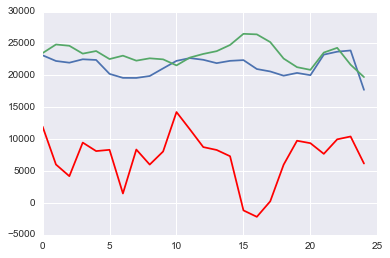

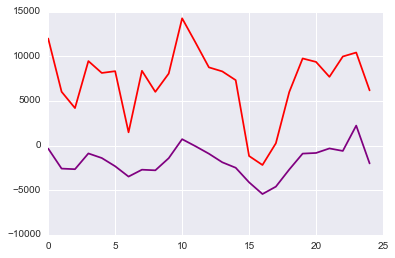

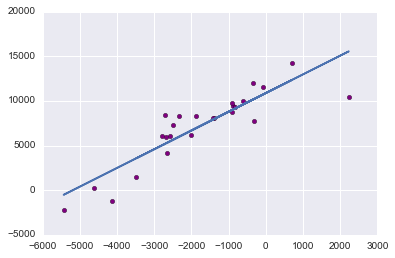

(2.0964369500136182, 10871.443348150249, 0.88428319995593374)
57
Duval, FL


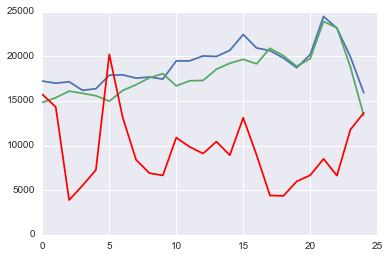

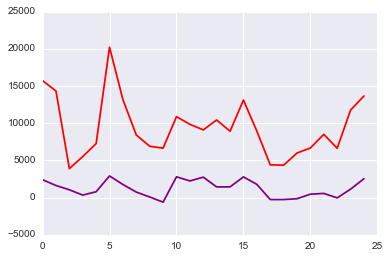

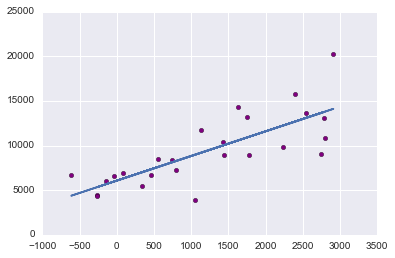

(2.7618831976427116, 6065.3670710151473, 0.7748744557778422)
58
Hartford, CT


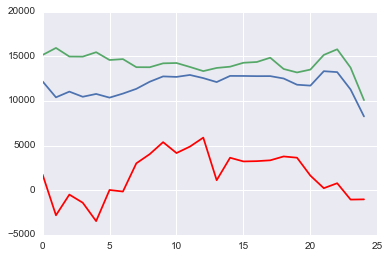

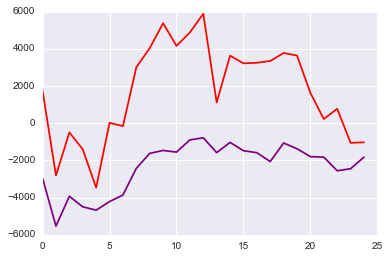

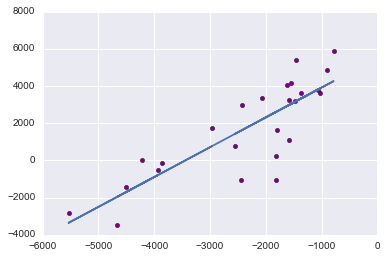

(1.6039917893760443, 5519.7810855209409, 0.82779558161559552)
59
Collin, TX


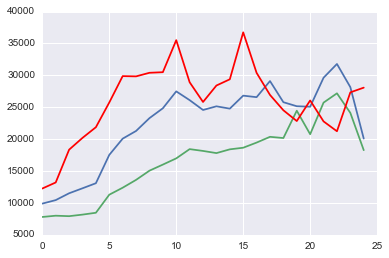

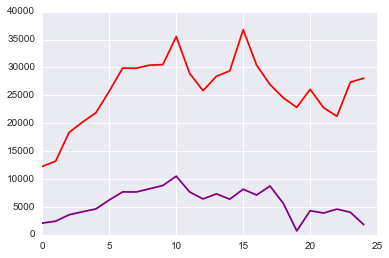

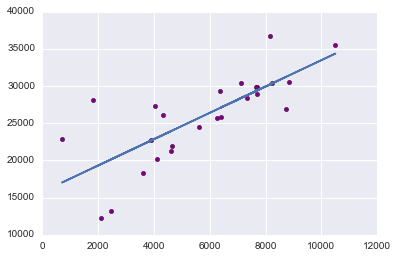

(1.7692924353002832, 15775.512060598634, 0.75822005968222383)
60
Gwinnett, GA


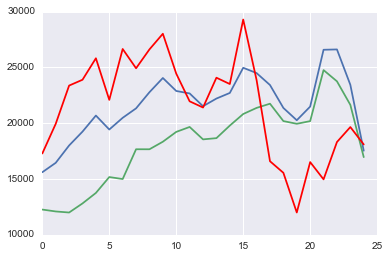

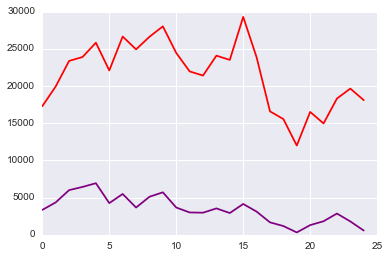

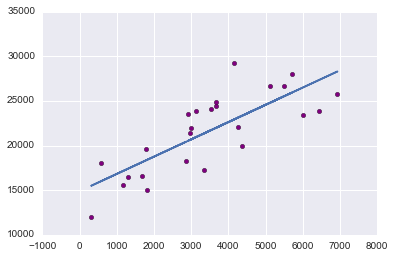

(1.9343091891592721, 14883.952426308562, 0.78323209386086901)
61
Kern, CA


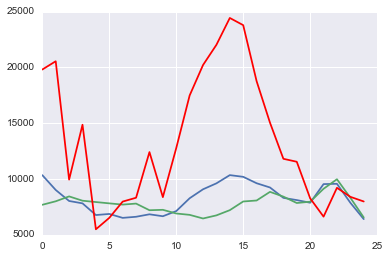

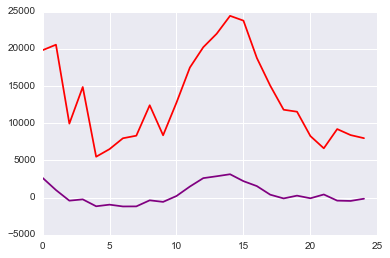

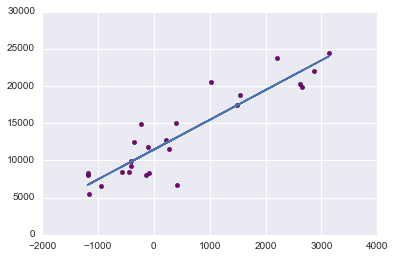

(3.9967682348857205, 11459.612687670982, 0.90908609425863396)
62
Macomb, MI


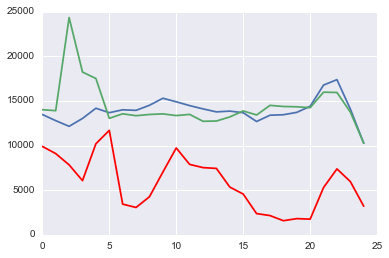

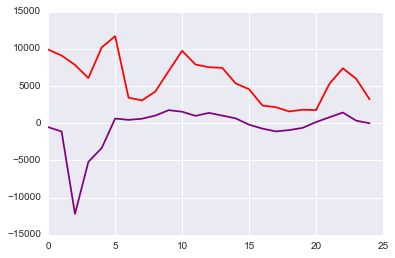

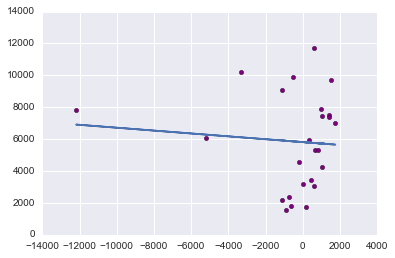

(-0.090292760713059264, 5814.8084916833604, -0.086902832745934452)
63
New Haven, CT


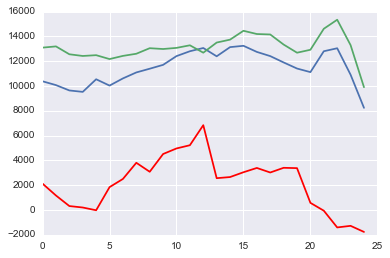

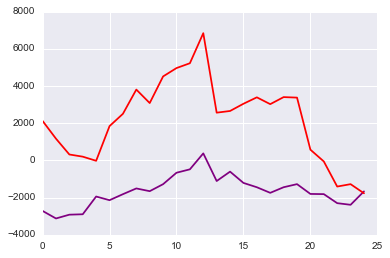

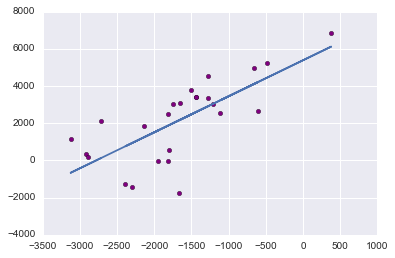

(1.9368862057815941, 5383.2648740090099, 0.72720985940711935)
64
San Francisco, CA


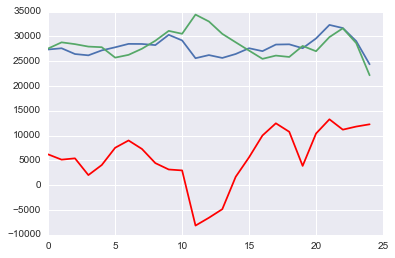

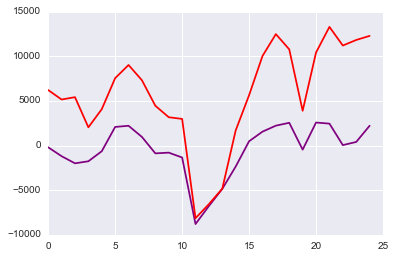

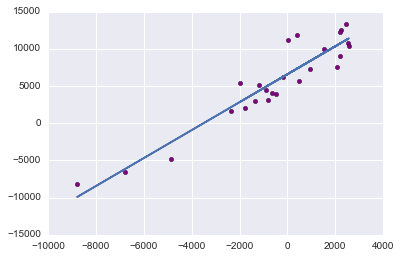

(1.876606313664384, 6576.840948848343, 0.93823223232073072)
65
Ventura, CA


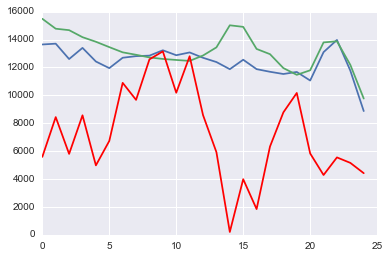

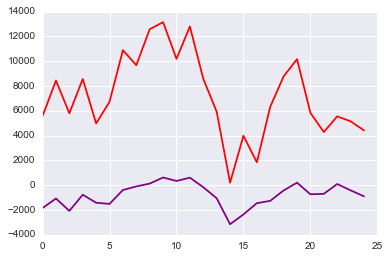

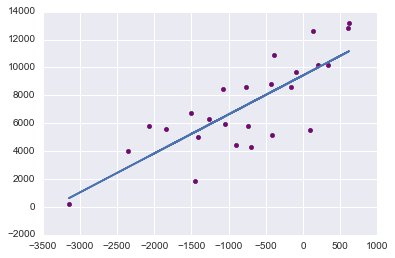

(2.7980307698999027, 9427.9877568364955, 0.79801840087614251)
66
Middlesex, NJ


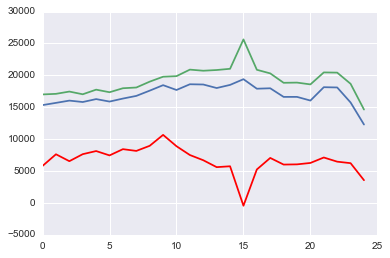

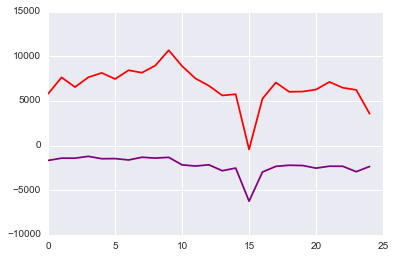

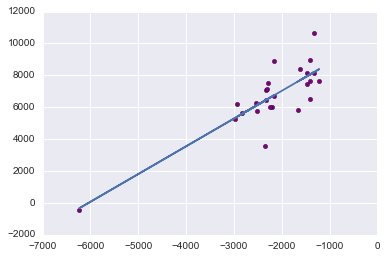

(1.7396828027146369, 10507.702036441924, 0.84141210953380352)
67
El Paso, TX


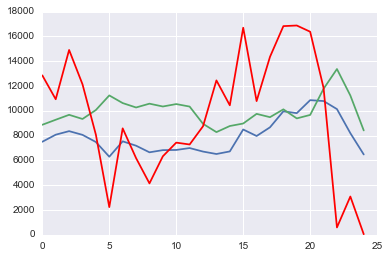

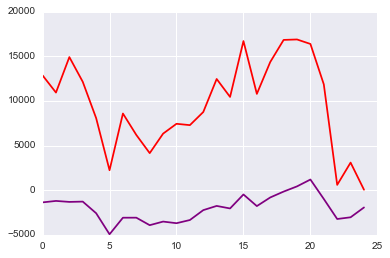

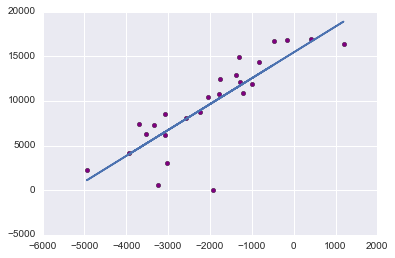

(2.8977666929563339, 15431.449196816993, 0.82989588920099566)
68
Hidalgo, TX


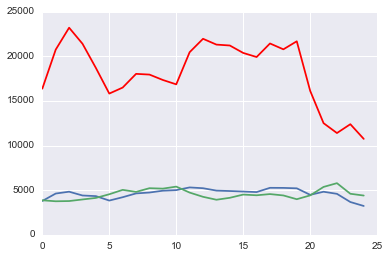

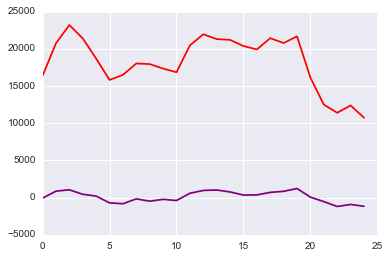

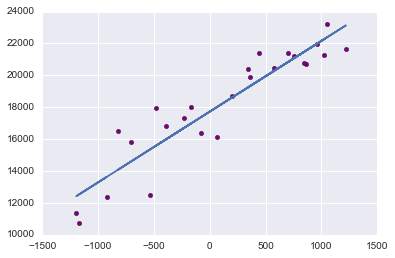

(4.4345836616558634, 17724.870197848235, 0.92556282453071725)
69
Pierce, WA


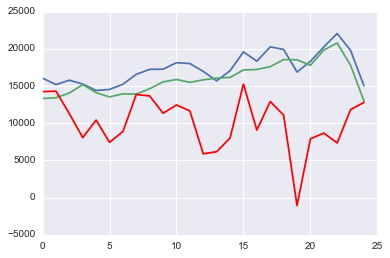

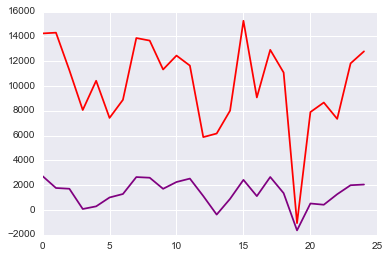

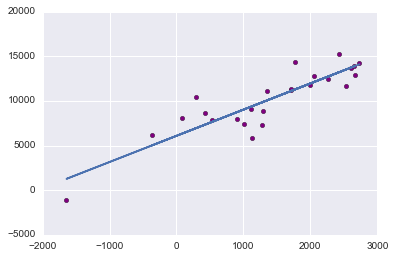

(2.9341018938768921, 6087.1657456923376, 0.88728991683811564)
70
Baltimore, MD


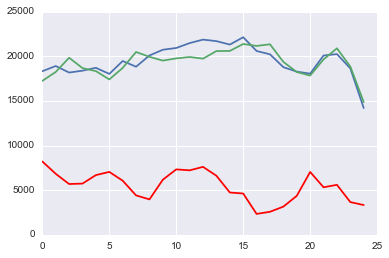

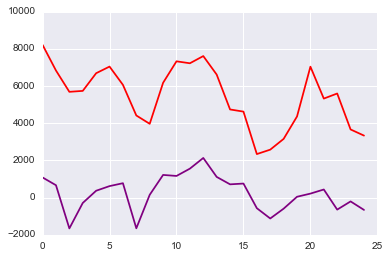

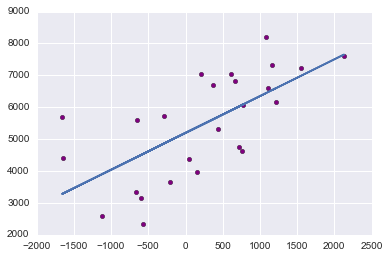

(1.1539728694841973, 5194.9346470025257, 0.66813110099568729)
71
Montgomery, PA


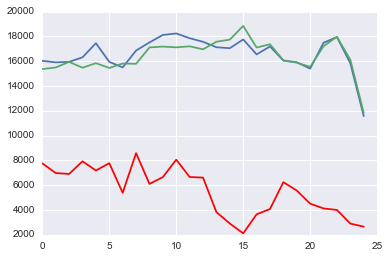

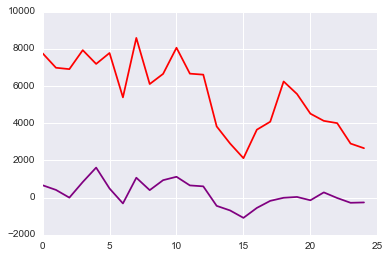

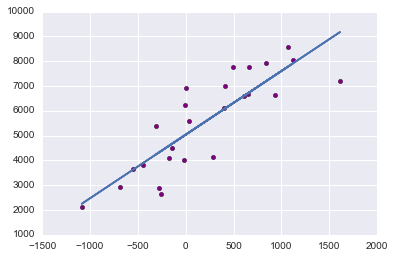

(2.5647010691343213, 5041.0278123570451, 0.84796962803191533)
72
Worcester, MA


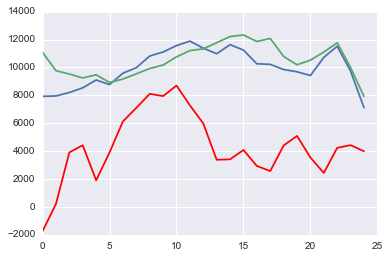

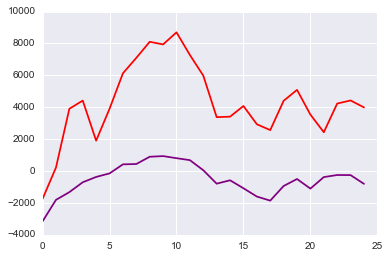

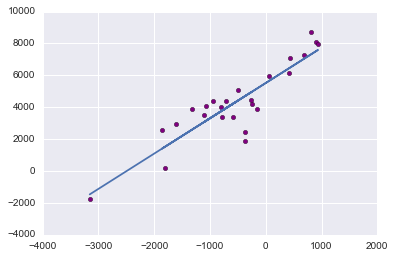

(2.2148723719778536, 5522.763653541866, 0.89584027570327018)
73
Hamilton, OH


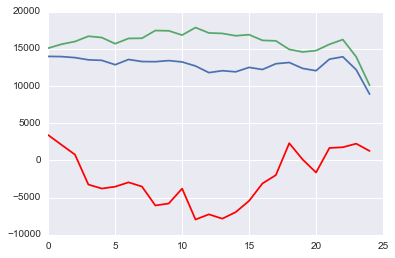

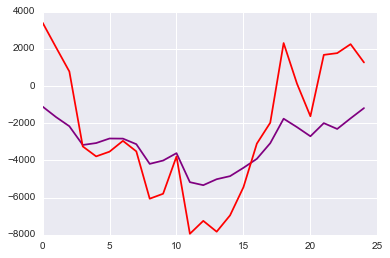

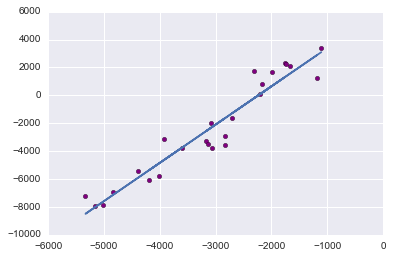

(2.7417620952936037, 6124.9998452537966, 0.95856620319384855)
74
Essex, NJ


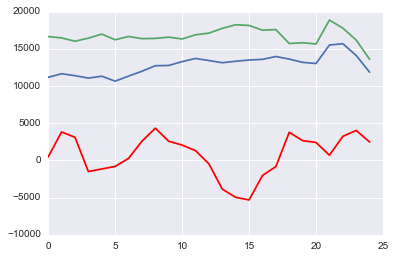

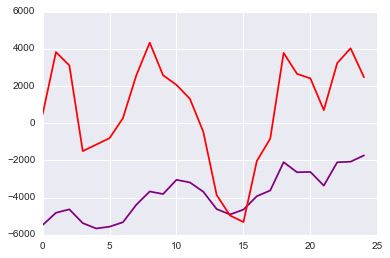

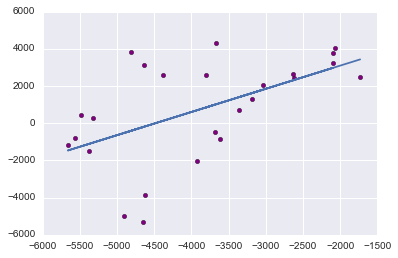

(1.2466029913377836, 5588.9768080489648, 0.54701354388738777)
75
Multnomah, OR


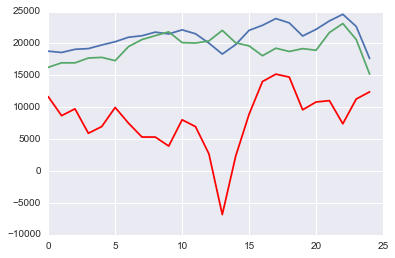

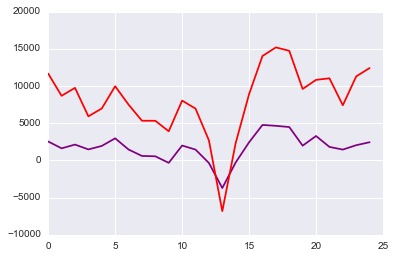

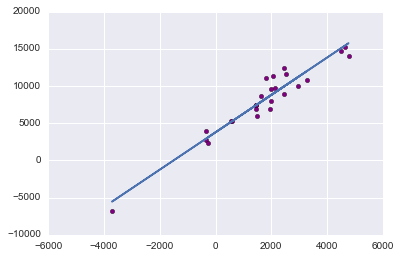

(2.5119507969498844, 3784.0224217618061, 0.96129091623094587)
76
Essex, MA


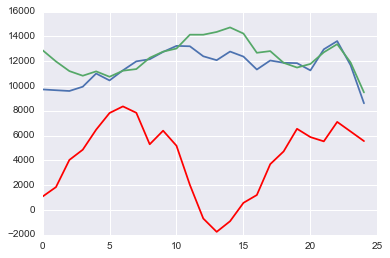

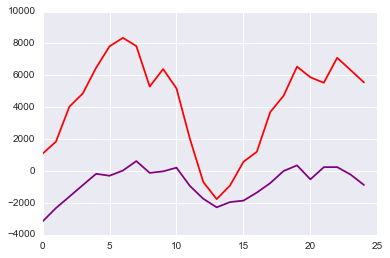

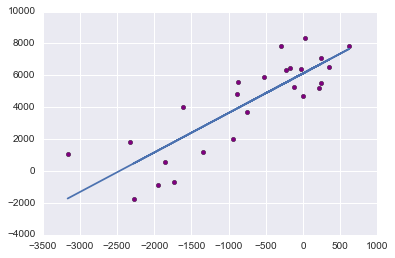

(2.4806487250247073, 6121.9774688631296, 0.84689207835577307)
77
Suffolk, MA


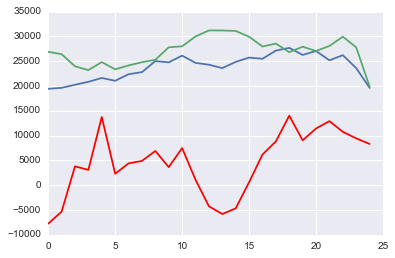

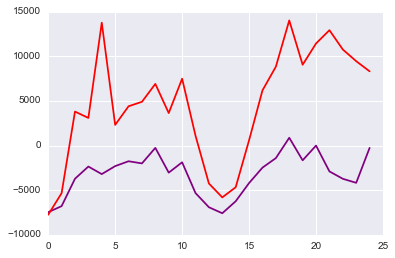

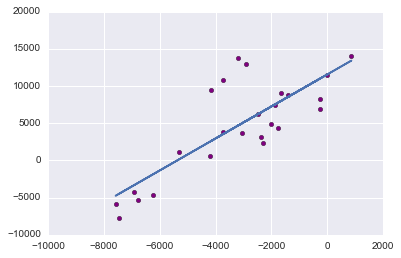

(2.1496381031374434, 11551.106262484969, 0.80517545585894357)
78
Oklahoma, OK


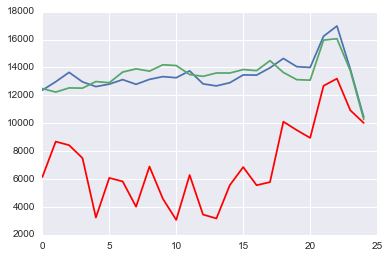

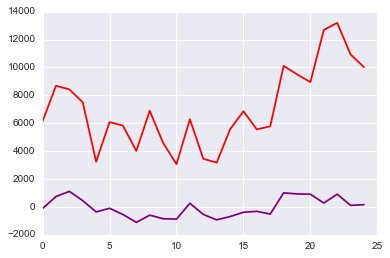

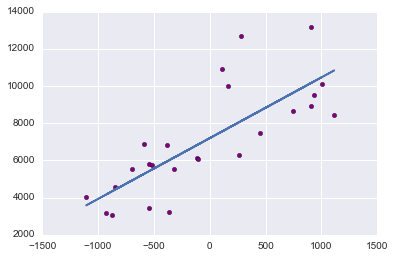

(3.2649910890645364, 7195.9002253842737, 0.77534813550841053)
79
Jefferson, KY


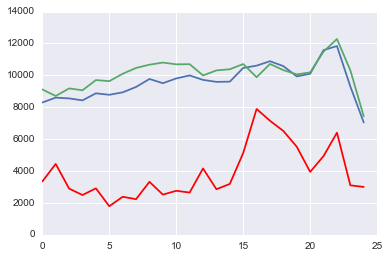

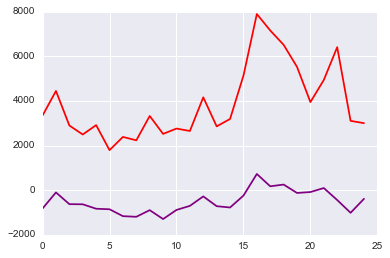

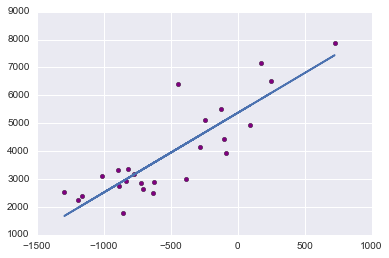

(2.8544080660401829, 5368.4531011050294, 0.86289042135653016)
80
Snohomish, WA


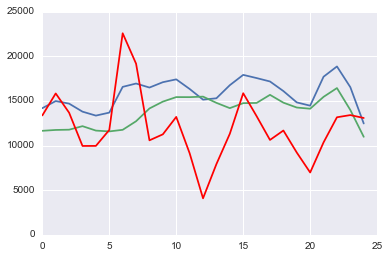

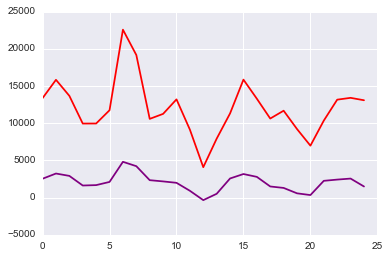

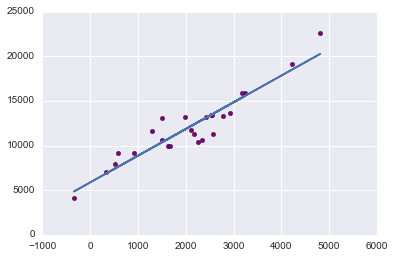

(2.9928908356906256, 5868.4994768592078, 0.93461121763179245)
81
San Mateo, CA


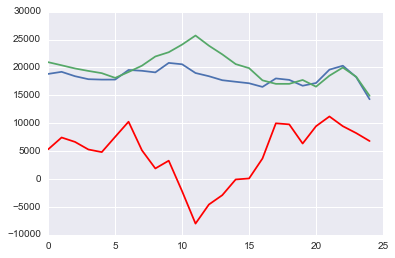

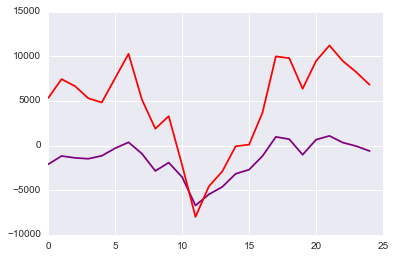

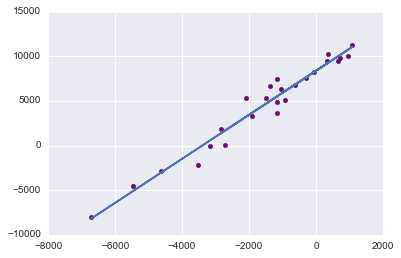

(2.4651759831135114, 8374.300749815302, 0.97891550006996797)
82
Denton, TX


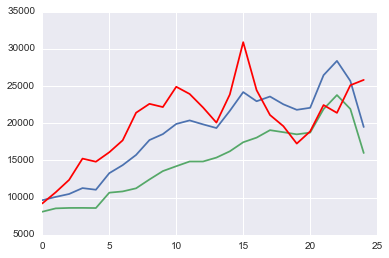

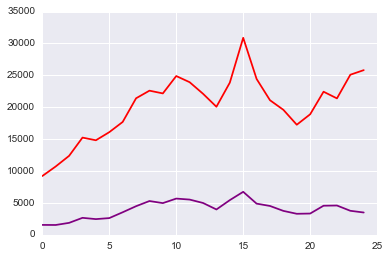

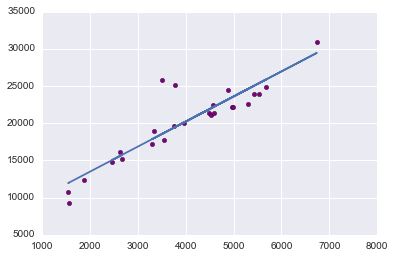

(3.3646534592737845, 6770.8741311089834, 0.90203314391220879)
83
Monroe, NY


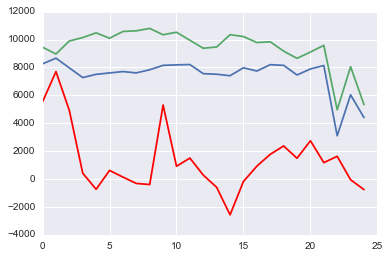

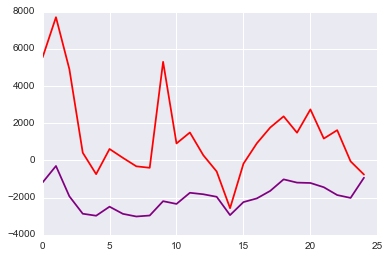

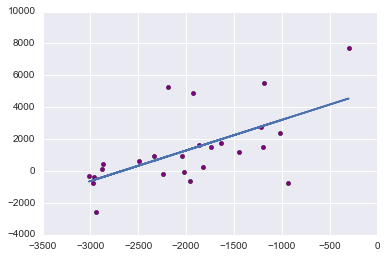

(1.9182809802666769, 5125.5631192511355, 0.60743327074160314)
84
Cobb, GA


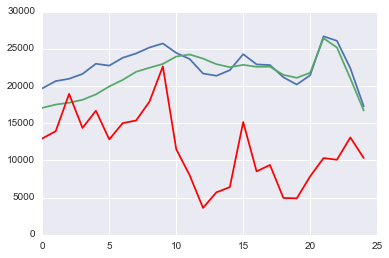

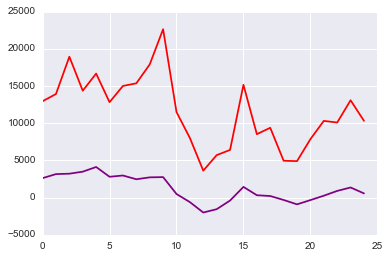

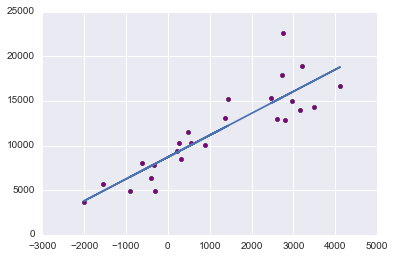

(2.4517144416557231, 8702.2044889586723, 0.88073514081916926)
85
DeKalb, GA


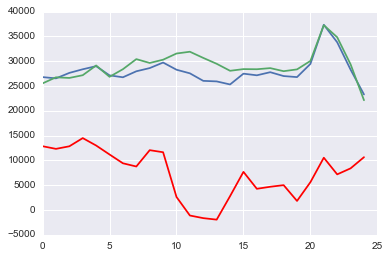

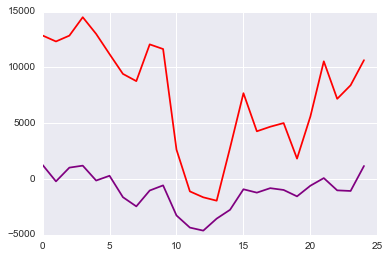

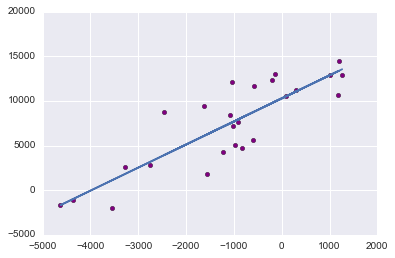

(2.5842787731747743, 10278.636634336977, 0.85806142691570209)
86
San Joaquin, CA


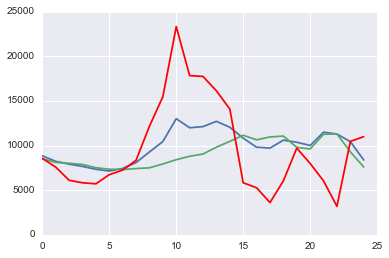

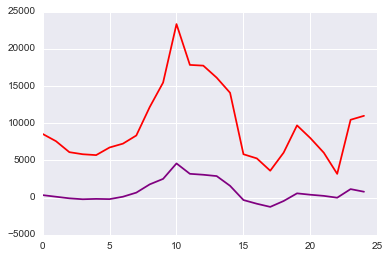

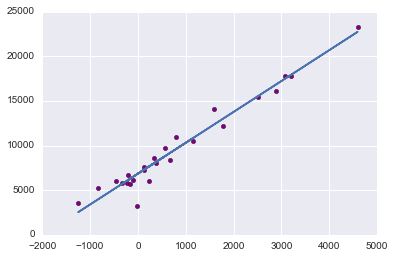

(3.4571658363933278, 6855.4635181008416, 0.97685605140199994)
87
Lake, IL


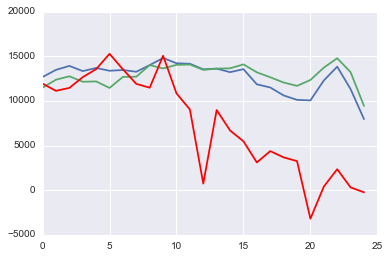

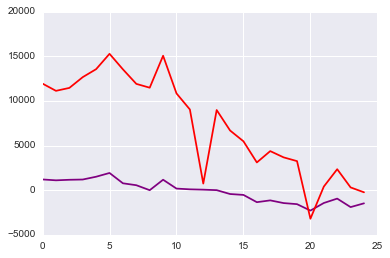

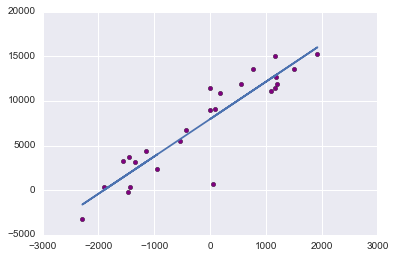

(4.1810744514351317, 7952.499907809176, 0.9186329910301686)
88
Norfolk, MA


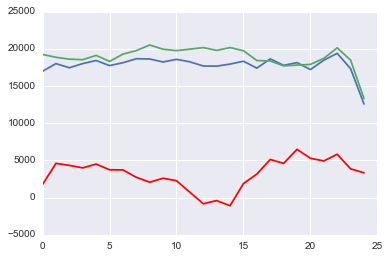

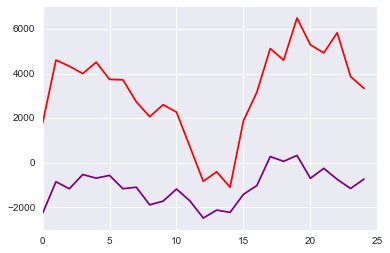

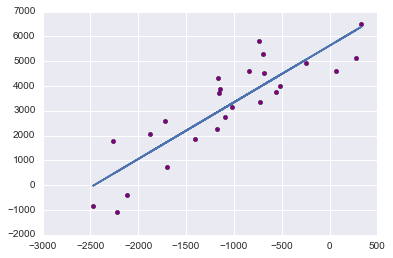

(2.2850100738084635, 5626.3512337765742, 0.87568256843077585)
89
Fort Bend, TX


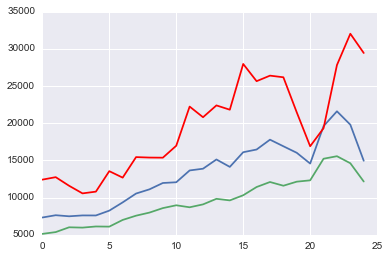

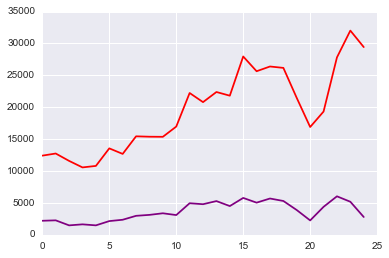

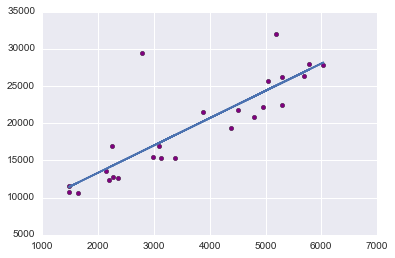

(3.6697256316417883, 6006.8460048002489, 0.84440860248904381)
90
Will, IL


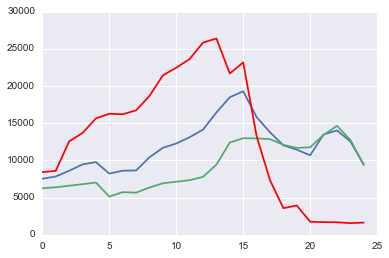

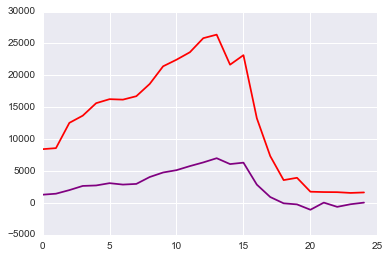

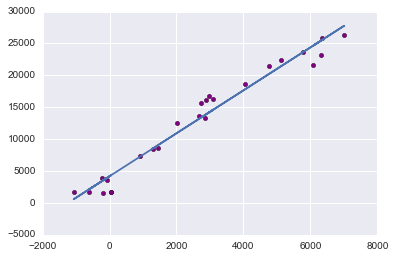

(3.3664075525093931, 4185.6590774639935, 0.98211591210944293)
91
Jackson, MO


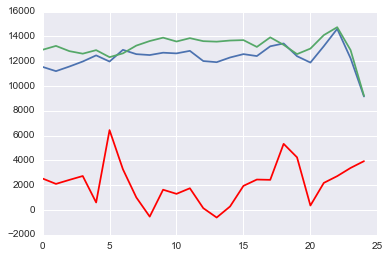

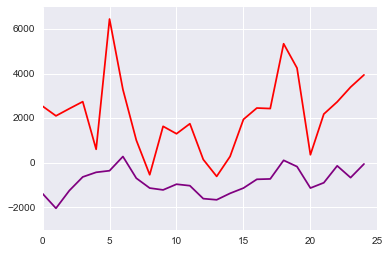

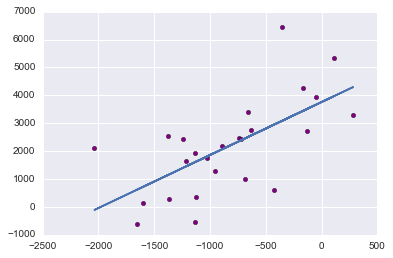

(1.8996721032852355, 3758.0533799434506, 0.64524849105249527)
92
Lee, FL


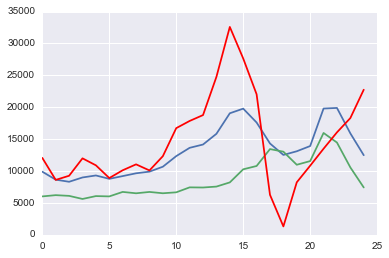

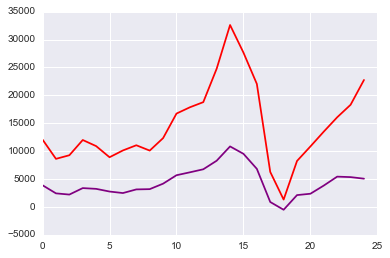

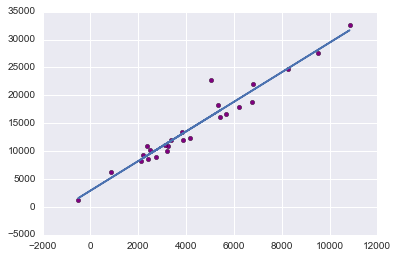

(2.6522134202202143, 2913.4566928740023, 0.97270493212750897)
93
Bernalillo, NM


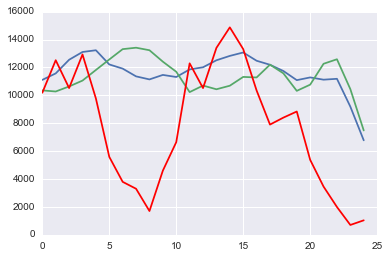

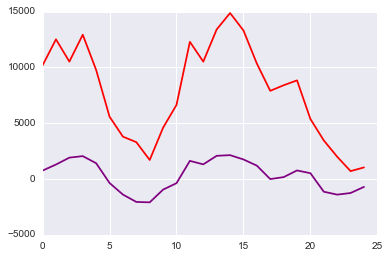

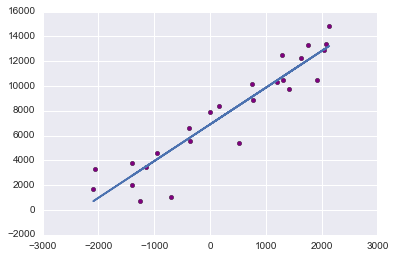

(2.9596497742494199, 6901.2615654676683, 0.93597138271036973)
94
Hudson, NJ


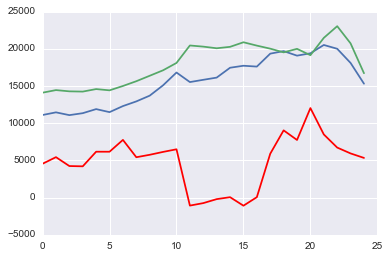

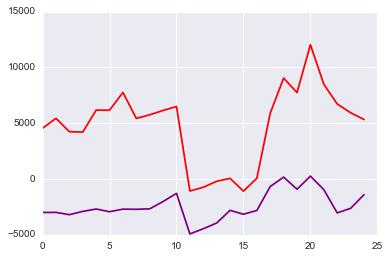

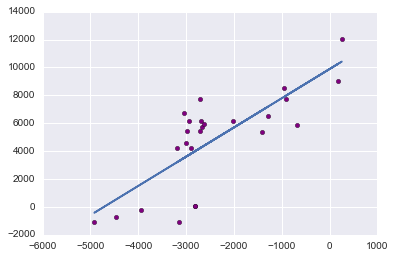

(2.0946026943067109, 9881.9374047983802, 0.77866813726757267)
95
Davidson, TN


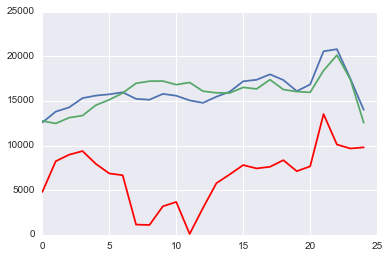

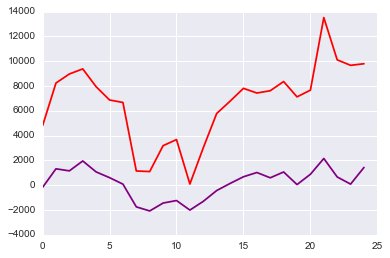

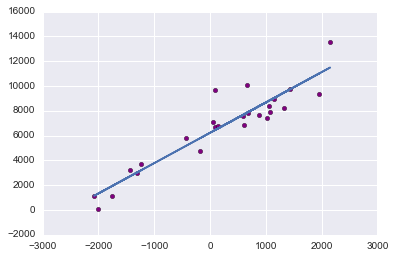

(2.4462104712788761, 6224.2026037141377, 0.93140659256733183)
96
Denver, CO


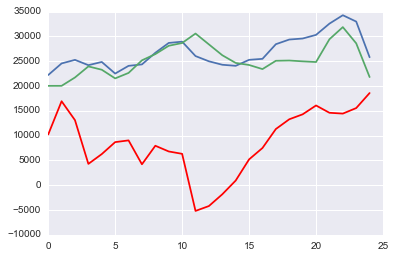

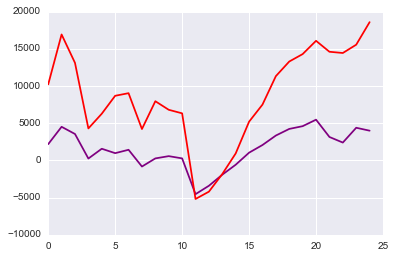

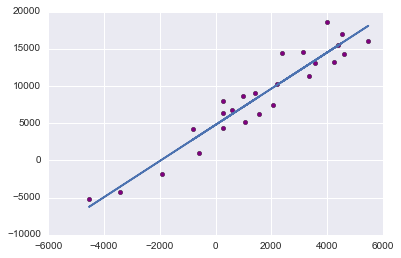

(2.431619498701437, 4784.2752889450312, 0.95444790163136095)
97
El Paso, CO


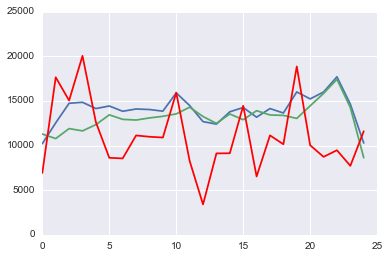

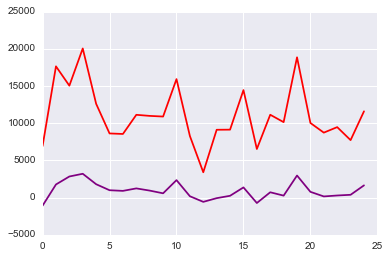

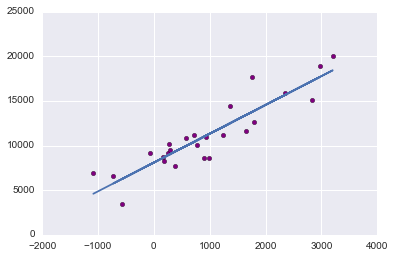

(3.2231637843519678, 8097.6445729230563, 0.90627593979954768)
98
Jefferson, AL


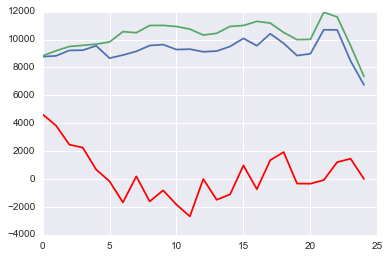

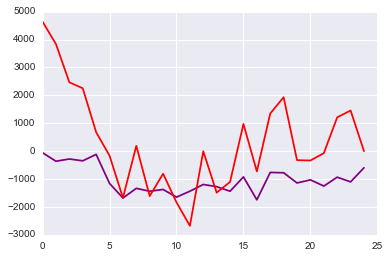

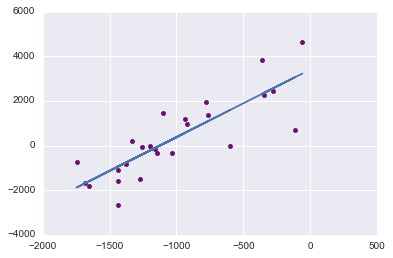

(3.0300055515270765, 3407.7264479015867, 0.83515615594344583)
99
District of Columbia, DC


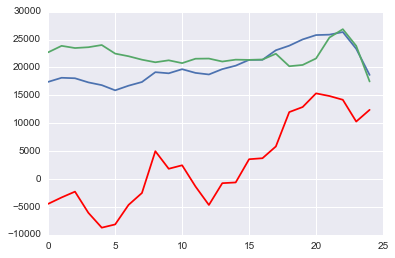

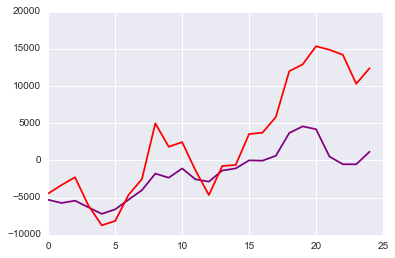

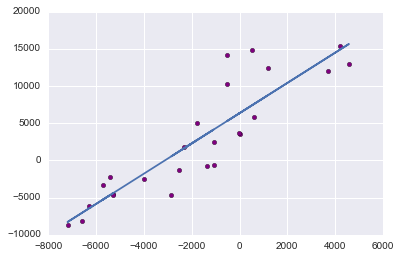

(2.0333459581397362, 6345.1681130290144, 0.88846724134354338)


In [41]:
##now Ill format data for it to be on the r_ij format
a=list(csv.reader(open('BEA_County_Population_1969_2015(1).csv')))
topCode=[codeS for (newestS,codeS) in sorted(zip(newest,code))]
topCode=topCode[::-1]
topCode=topCode[:100]
print topCode


topInd=[indexcountS for (newestS,indexcountS) in sorted(zip(newest,indexcount))]
topInd=topInd[::-1]
topInd=topInd[:100]
print topInd

bigmigevent=0
SLOP=[] #will contain all slopes 
INTER=[] #will contain all intercepts
RS=[]
for i in range(len(topCode)):
    print i

    rank=i
    print top[rank]
    c=(a[topInd[rank]][8:-1])
    ome=diff((np.array(c, dtype=np.int)))[-25:] #25 years worth of data
    
    
    
    element5=topCode[rank]
    IN=[]
    IN.append(zeros(size(mig[1])))
    for element in mig:
        if ((element[1])==element5):
            IN.append(np.array(element,dtype=np.int))

        
    OUT=[]
    OUT.append(zeros(size(mig[1])))
    for element in mig:
        if ((element[0])==element5):
            OUT.append(np.array(element,dtype=np.int))

    outs=(array(OUT, dtype=np.int)[:,2:])
    ins=(array(IN, dtype=np.int)[:,2:])
    lediff=sum(ins.T,1)-sum(outs.T,1)
    bigmigevent+=sum(sum(ins.T,1))+sum(sum(outs.T,1))
    
    plot(sum(ins.T,1))
    plot(sum(outs.T,1))
    plot(ome,c='r')
    show()
    
    plot(lediff,c='purple')
    plot(ome,c='r')
    show()
    
    scatter(lediff,ome,c='purple')
    xx=lediff
    yy=ome
    slope, intercept, r_value, p_value, std_err = stats.linregress(xx,yy)
    plot(xx,xx*slope+intercept)
    show()
    print(slope, intercept,r_value)
   
    SLOP.append(slope)
    INTER.append(intercept)
    RS.append(r_value)
    
    
    #ranks
    c=(a[topInd[rank]][8:-1])
    ome=(np.array(c, dtype=np.int))[-27:]

    element5=topCode[rank]
    INrate=[]
    for element in mig:
        if ((element[1])==element5):
            INrate.append(np.array(element,dtype=np.int)/ome)

        
    OUTrate=[]
    for element in mig:
        if ((element[0])==element5):
            c=(a[topInd[rank]][8:-1])
            ome=(np.array(c, dtype=np.int))[-27:]
            OUTrate.append(np.array(element,dtype=np.int))


    
    


In [42]:
totmigevetnt=sum(array(mig[1:], dtype=np.int)[:,2:]).flatten()
print totmigevetnt,"only a third of the population has moved in the las 15y"
print bigmigevent, "number of migration events in the top 100 counties" 
print bigmigevent/float(totmigevetnt),"fraction of the total moves of moves \n performed from and to the top 100 counties in 2015"

[129784208] only a third of the population has moved in the las 15y
117376861 number of migration events in the top 100 counties
0.904400179412 fraction of the total moves of moves 
 performed from and to the top 100 counties in 2015


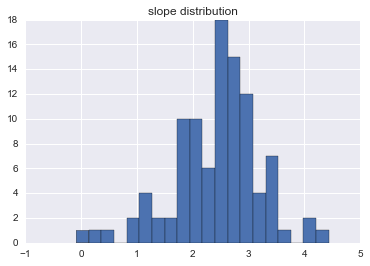

(2.4248757771068492, 0.77028718025437692)


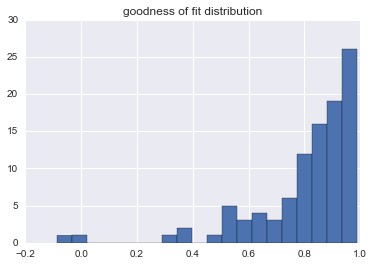

(0.80324070876163733, 0.19261216128626721)


In [43]:
#statistics on the linear fit between flows from data and calculated from occupations
SLOP= [x for x in SLOP if str(x) != 'nan']
title("slope distribution")
hist(SLOP, bins=20)
plt.show()
print(mean(SLOP),std(SLOP))
title("goodness of fit distribution")
hist(RS, bins=20)
plt.show()
print(mean(RS),std(RS))


In [44]:
#https://taxfoundation.org/number-americans-outside-income-tax-system-continues-grow/